In [1]:
pip install astroquery

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.2/910.2 kB 17.7 MB/s eta 0:00:00


In [3]:
pip install ephem


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 10.9 MB/s eta 0:00:00


In [11]:
# Display the columns available in the ephemerides data
print(eph_data.columns)


<TableColumns names=('targetname','datetime_str','datetime_jd','solar_presence','lunar_presence','RA','DEC','RA_app','DEC_app','RA_rate','DEC_rate','AZ','EL','AZ_rate','EL_rate','sat_X','sat_Y','sat_PANG','siderealtime','airmass','magextinct','V','surfbright','illumination','illum_defect','sat_sep','sat_vis','ang_width','PDObsLon','PDObsLat','PDSunLon','PDSunLat','SubSol_ang','SubSol_dist','NPole_ang','NPole_dist','EclLon','EclLat','r','r_rate','delta','delta_rate','lighttime','vel_sun','vel_obs','elong','elongFlag','alpha','lunar_elong','lunar_illum','sat_alpha','sunTargetPA','velocityPA','OrbPlaneAng','constellation','TDB-UT','ObsEclLon','ObsEclLat','NPole_RA','NPole_DEC','GlxLon','GlxLat','solartime','earth_lighttime','RA_3sigma','DEC_3sigma','SMAA_3sigma','SMIA_3sigma','Theta_3sigma','Area_3sigma','RSS_3sigma','r_3sigma','r_rate_3sigma','SBand_3sigma','XBand_3sigma','DoppDelay_3sigma','true_anom','hour_angle','alpha_true','PABLon','PABLat')>


In [ ]:
from astroquery.jplhorizons import Horizons
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2002-12-31'
step_size = '1d'  # One data point per day

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, start=start_time, end=end_time, step=step_size)

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Extract relevant data (percentage of illumination and time)
illumination_percentage = eph_data['PCT illuminated']
times = eph_data['datetime_str']

# Create a DataFrame
data = pd.DataFrame({'Time': times, 'Percentage of Illumination': illumination_percentage})

# Save the DataFrame to a CSV file
data.to_csv('illumination_data.csv', index=False)

print("Data saved to 'illumination_data.csv' successfully.")


# Illumination Point vs time: one month for one year (2002)

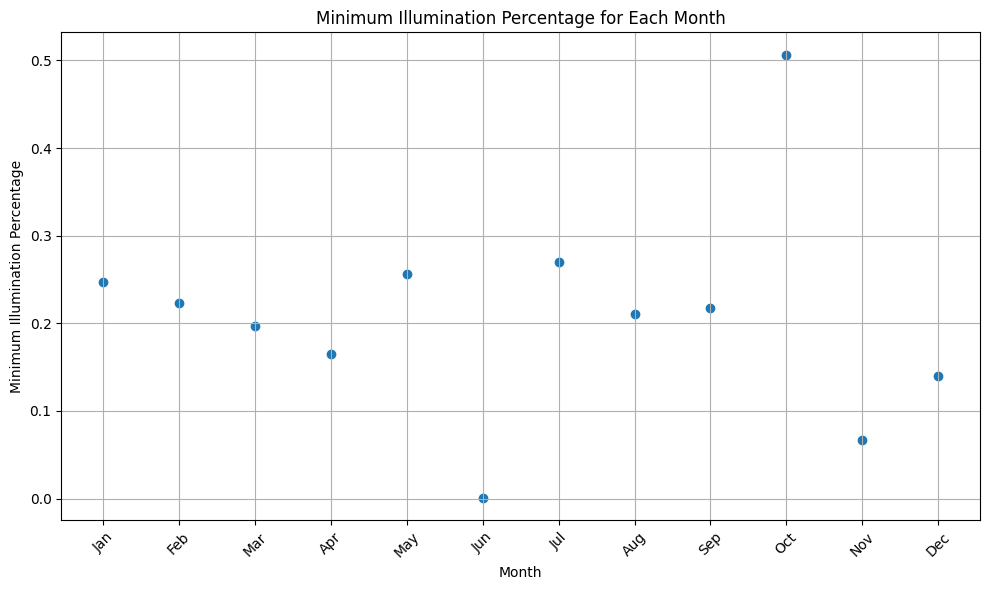

In [15]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2002-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month
eph_data_monthly = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))

# Calculate the minimum illumination percentage for each month
monthly_min_illumination = eph_data_monthly['illumination'].min()

# Extract month names
month_names = monthly_min_illumination.index.strftime('%b')

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(month_names, monthly_min_illumination)
plt.xlabel('Month')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage for Each Month')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


- Split the time range into months.
- For each month, find the minimum percentage of illumination.
- Plot a scatter plot of the minimum illumination percentage for each month.



# Illumination Point vs time: one month for one year (2002-2021)

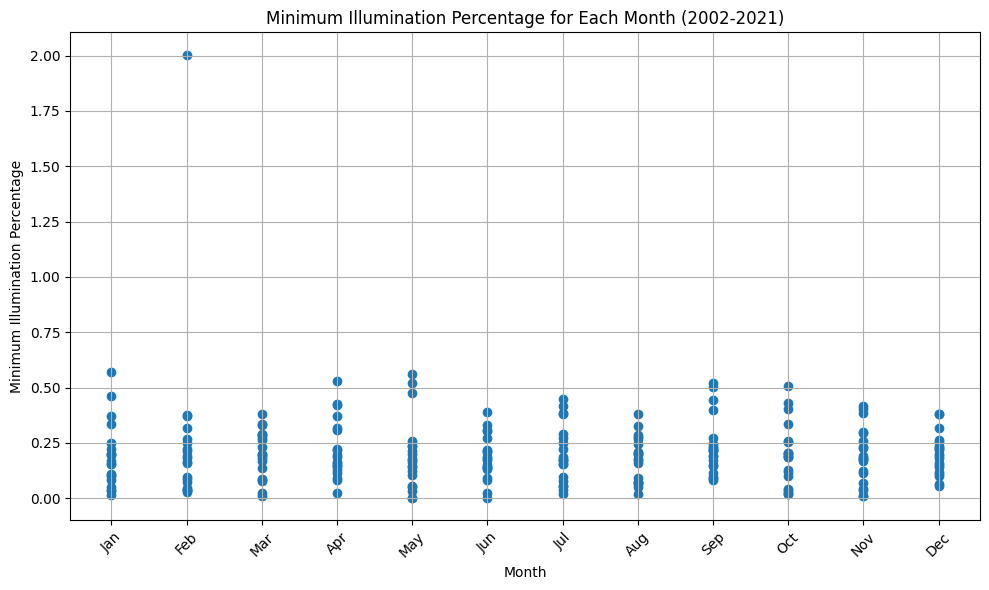

In [3]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month
eph_data_monthly = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))

# Calculate the minimum illumination percentage for each month
monthly_min_illumination = eph_data_monthly['illumination'].min()

# Extract month names
month_names = monthly_min_illumination.index.strftime('%b')

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(month_names, monthly_min_illumination)
plt.xlabel('Month')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


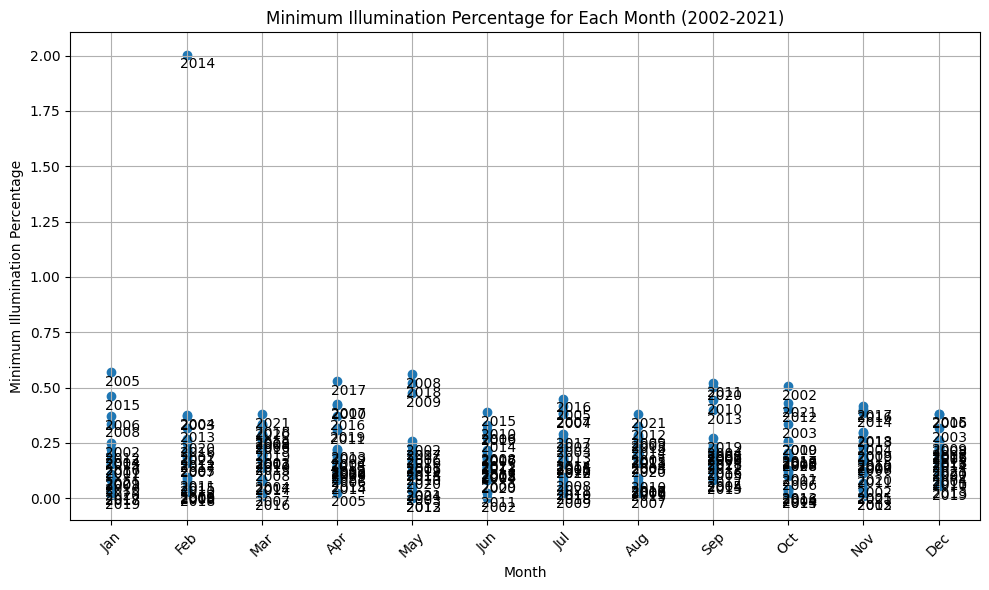

In [4]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month
eph_data_monthly = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))

# Calculate the minimum illumination percentage for each month
monthly_min_illumination = eph_data_monthly['illumination'].min()

# Extract month names
month_names = monthly_min_illumination.index.strftime('%b')

# Extract years
years = monthly_min_illumination.index.year

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(month_names, monthly_min_illumination)
plt.xlabel('Month')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Annotate each point with the corresponding year
for i, txt in enumerate(years):
    plt.annotate(txt, (month_names[i], monthly_min_illumination[i]), xytext=(8,-10), textcoords='offset points', ha='center')

plt.tight_layout()
plt.show()


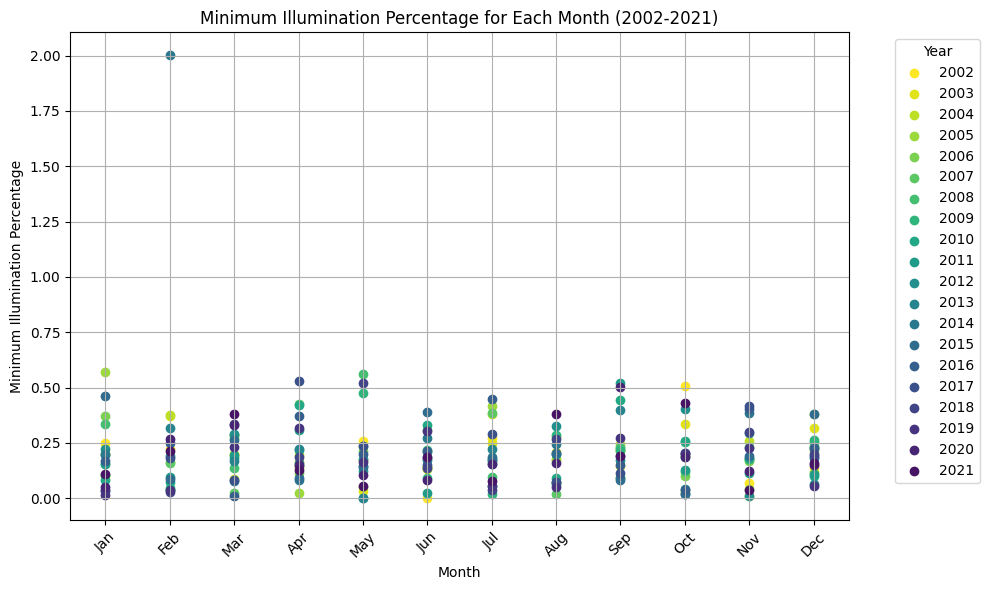

In [15]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month
eph_data_monthly = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))

# Calculate the minimum illumination percentage for each month
monthly_min_illumination = eph_data_monthly['illumination'].min()

# Extract month names
month_names = monthly_min_illumination.index.strftime('%b')

# Extract years
years = pd.to_datetime(monthly_min_illumination.index).year

# Create a list of unique years
unique_years = years.unique()

# Create a list of colors for each year
colors = plt.cm.viridis_r([i/len(unique_years) for i in range(len(unique_years))])

# Plotting
plt.figure(figsize=(10, 6))
for i, year in enumerate(unique_years):
    plt.scatter(month_names[years == year], monthly_min_illumination[years == year], label=str(year), color=colors[i])

plt.xlabel('Month')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Move the legend outside the graph
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


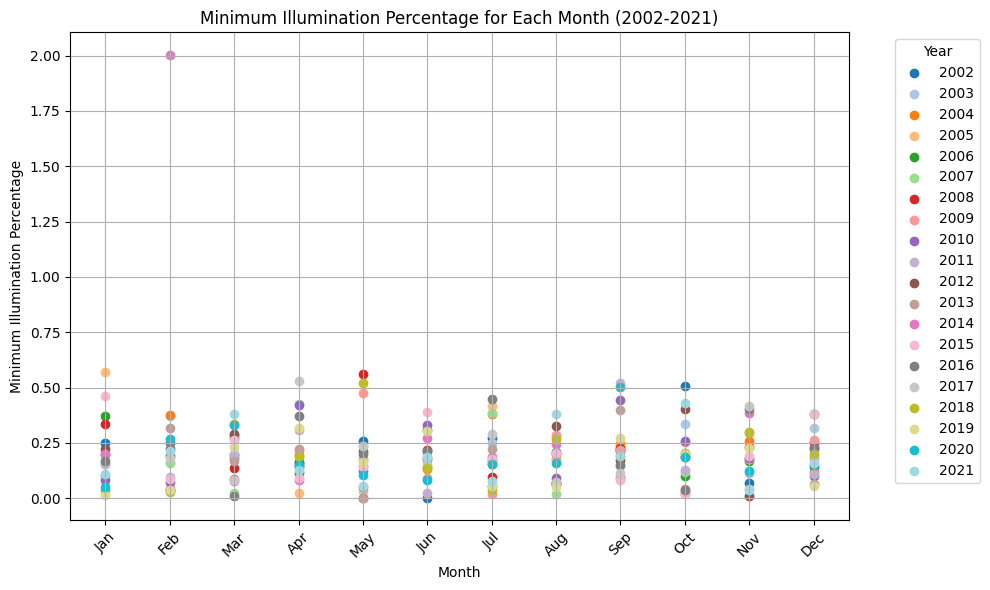

In [17]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month
eph_data_monthly = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))

# Calculate the minimum illumination percentage for each month
monthly_min_illumination = eph_data_monthly['illumination'].min()

# Extract month names
month_names = monthly_min_illumination.index.strftime('%b')

# Extract years
years = pd.to_datetime(monthly_min_illumination.index).year

# Create a list of unique years
unique_years = years.unique()

# Create a list of colors for each year using the Tab20 colormap
colors = plt.cm.tab20(range(len(unique_years)))

# Plotting
plt.figure(figsize=(10, 6))
for i, year in enumerate(unique_years):
    plt.scatter(month_names[years == year], monthly_min_illumination[years == year], label=str(year), color=colors[i])

plt.xlabel('Month')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Move the legend outside the graph
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


# The median illumination percentage for each month

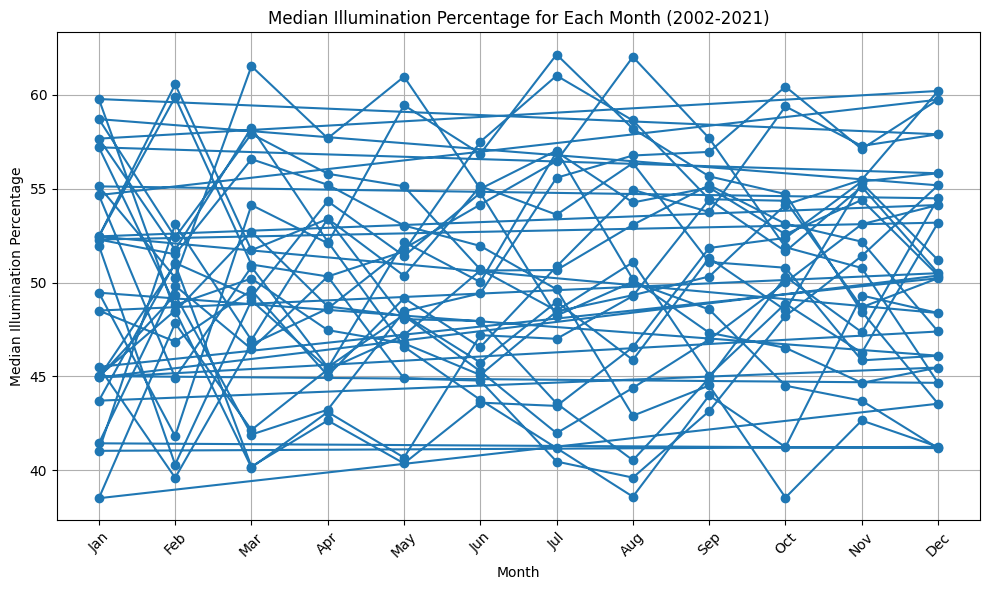

In [5]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month and calculate the median illumination percentage for each month
monthly_median_illumination = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))['illumination'].median()

# Extract month names
month_names = monthly_median_illumination.index.strftime('%b')

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(month_names, monthly_median_illumination, marker='o')
plt.xlabel('Month')
plt.ylabel('Median Illumination Percentage')
plt.title('Median Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


This code will calculate the median illumination percentage for each month and plot it as a line graph. Adjust the parameters as needed for your specific analysis.




In [25]:
#plot the median illumination percentage for each month from 2002 to 2021 with each year represented by a distinct color and labeled in the legend.
'''from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Group data by year and month, and calculate the median illumination percentage for each month
monthly_median_illumination = eph_data_df.groupby([eph_data_df.index.year, eph_data_df.index.month])['illumination'].median()

# Reset the index to make year and month columns accessible
monthly_median_illumination = monthly_median_illumination.reset_index()

# Extract unique years
unique_years = sorted(eph_data_df.index.year.unique())

# Define colors for each year
colors = plt.cm.viridis_r(range(len(unique_years)))

# Plotting
plt.figure(figsize=(10, 6))

for year, color in zip(unique_years, colors):
    year_data = monthly_median_illumination[monthly_median_illumination['datetime'] == year]
    month_names = pd.to_datetime(year_data['datetime'], format='%m').dt.strftime('%b')
    plt.plot(month_names, year_data['illumination'], marker='o', label=str(year), color=color)

plt.xlabel('Month')
plt.ylabel('Median Illumination Percentage')
plt.title('Median Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()'''


"from astroquery.jplhorizons import Horizons\nimport matplotlib.pyplot as plt\nimport pandas as pd\n\n# Define parameters\ntarget_object_id = '301'  # For example, '301' corresponds to the Moon\nobserver_location = '500@399'  # Observer location code, e.g., geocentric\nstart_time = '2002-01-01'\nend_time = '2021-12-31'\n\n# Create Horizons query object\nobj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})\n\n# Retrieve ephemeris data\neph_data = obj.ephemerides()\n\n# Convert ephemeris data to a DataFrame\neph_data_df = eph_data.to_pandas()\n\n# Group data by year and month, and calculate the median illumination percentage for each month\nmonthly_median_illumination = eph_data_df.groupby([eph_data_df.index.year, eph_data_df.index.month])['illumination'].median()\n\n# Reset the index to make year and month columns accessible\nmonthly_median_illumination = monthly_median_illumination.reset_index()\n\n# Extract uniqu

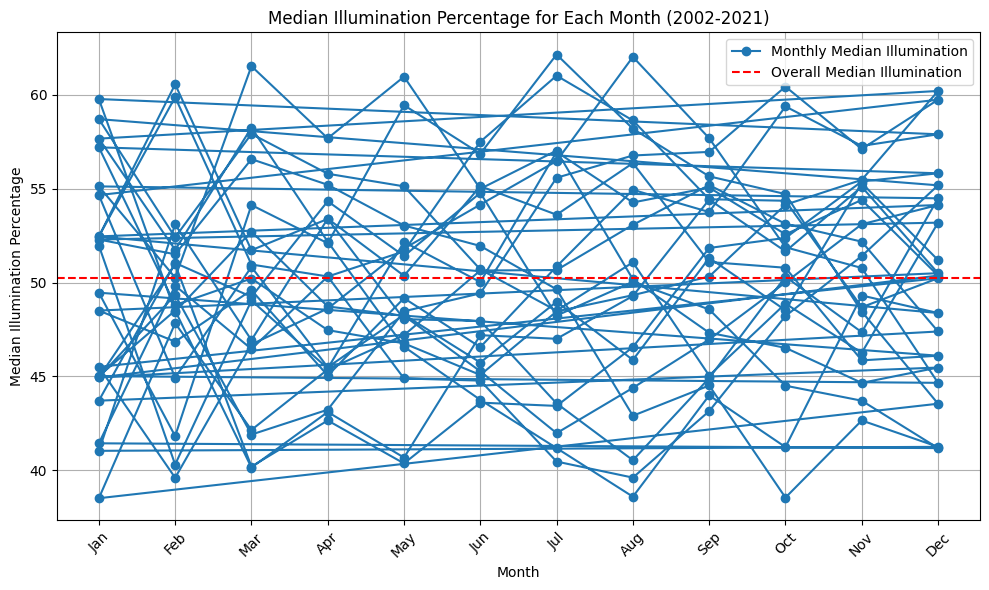

In [6]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import pandas as pd

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2021-12-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Convert ephemeris data to a DataFrame
eph_data_df = eph_data.to_pandas()

# Convert datetime strings to datetime objects
eph_data_df['datetime'] = pd.to_datetime(eph_data_df['datetime_str'])

# Group data by month and calculate the median illumination percentage for each month
monthly_median_illumination = eph_data_df.groupby(pd.Grouper(key='datetime', freq='M'))['illumination'].median()

# Calculate the median illumination percentage for all months combined
overall_median_illumination = monthly_median_illumination.median()

# Plotting
plt.figure(figsize=(10, 6))

# Plot monthly median illumination percentages
plt.plot(monthly_median_illumination.index.strftime('%b'), monthly_median_illumination, marker='o', label='Monthly Median Illumination')

# Plot overall median illumination percentage
plt.axhline(y=overall_median_illumination, color='r', linestyle='--', label='Overall Median Illumination')

plt.xlabel('Month')
plt.ylabel('Median Illumination Percentage')
plt.title('Median Illumination Percentage for Each Month (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.tight_layout()
plt.show()


# 365 days of min illumnation point

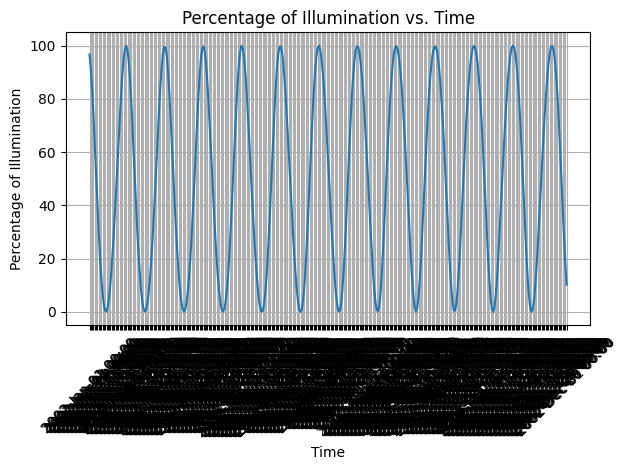

In [13]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2002-12-31'
step_size = '1d'  # One data point per day

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': step_size})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Extract relevant data (illumination percentage)
illumination_percentage = eph_data['illumination']

# Convert times to datetime objects if necessary
times = eph_data['datetime_str']

# Plotting
plt.plot(times, illumination_percentage)
plt.xlabel('Time')
plt.ylabel('Percentage of Illumination')
plt.title('Percentage of Illumination vs. Time')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


This code will retrieve ephemeris data for the specified celestial object and observer location over the specified time range. It will then extract the illumination percentage from the data and plot it against time using Matplotlib. Adjust the parameters as needed for your specific analysis.








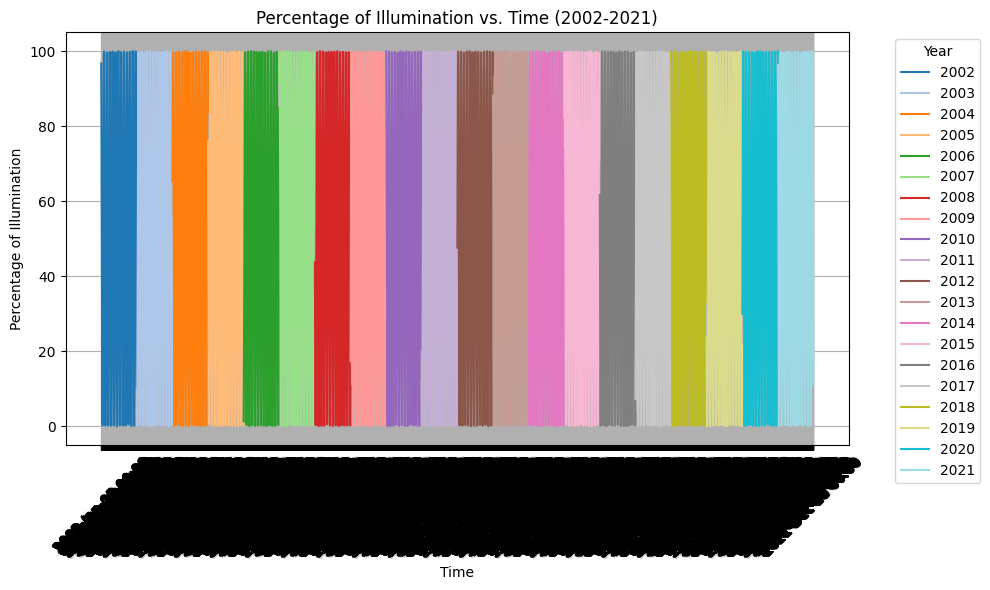

In [27]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import numpy as np

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_year = 2002
end_year = 2021
step_size = '1d'  # One data point per day

# Create empty lists to store data for plotting
all_times = []
all_illumination_percentage = []

# Loop through each year from start_year to end_year
for year in range(start_year, end_year + 1):
    # Define start and end time for the current year
    start_time = f'{year}-01-01'
    end_time = f'{year}-12-31'

    # Create Horizons query object for the current year
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': step_size})

    # Retrieve ephemeris data for the current year
    eph_data = obj.ephemerides()

    # Extract relevant data (illumination percentage) for the current year
    illumination_percentage = eph_data['illumination']

    # Convert times to datetime objects if necessary
    times = eph_data['datetime_str']

    # Append data for the current year to the lists
    all_times.append(times)
    all_illumination_percentage.append(illumination_percentage)

# Plotting
plt.figure(figsize=(10, 6))

for year, times, illumination_percentage in zip(range(start_year, end_year + 1), all_times, all_illumination_percentage):
    # Define a unique color for each year
    color = plt.cm.tab20(np.interp(year, [start_year, end_year], [0, 1]))

    # Plot data for the current year
    plt.plot(times, illumination_percentage, label=str(year), color=color)

plt.xlabel('Time')
plt.ylabel('Percentage of Illumination')
plt.title('Percentage of Illumination vs. Time (2002-2021)')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


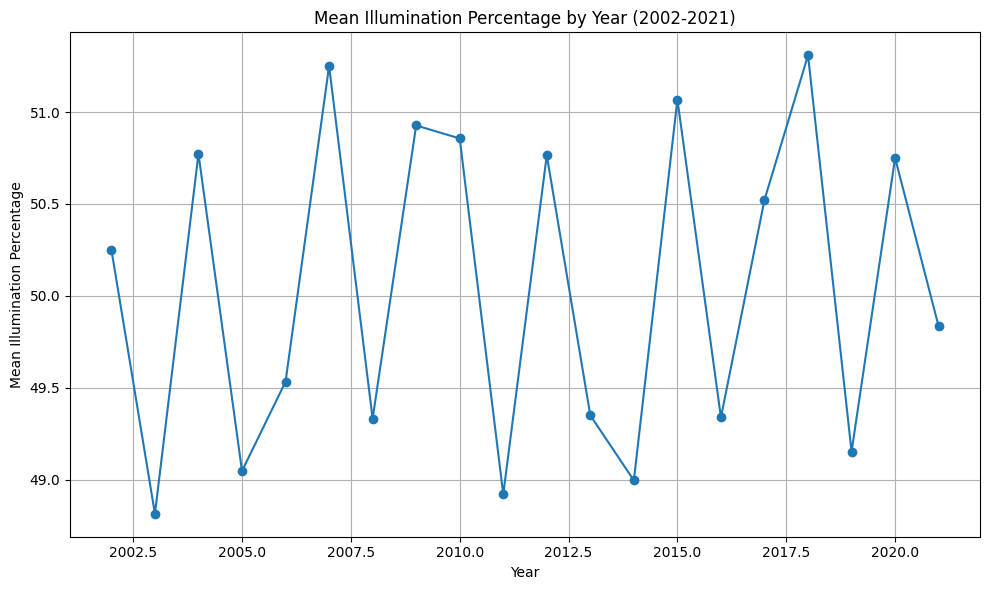

In [29]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_year = 2002
end_year = 2021

# Create empty lists to store data for plotting
years = []
mean_illumination_percentage = []

# Loop through each year from start_year to end_year
for year in range(start_year, end_year + 1):
    # Define start and end time for the current year
    start_time = f'{year}-01-01'
    end_time = f'{year}-12-31'

    # Create Horizons query object for the current year
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

    # Retrieve ephemeris data for the current year
    eph_data = obj.ephemerides()

    # Extract relevant data (illumination percentage) for the current year
    illumination_percentage = eph_data['illumination']

    # Calculate the mean illumination percentage for the current year
    mean_illumination = illumination_percentage.mean()

    # Append data for the current year to the lists
    years.append(year)
    mean_illumination_percentage.append(mean_illumination)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(years, mean_illumination_percentage, marker='o')

plt.xlabel('Year')
plt.ylabel('Mean Illumination Percentage')
plt.title('Mean Illumination Percentage by Year (2002-2021)')
plt.grid(True)
plt.tight_layout()
plt.show()


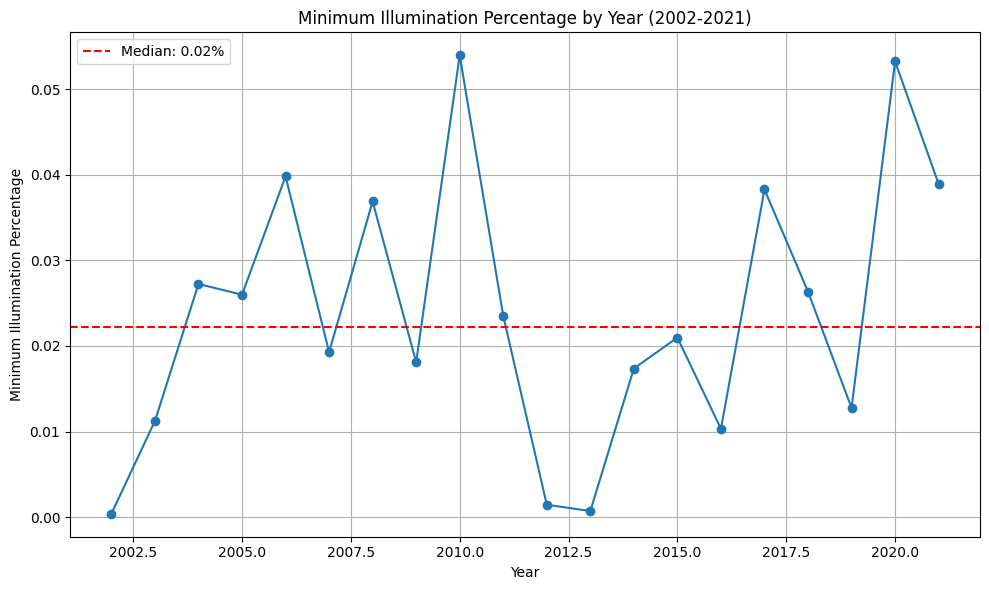

In [30]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import numpy as np

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_year = 2002
end_year = 2021

# Create empty lists to store data for plotting
years = []
median_min_illumination_percentage = []

# Loop through each year from start_year to end_year
for year in range(start_year, end_year + 1):
    # Define start and end time for the current year
    start_time = f'{year}-01-01'
    end_time = f'{year}-12-31'

    # Create Horizons query object for the current year
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

    # Retrieve ephemeris data for the current year
    eph_data = obj.ephemerides()

    # Extract relevant data (illumination percentage) for the current year
    illumination_percentage = eph_data['illumination']

    # Calculate the minimum illumination percentage for the current year
    min_illumination = illumination_percentage.min()

    # Append data for the current year to the lists
    years.append(year)
    median_min_illumination_percentage.append(min_illumination)

# Calculate the median of the minimum illumination percentage for each year
median_min_illumination_median = np.median(median_min_illumination_percentage)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(years, median_min_illumination_percentage, marker='o')

plt.axhline(y=median_min_illumination_median, color='r', linestyle='--', label=f'Median: {median_min_illumination_median:.2f}%')

plt.xlabel('Year')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage by Year (2002-2021)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


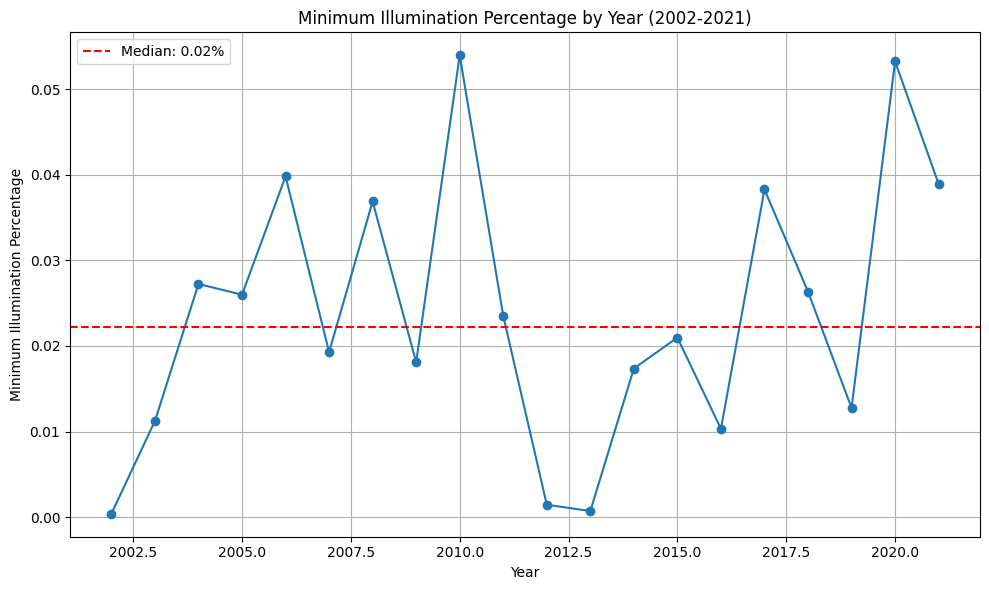

In [32]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import numpy as np

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_year = 2002
end_year = 2021

# Create empty lists to store data for plotting
years = []
median_min_illumination_percentage = []

# Loop through each year from start_year to end_year
for year in range(start_year, end_year + 1):
    # Define start and end time for the current year
    start_time = f'{year}-01-01'
    end_time = f'{year}-12-31'

    # Create Horizons query object for the current year
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

    # Retrieve ephemeris data for the current year
    eph_data = obj.ephemerides()

    # Extract relevant data (illumination percentage) for the current year
    illumination_percentage = eph_data['illumination']

    # Calculate the minimum illumination percentage for the current year
    min_illumination = illumination_percentage.min()

    # Append data for the current year to the lists
    years.append(year)
    median_min_illumination_percentage.append(min_illumination)

# Calculate the median of the minimum illumination percentage for each year
median_min_illumination_median = np.median(median_min_illumination_percentage)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(years, median_min_illumination_percentage, marker='o')

plt.axhline(y=median_min_illumination_median, color='r', linestyle='--', label=f'Median: {median_min_illumination_median:.2f}%')

plt.xlabel('Year')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage by Year (2002-2021)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


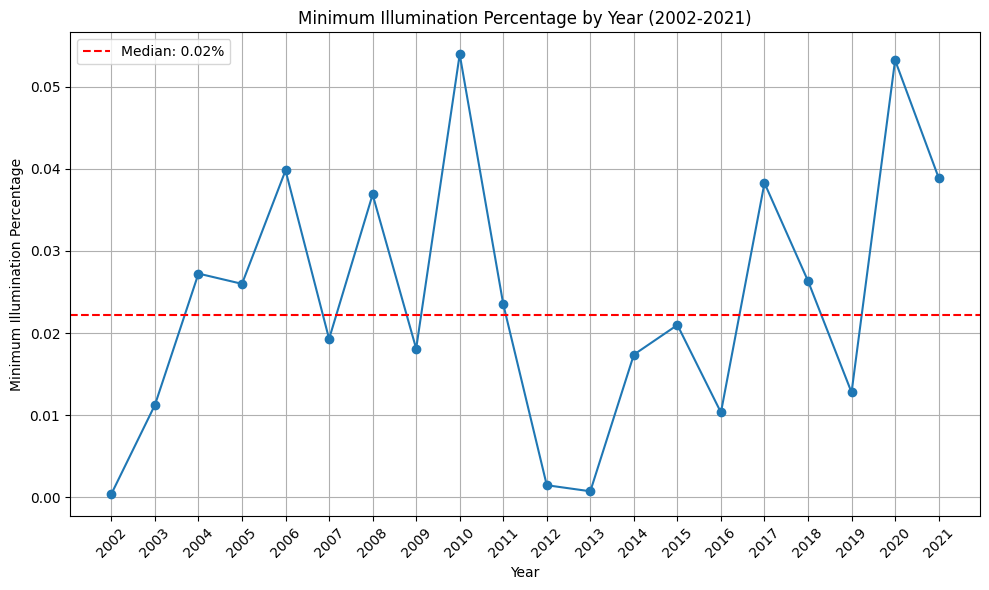

In [34]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import numpy as np

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_year = 2002
end_year = 2021

# Create empty lists to store data for plotting
years = []
median_min_illumination_percentage = []

# Loop through each year from start_year to end_year
for year in range(start_year, end_year + 1):
    # Define start and end time for the current year
    start_time = f'{year}-01-01'
    end_time = f'{year}-12-31'

    # Create Horizons query object for the current year
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

    # Retrieve ephemeris data for the current year
    eph_data = obj.ephemerides()

    # Extract relevant data (illumination percentage) for the current year
    illumination_percentage = eph_data['illumination']

    # Calculate the minimum illumination percentage for the current year
    min_illumination = illumination_percentage.min()

    # Append the minimum illumination percentage to the list for the current year
    median_min_illumination_percentage.append(min_illumination)

    # Append the year to the list
    years.append(year)

# Calculate the median of the minimum illumination percentage for each year
median_min_illumination_median = np.median(median_min_illumination_percentage)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(years, median_min_illumination_percentage, marker='o')

plt.axhline(y=median_min_illumination_median, color='r', linestyle='--', label=f'Median: {median_min_illumination_median:.2f}%')

plt.xlabel('Year')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage by Year (2002-2021)')
plt.grid(True)
plt.legend()
plt.xticks(range(start_year, end_year + 1), rotation=45)  # Set x-axis ticks for each year
plt.tight_layout()
plt.show()


#Point of Illumnation for one month for year 2002

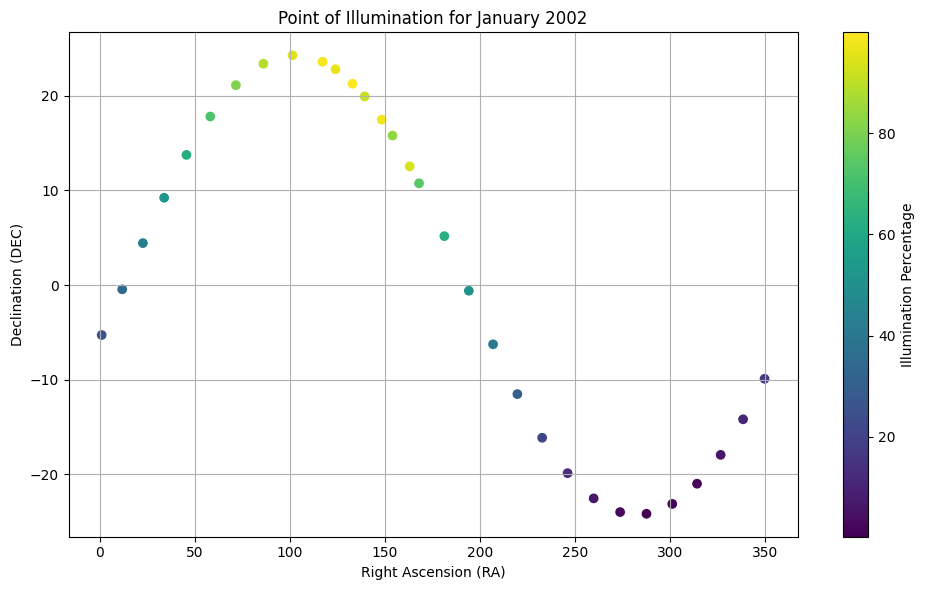

In [2]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2002-01-31'

# Create Horizons query object
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(eph_data['RA'], eph_data['DEC'], c=eph_data['illumination'], cmap='viridis')
plt.colorbar(label='Illumination Percentage')
plt.xlabel('Right Ascension (RA)')
plt.ylabel('Declination (DEC)')
plt.title('Point of Illumination for January 2002')
plt.grid(True)
plt.tight_layout()
plt.show()


This code queries the ephemeris data for the Moon for all days in January 2002 and plots the point of illumination on a celestial coordinate system. The illumination percentage is represented by the color of the points, with higher percentages indicated by warmer colors and lower percentages indicated by cooler colors.


Declination and right ascension are celestial coordinate systems used to specify the position of celestial objects in the sky, such as stars, galaxies, and planets. They are similar to latitude and longitude on Earth's surface but are projected onto the celestial sphere.

Declination (Dec): Declination is akin to latitude on Earth. It measures the angular distance of an object north or south of the celestial equator. Positive declination values indicate positions north of the celestial equator, while negative values indicate positions south of it. Declination is measured in degrees, with a range of -90° to +90°.
Right Ascension (RA): Right ascension is analogous to longitude on Earth. It measures the angular distance of an object eastward along the celestial equator from a reference point called the vernal equinox. Unlike declination, right ascension is measured in hours, minutes, and seconds, with a full circle (360 degrees) equivalent to 24 hours. This is due to the Earth's rotation causing the celestial sphere to appear to rotate around us in approximately 24 hours.
Together, declination and right ascension provide a coordinate system for specifying the position of celestial objects on the celestial sphere. By providing both the declination and right ascension of an object, astronomers can precisely locate it in the sky.

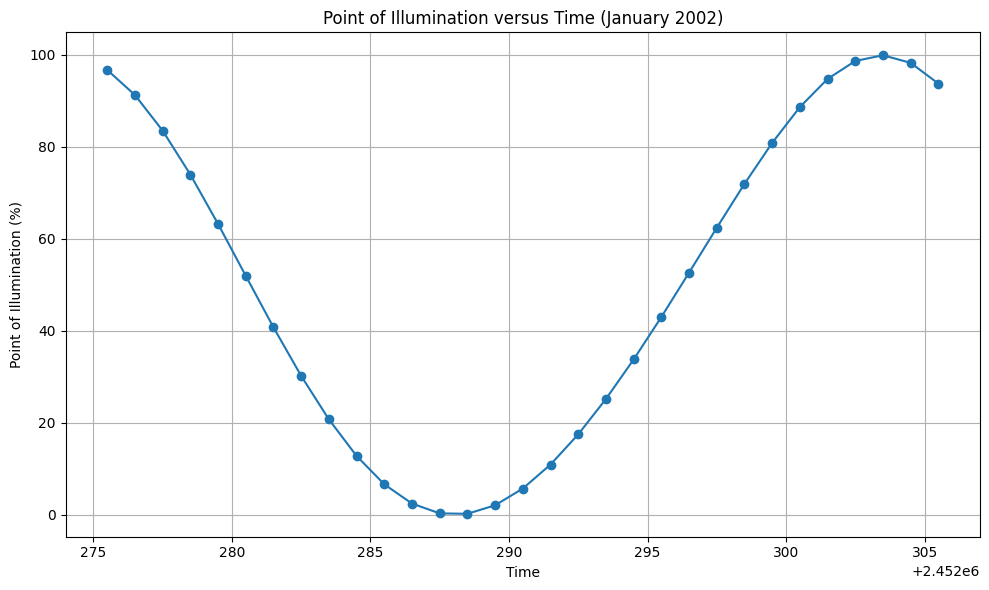

In [3]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_time = '2002-01-01'
end_time = '2002-01-31'

# Create Horizons query object for the entire month of January 2002
obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_time, 'stop': end_time, 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Extract time and point of illumination data
times = eph_data['datetime_jd']
illumination_percentage = eph_data['illumination']

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(times, illumination_percentage, marker='o', linestyle='-')

plt.xlabel('Time')
plt.ylabel('Point of Illumination (%)')
plt.title('Point of Illumination versus Time (January 2002)')
plt.grid(True)
plt.tight_layout()
plt.show()


JD stands for Julian Date, which is a continuous count of days since the beginning of the Julian Period, which started on January 1, 4713 BCE (Julian calendar). It's commonly used in astronomy and allows for a continuous representation of time without the need to account for leap years, months, or days.

In the context of the code, "time (JD)" refers to the time expressed in Julian Date format. It's a numerical representation of the date and time, where each day has a unique number. This format is often used in astronomical calculations and data representation because of its simplicity and continuity.

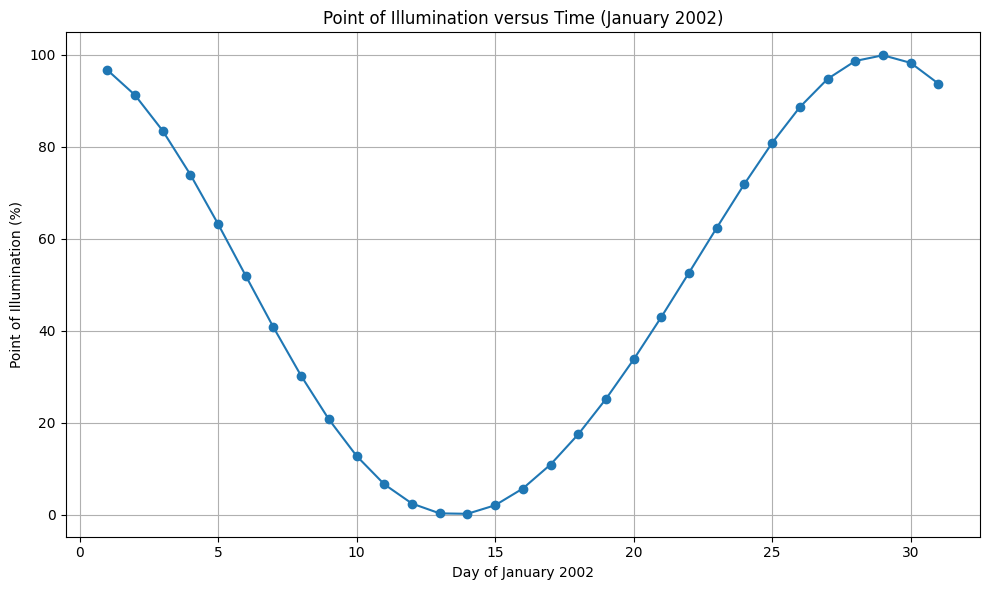

In [7]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric
start_date = datetime.datetime(2002, 1, 1)
end_date = datetime.datetime(2002, 1, 31)

# Create Horizons query object for the entire month of January 2002
obj = Horizons(id=target_object_id, location=observer_location,
               epochs={'start': start_date.strftime('%Y-%m-%d'),
                       'stop': end_date.strftime('%Y-%m-%d'),
                       'step': '1d'})

try:
    # Retrieve ephemeris data for the entire month of January 2002
    eph_data = obj.ephemerides()

    # Extract time and point of illumination data
    jd_times = eph_data['datetime_jd']
    illumination_percentages = eph_data['illumination']

    # Convert Julian Date to days relative to the start of January 2002
    start_jd = int(jd_times[0])
    days = [(int(jd) - start_jd) + 1 for jd in jd_times]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(days, illumination_percentages, marker='o', linestyle='-')

    plt.xlabel('Day of January 2002')
    plt.ylabel('Point of Illumination (%)')
    plt.title('Point of Illumination versus Time (January 2002)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"Error fetching data: {e}")


# Point of Illumnation for Every month in the year of 2002



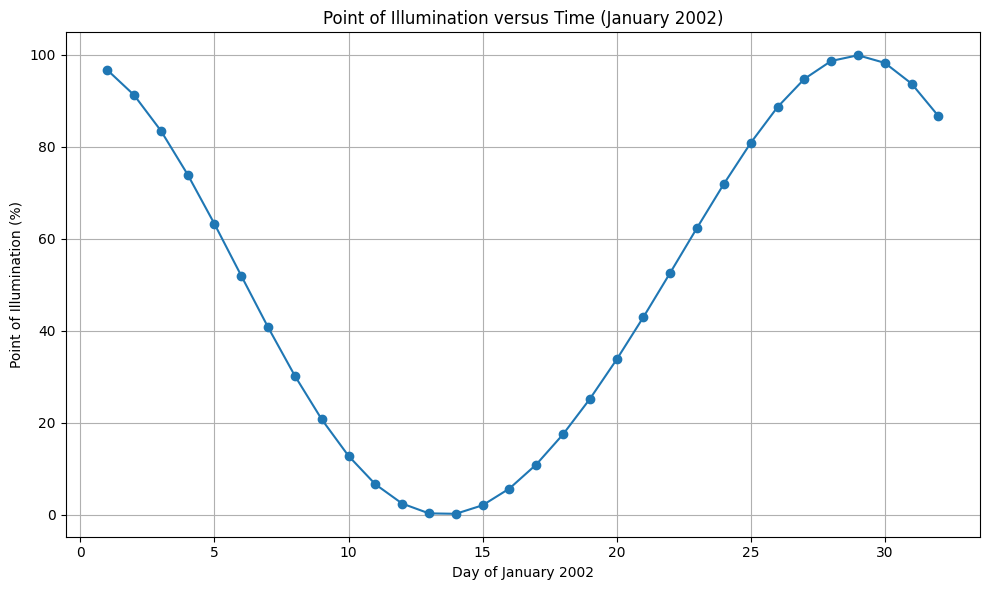

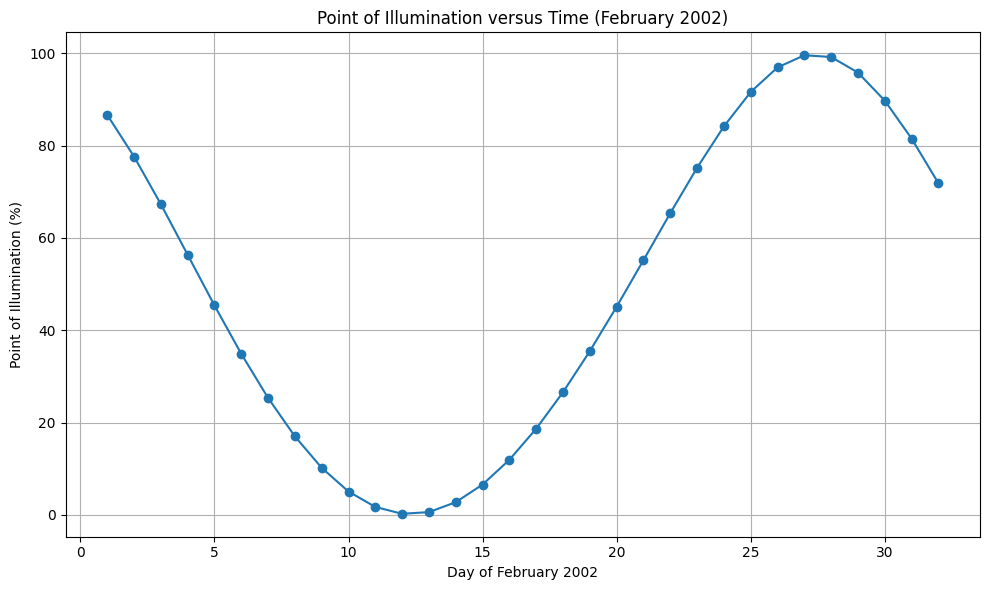

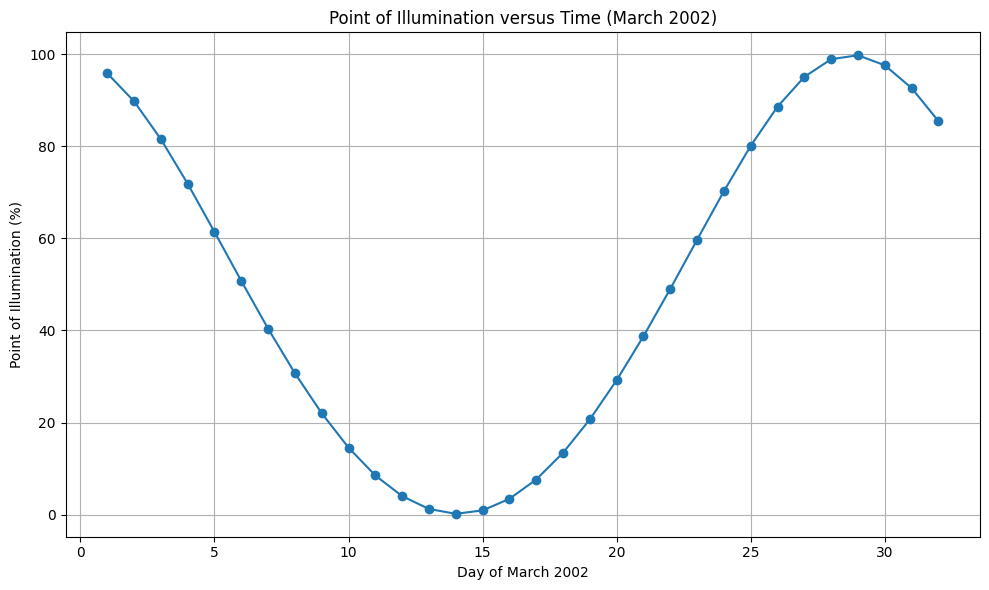

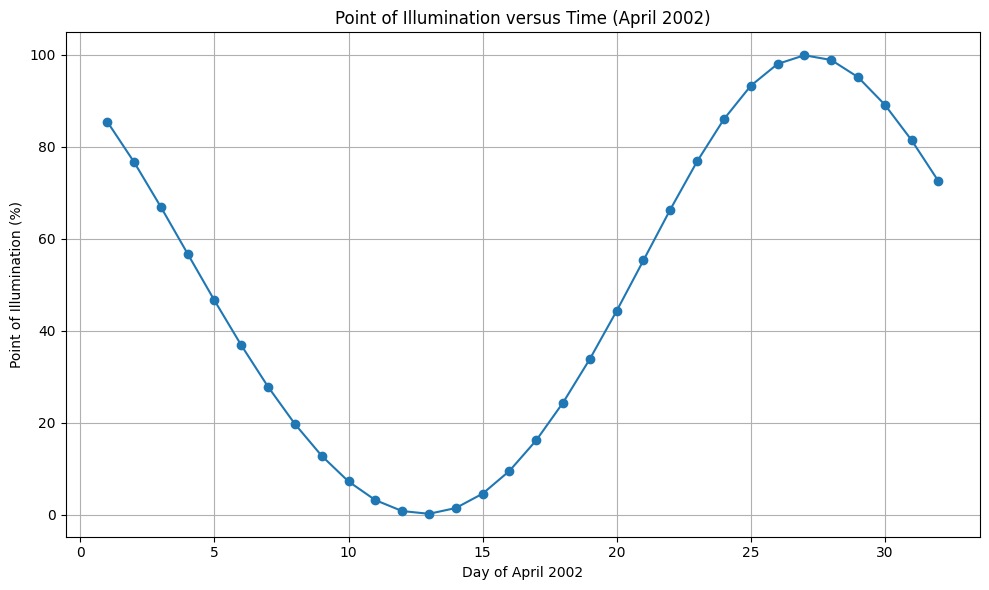

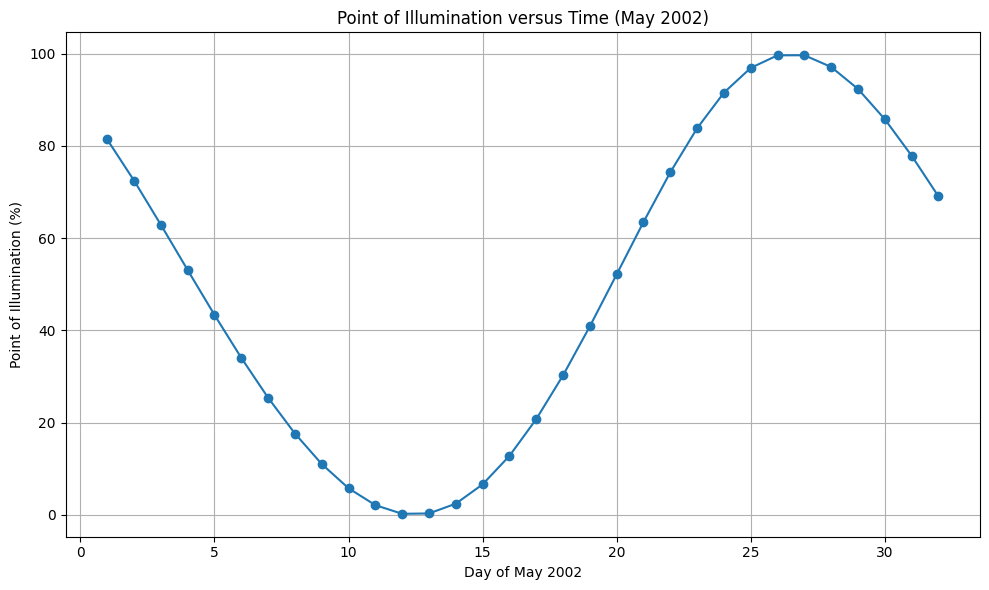

...

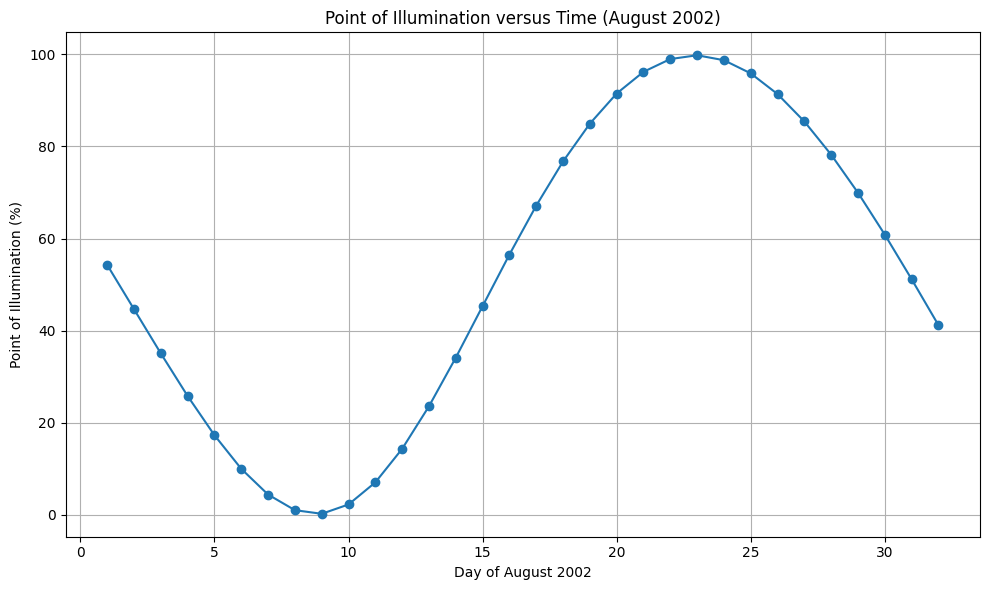

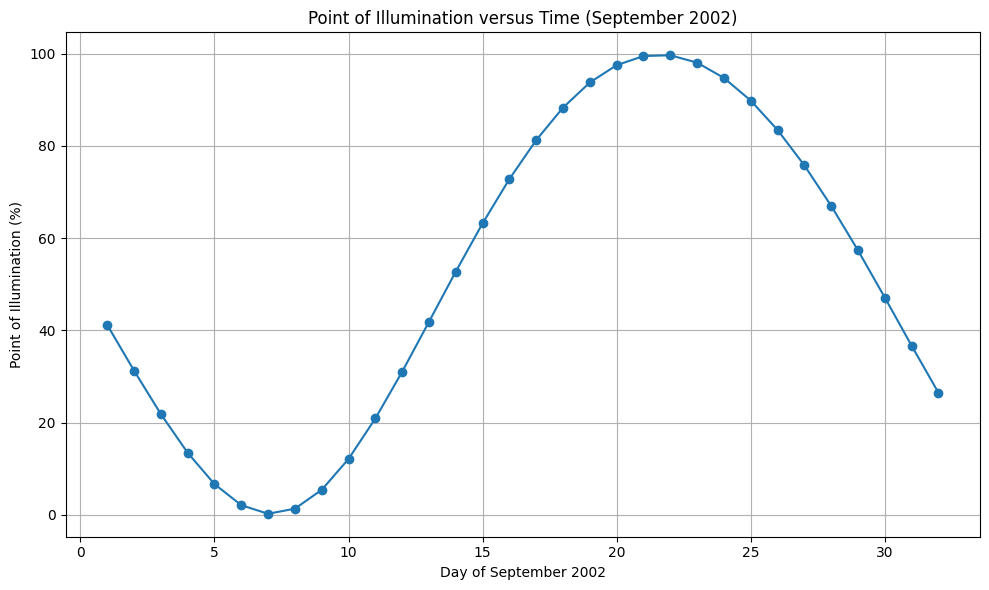

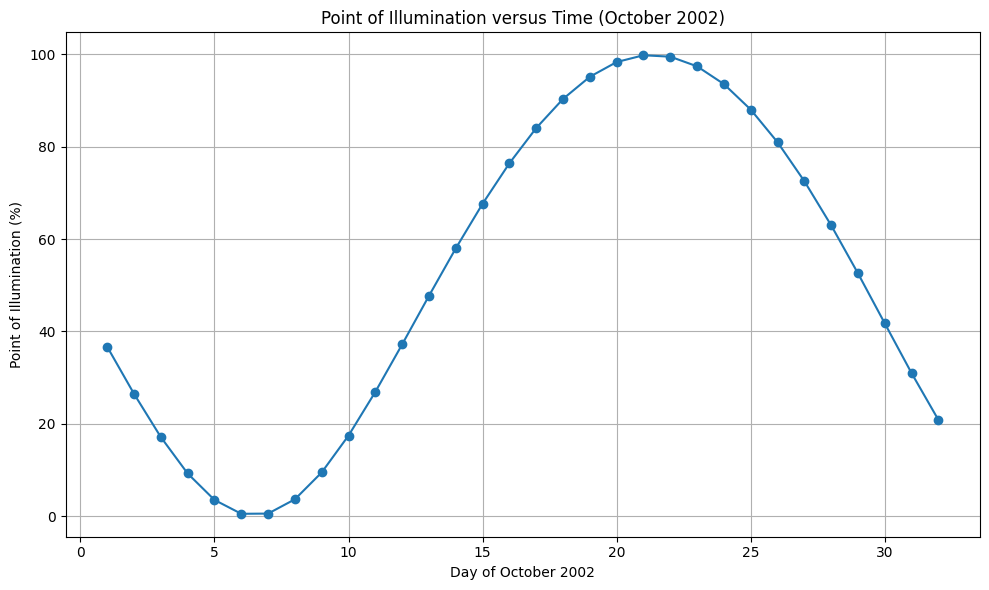

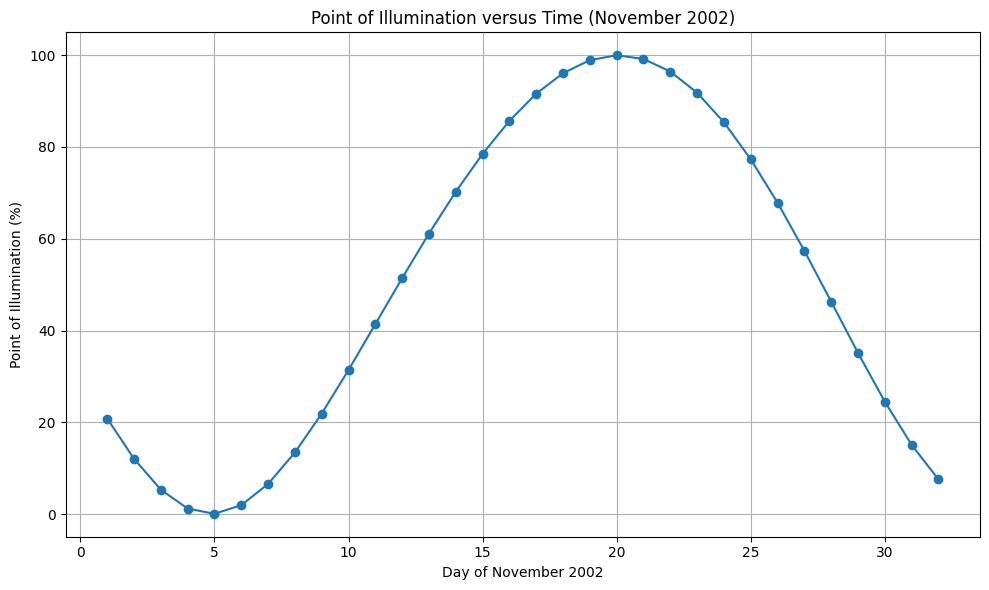

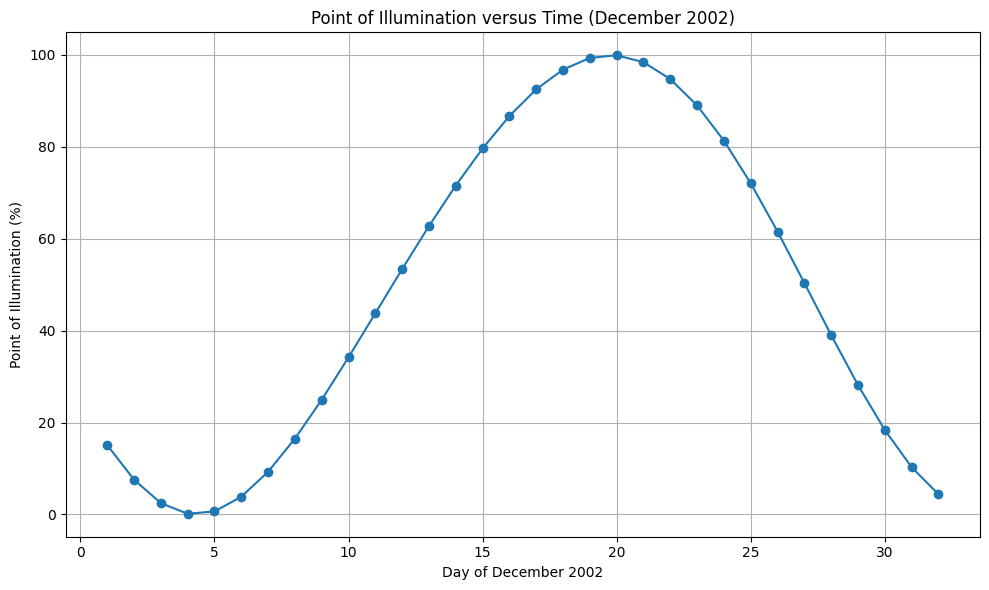

In [8]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric

# Define the start and end date for the entire year
start_date = datetime.datetime(2002, 1, 1)
end_date = datetime.datetime(2002, 12, 31)

# Loop over each month
for month in range(1, 13):
    # Define start and end dates for the current month
    start_month = datetime.datetime(2002, month, 1)
    end_month = datetime.datetime(2002, month, 1) + datetime.timedelta(days=31)

    # Create Horizons query object for the current month
    obj = Horizons(id=target_object_id, location=observer_location,
                   epochs={'start': start_month.strftime('%Y-%m-%d'),
                           'stop': end_month.strftime('%Y-%m-%d'),
                           'step': '1d'})

    try:
        # Retrieve ephemeris data for the current month
        eph_data = obj.ephemerides()

        # Extract time and point of illumination data
        jd_times = eph_data['datetime_jd']
        illumination_percentages = eph_data['illumination']

        # Convert Julian Date to days relative to the start of the month
        start_jd = int(jd_times[0])
        days = [(int(jd) - start_jd) + 1 for jd in jd_times]

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(days, illumination_percentages, marker='o', linestyle='-')

        plt.xlabel('Day of ' + start_month.strftime('%B %Y'))
        plt.ylabel('Point of Illumination (%)')
        plt.title('Point of Illumination versus Time (' + start_month.strftime('%B %Y') + ')')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error fetching data for {start_month.strftime('%B %Y')}: {e}")


# Point of Illumnation for Every month in the year of 2002 highlighting the new and the full moon of each cycle


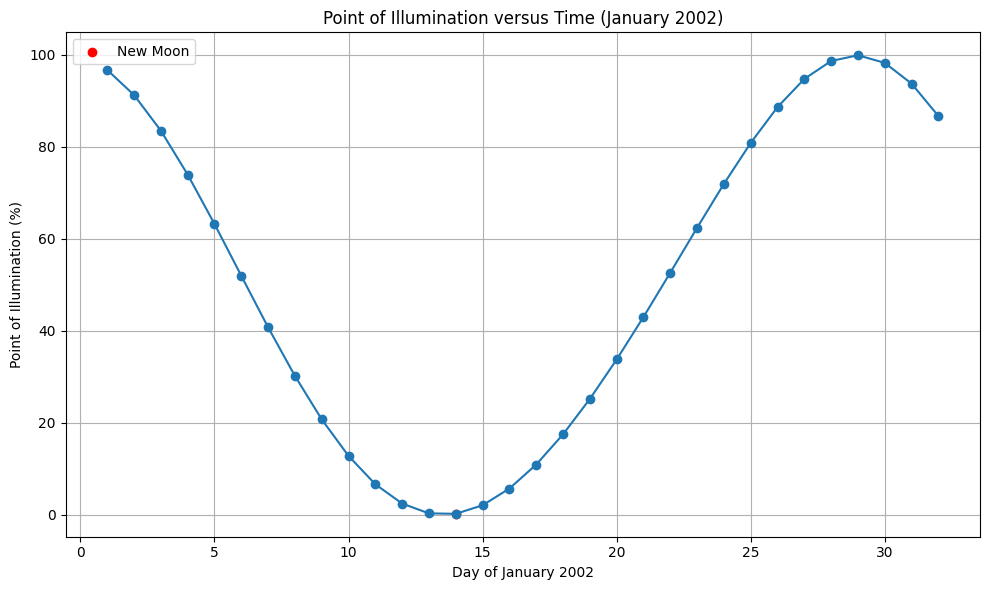

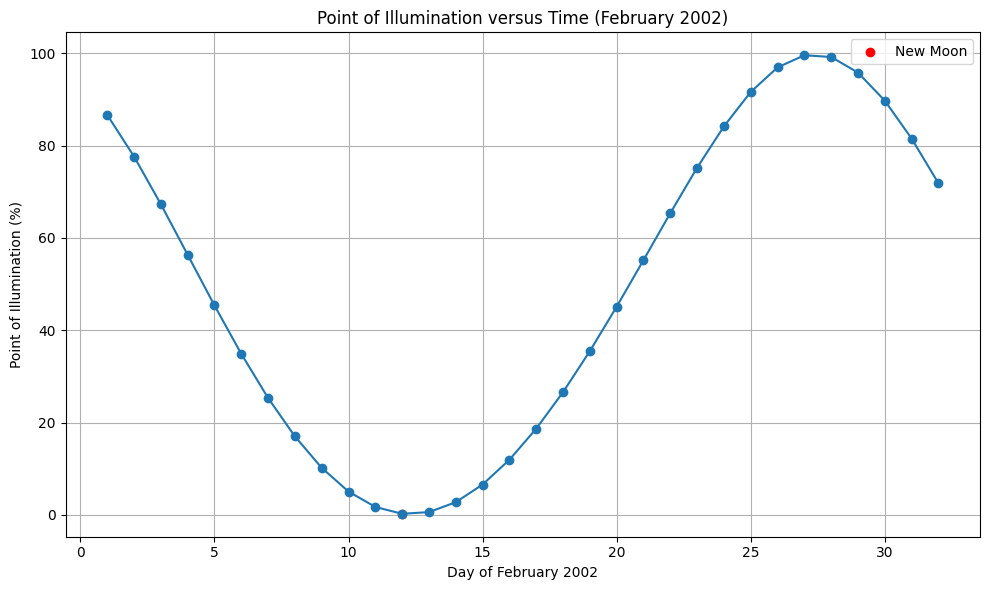

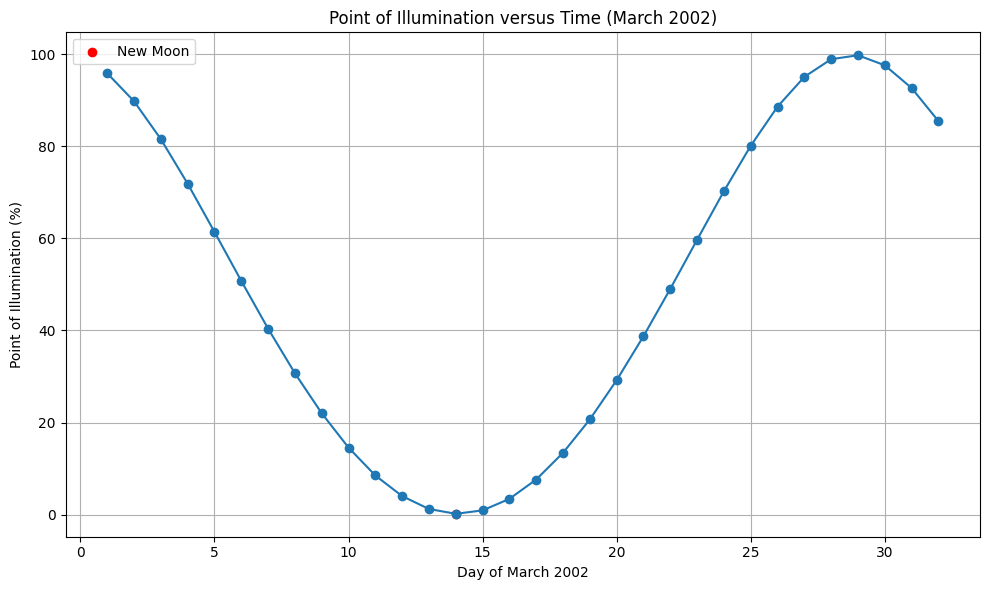

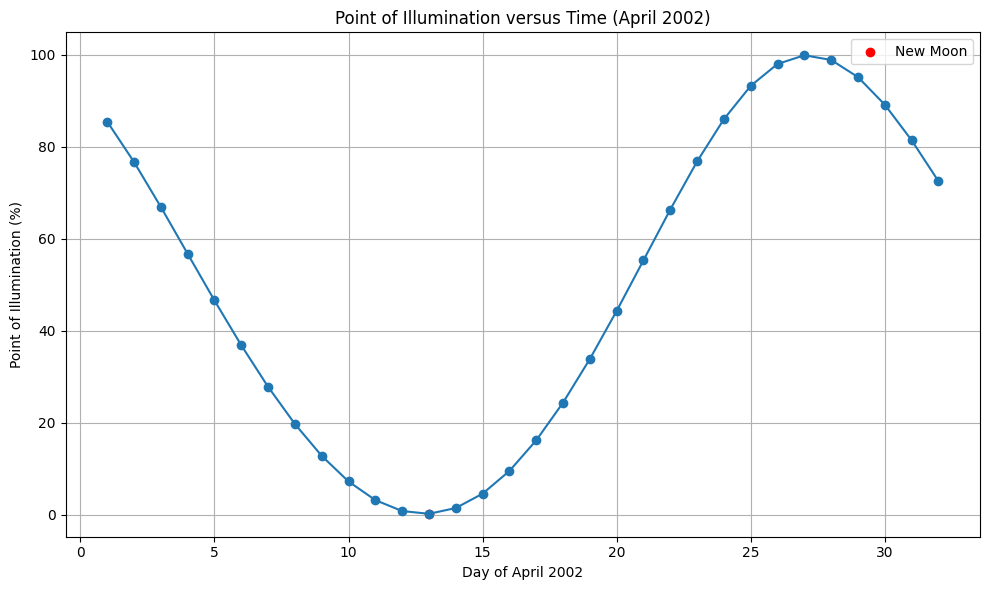

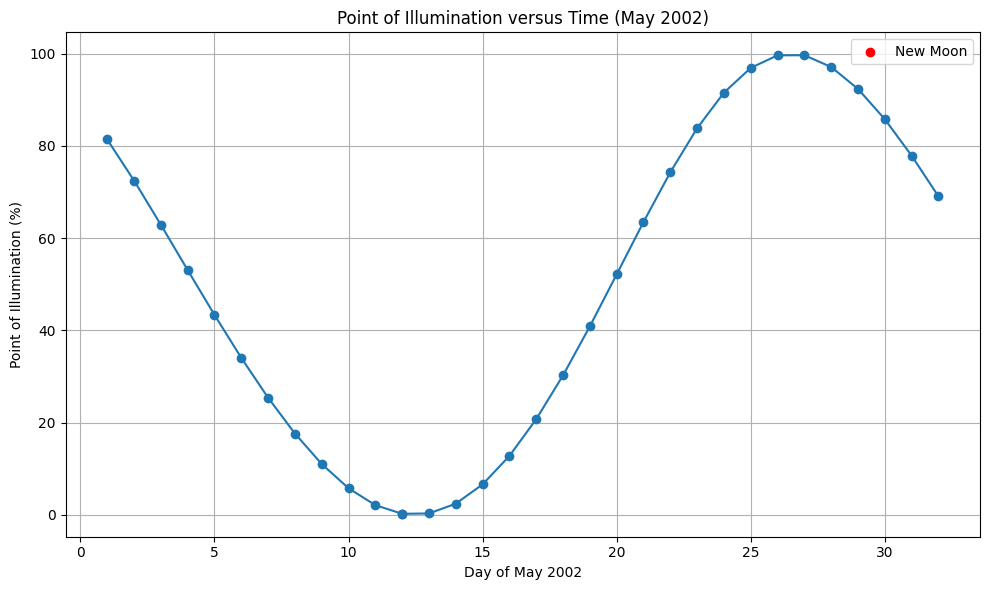

...

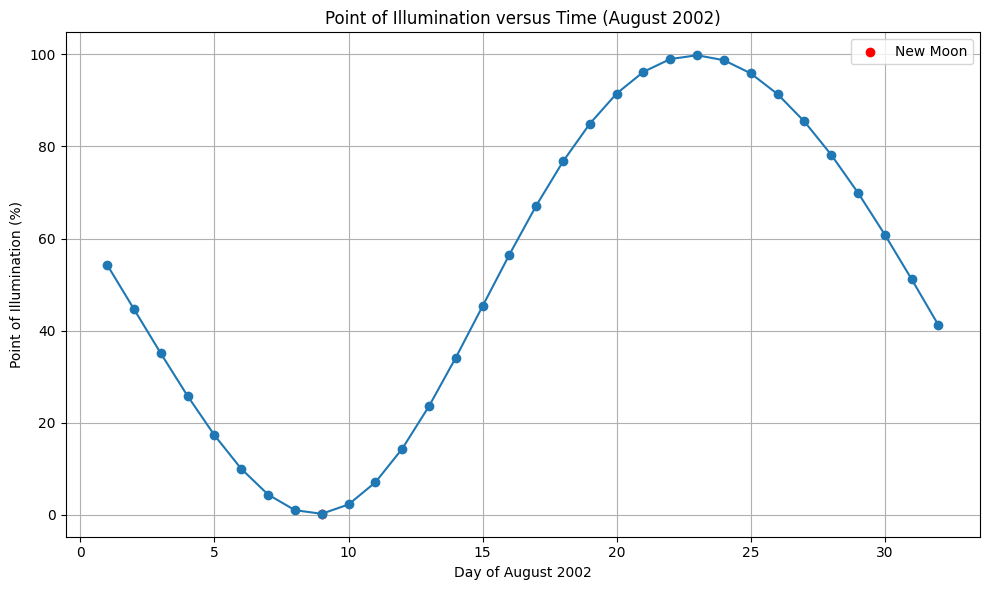

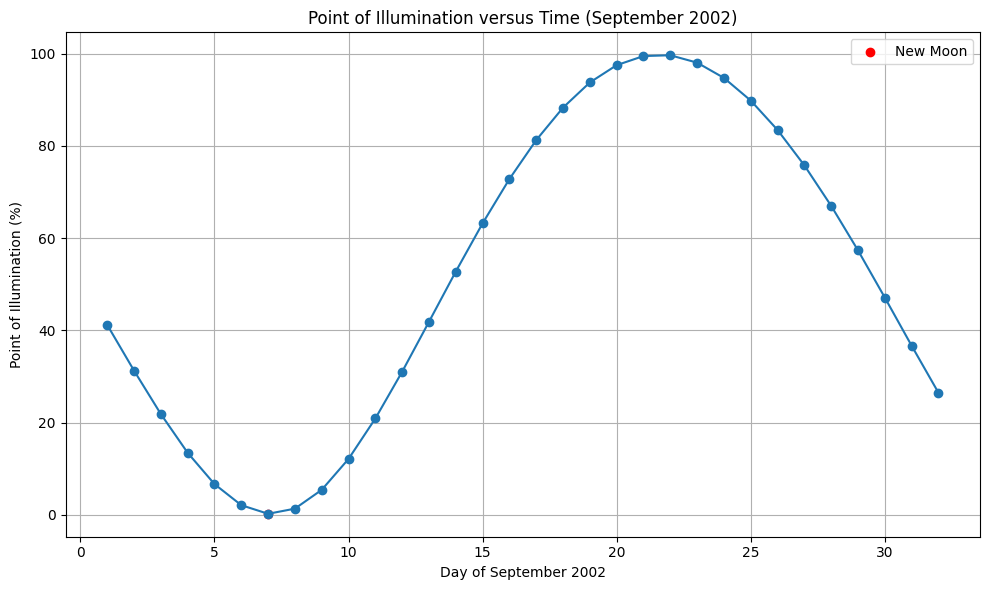

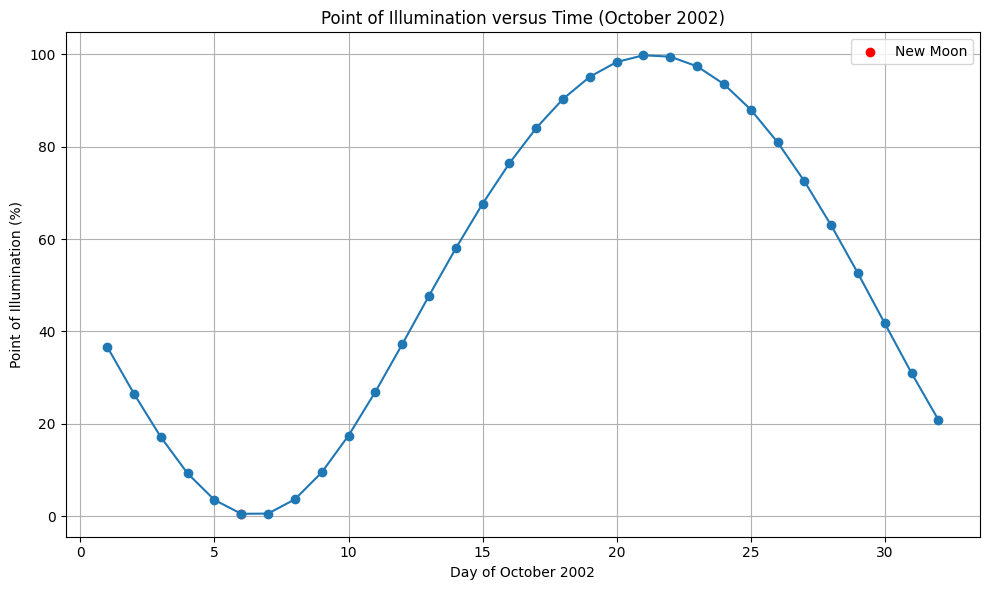

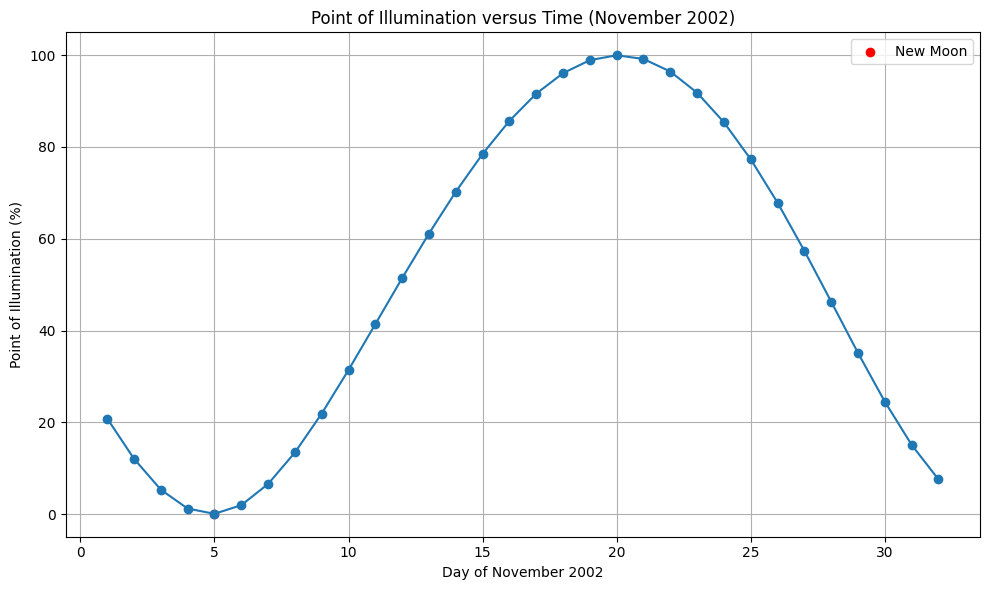

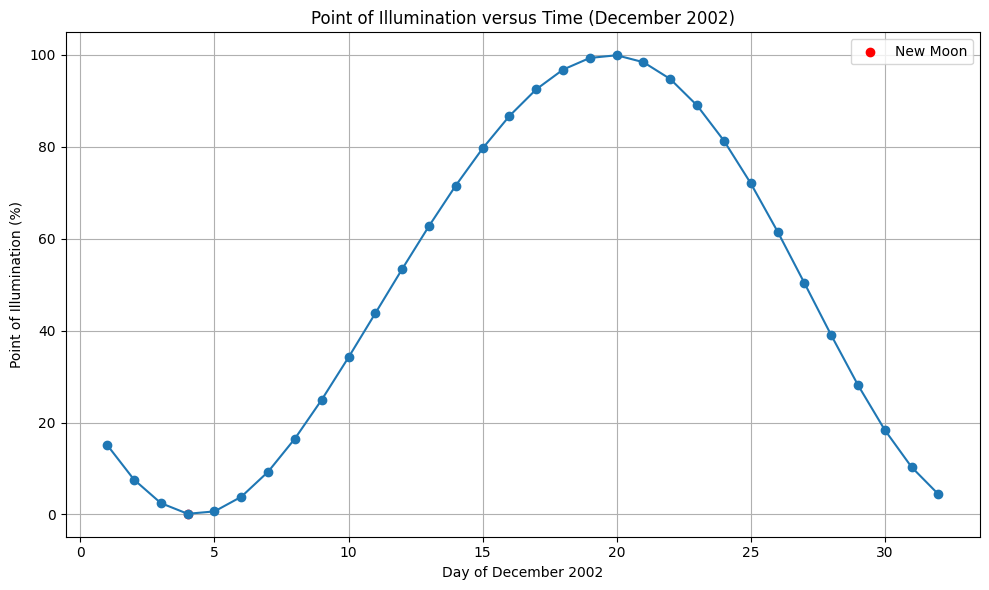

In [13]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric

# Define the start and end date for the entire year
start_date = datetime.datetime(2002, 1, 1)

# Loop over each month
for month in range(1, 13):
    try:
        # Define start and end dates for the current month
        start_month = datetime.datetime(2002, month, 1)
        end_month = datetime.datetime(2002, month, 1) + datetime.timedelta(days=31)

        # Create Horizons query object for the current month
        obj = Horizons(id=target_object_id, location=observer_location,
                       epochs={'start': start_month.strftime('%Y-%m-%d'),
                               'stop': end_month.strftime('%Y-%m-%d'),
                               'step': '1d'})

        # Retrieve ephemeris data for the current month
        eph_data = obj.ephemerides()

        # Extract time and point of illumination data
        jd_times = eph_data['datetime_jd']
        illumination_percentages = eph_data['illumination']

        # Convert Julian Date to days relative to the start of the month
        start_jd = int(jd_times[0])
        days = [(int(jd) - start_jd) + 1 for jd in jd_times]

        # Find the minimum illumination percentage and its corresponding day
        min_illumination = min(illumination_percentages.data)  # Access the data within the masked column
        min_illumination_index = illumination_percentages.data.tolist().index(min_illumination)  # Find the index
        min_illumination_day = days[min_illumination_index]

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(days, illumination_percentages, marker='o', linestyle='-')

        # Highlight the new moon
        plt.scatter(min_illumination_day, min_illumination, color='red', label='New Moon')

        plt.xlabel('Day of ' + start_month.strftime('%B %Y'))
        plt.ylabel('Point of Illumination (%)')
        plt.title('Point of Illumination versus Time (' + start_month.strftime('%B %Y') + ')')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error fetching data for {start_month.strftime('%B %Y')}: {e}")


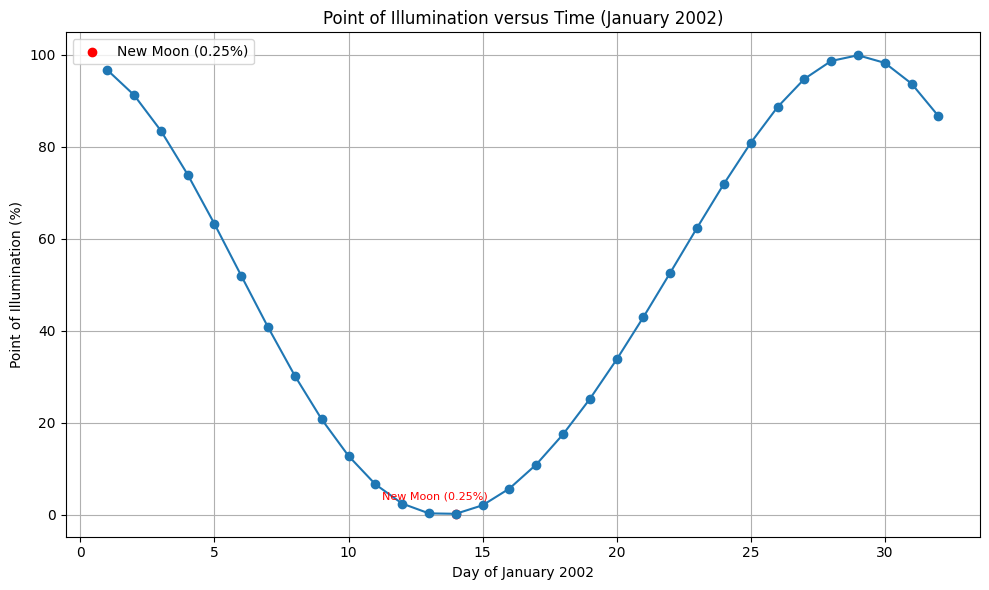

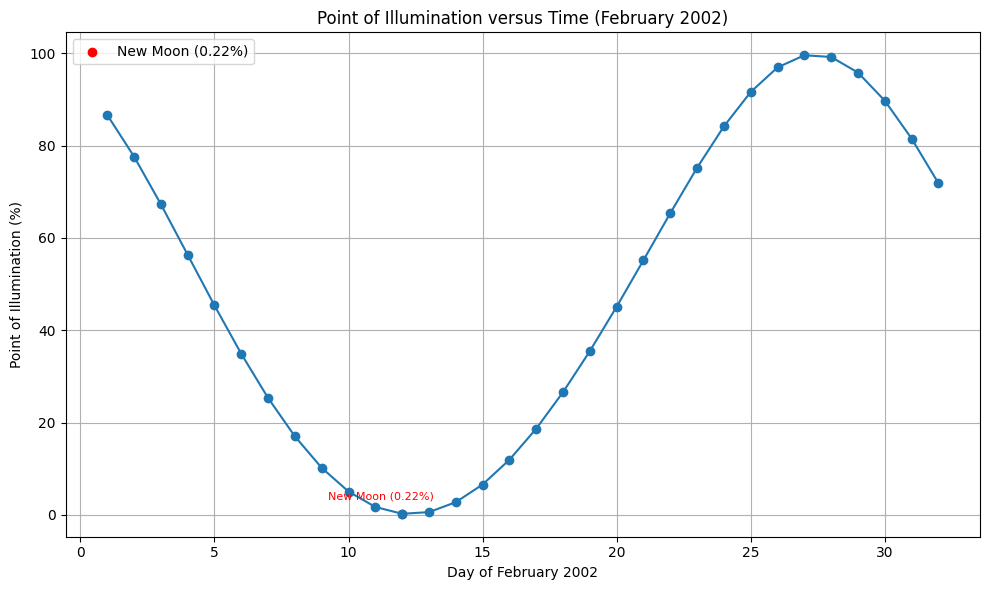

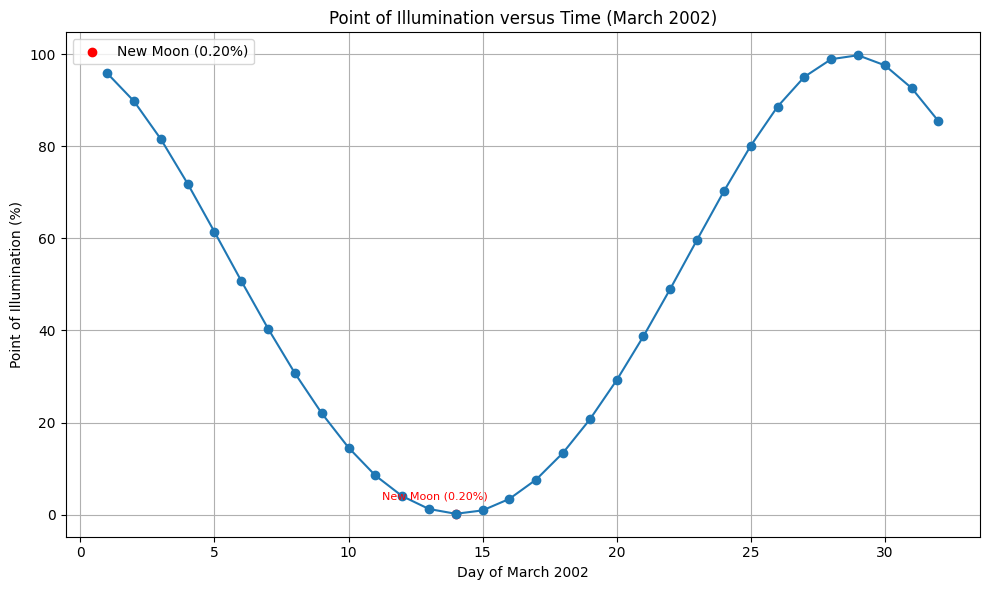

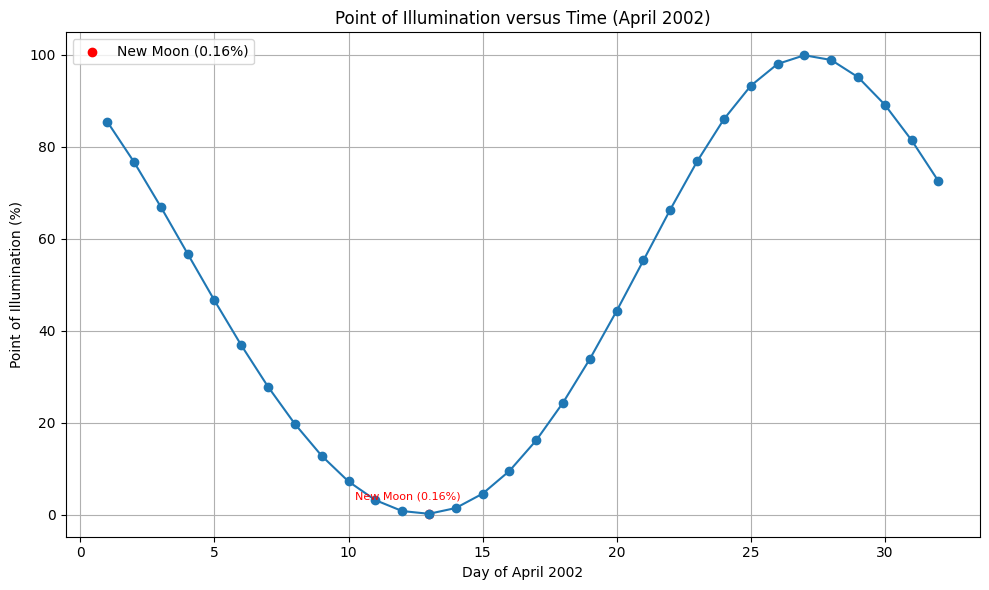

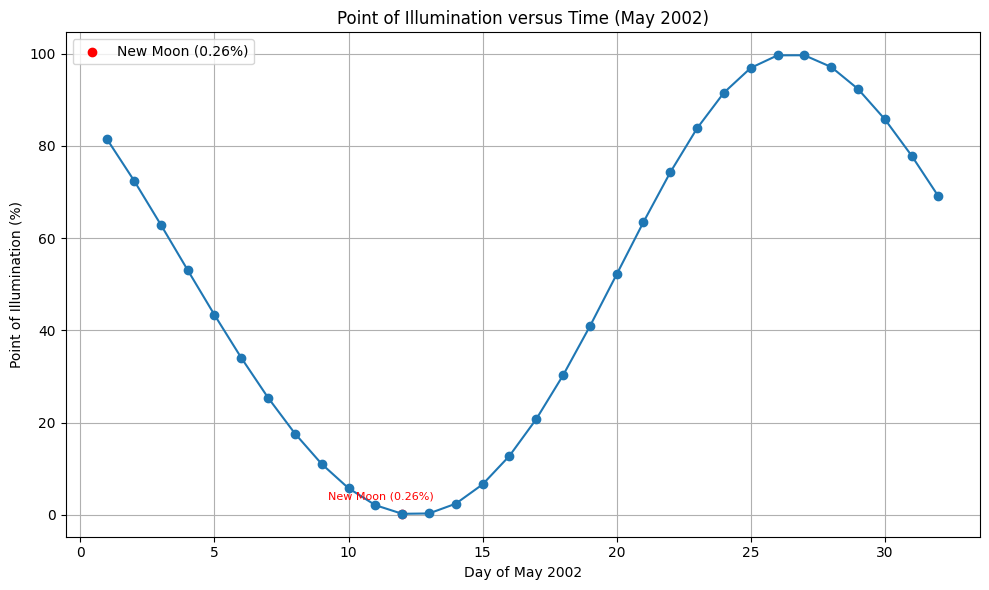

...

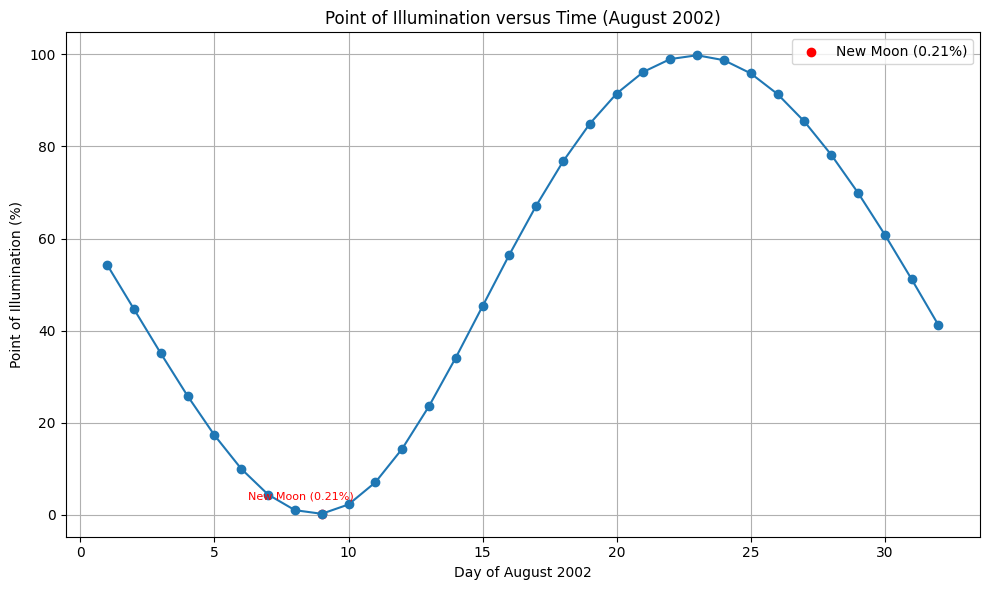

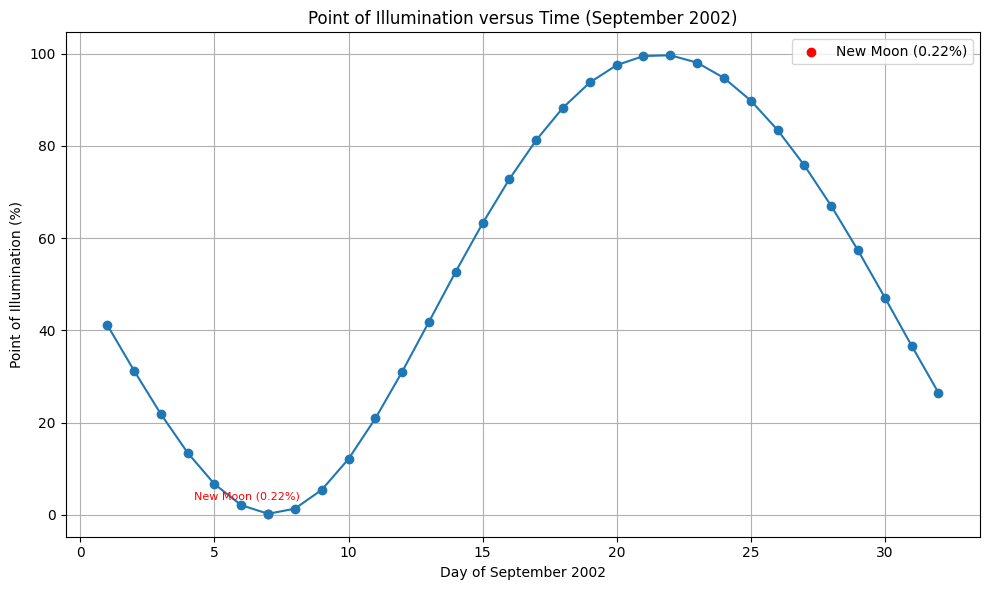

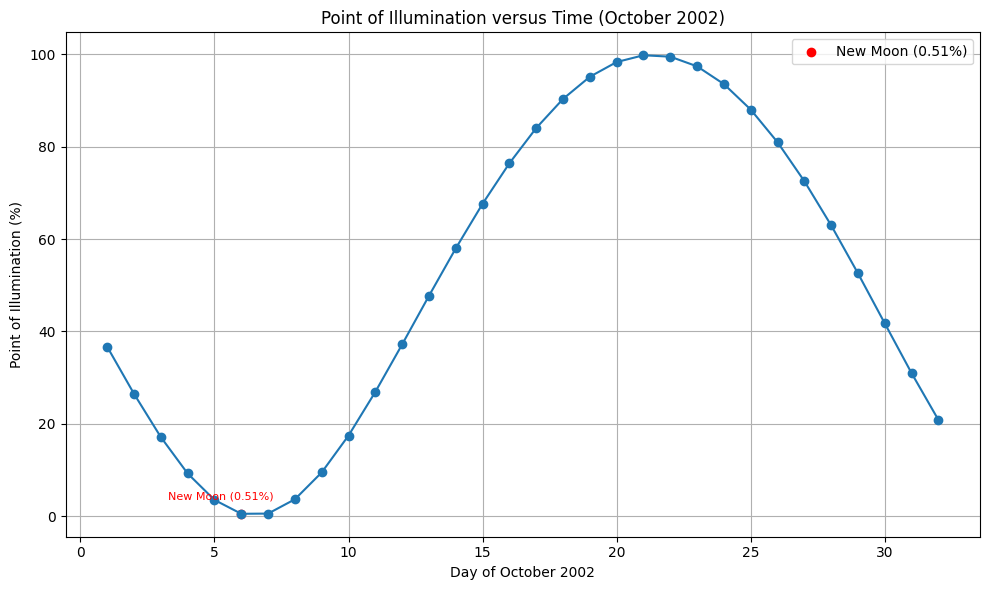

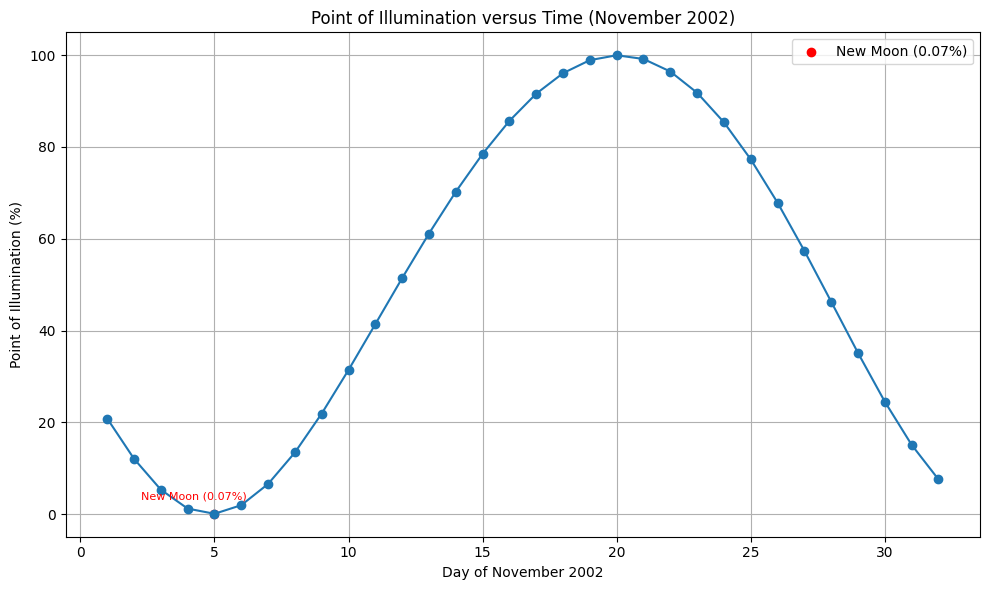

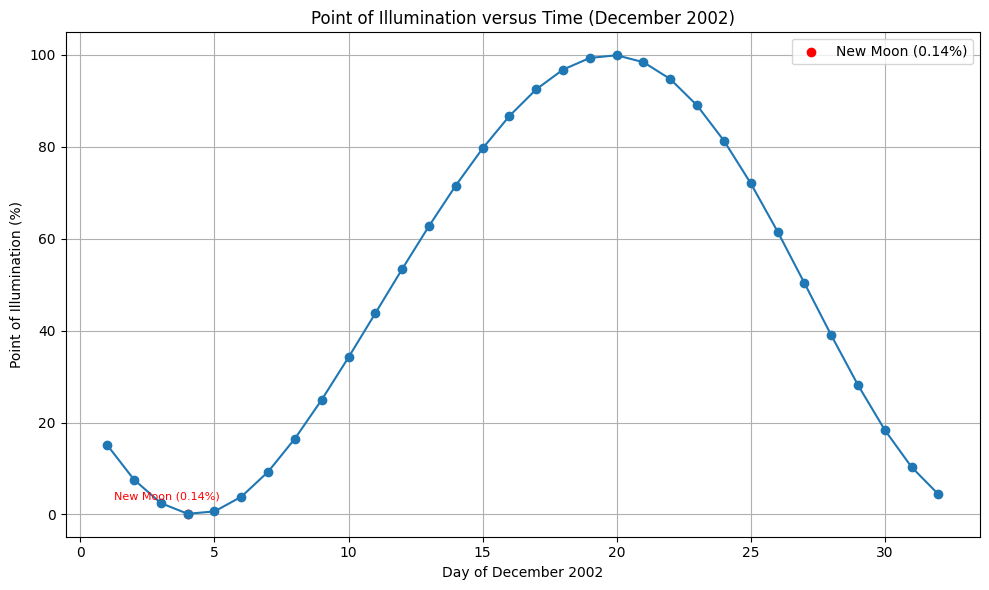

In [14]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric

# Define the start and end date for the entire year
start_date = datetime.datetime(2002, 1, 1)

# Loop over each month
for month in range(1, 13):
    try:
        # Define start and end dates for the current month
        start_month = datetime.datetime(2002, month, 1)
        end_month = datetime.datetime(2002, month, 1) + datetime.timedelta(days=31)

        # Create Horizons query object for the current month
        obj = Horizons(id=target_object_id, location=observer_location,
                       epochs={'start': start_month.strftime('%Y-%m-%d'),
                               'stop': end_month.strftime('%Y-%m-%d'),
                               'step': '1d'})

        # Retrieve ephemeris data for the current month
        eph_data = obj.ephemerides()

        # Extract time and point of illumination data
        jd_times = eph_data['datetime_jd']
        illumination_percentages = eph_data['illumination']

        # Convert Julian Date to days relative to the start of the month
        start_jd = int(jd_times[0])
        days = [(int(jd) - start_jd) + 1 for jd in jd_times]

        # Find the minimum illumination percentage and its corresponding day
        min_illumination = min(illumination_percentages.data)  # Access the data within the masked column
        min_illumination_index = illumination_percentages.data.tolist().index(min_illumination)  # Find the index
        min_illumination_day = days[min_illumination_index]

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(days, illumination_percentages, marker='o', linestyle='-')

        # Highlight the new moon and label it
        plt.scatter(min_illumination_day, min_illumination, color='red', label=f'New Moon ({min_illumination:.2f}%)')
        plt.annotate(f'New Moon ({min_illumination:.2f}%)', (min_illumination_day, min_illumination),
                     textcoords="offset points", xytext=(-15,10), ha='center', fontsize=8, color='red')

        plt.xlabel('Day of ' + start_month.strftime('%B %Y'))
        plt.ylabel('Point of Illumination (%)')
        plt.title('Point of Illumination versus Time (' + start_month.strftime('%B %Y') + ')')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error fetching data for {start_month.strftime('%B %Y')}: {e}")


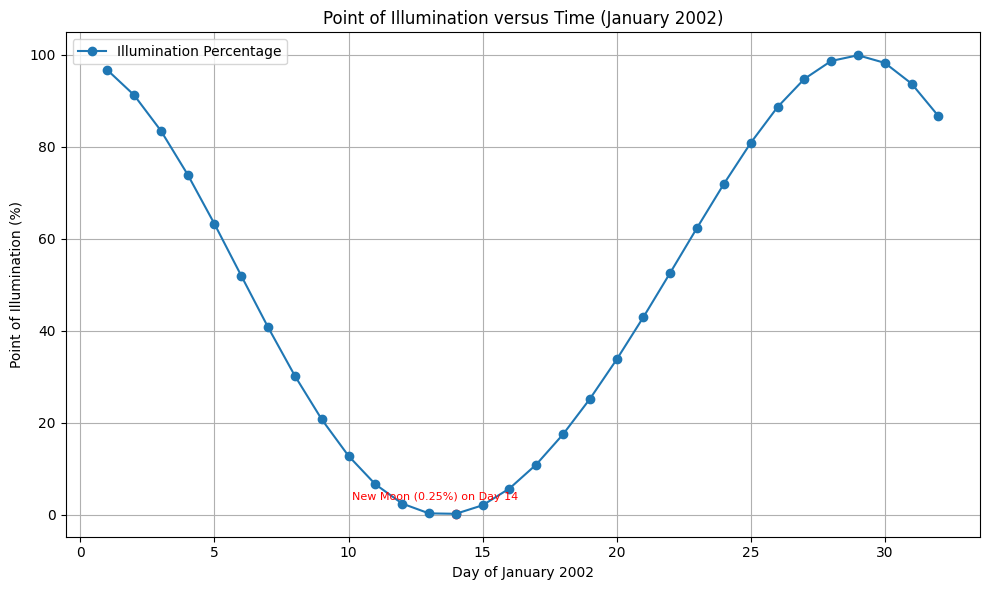

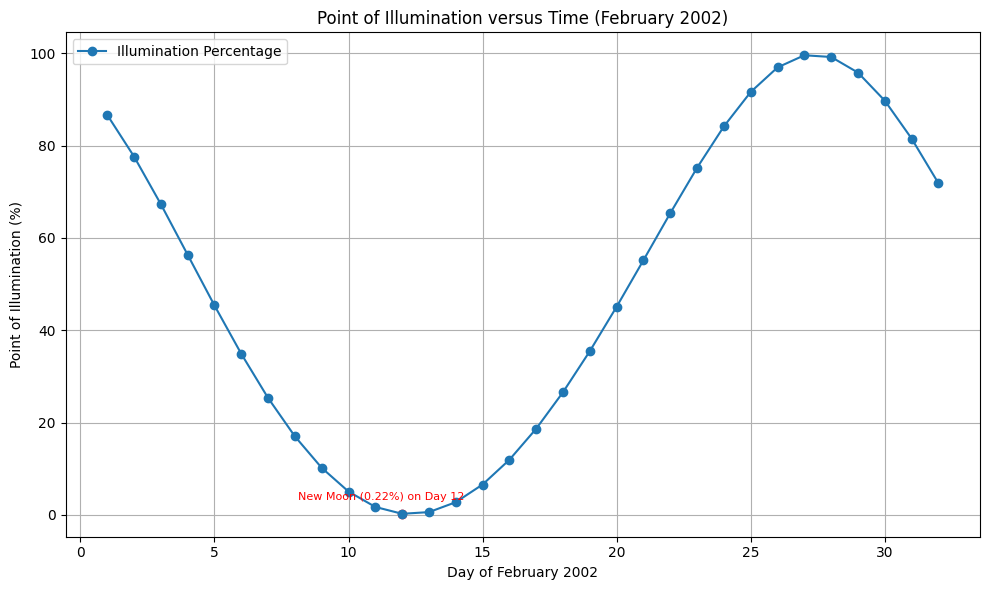

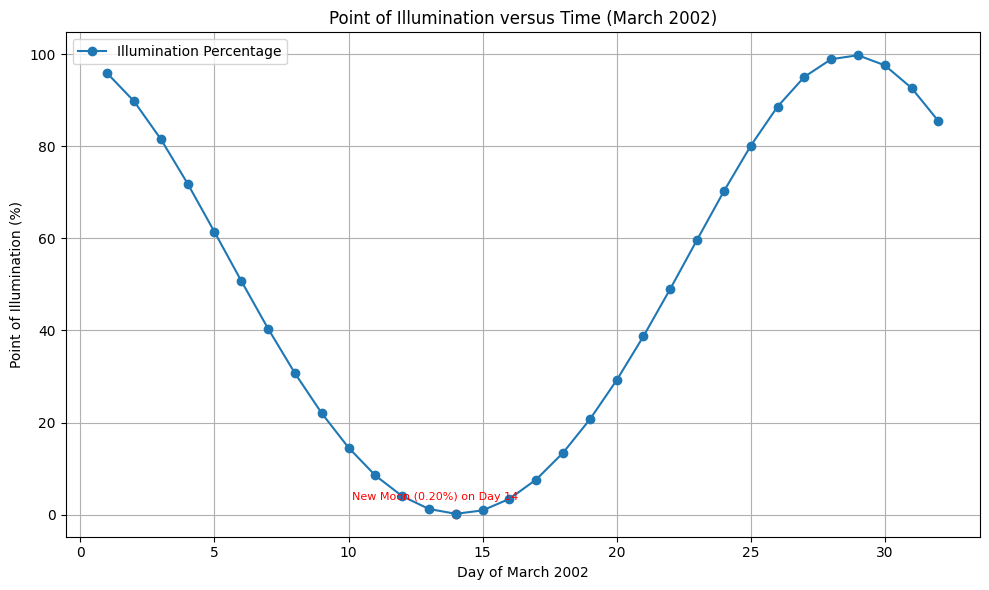

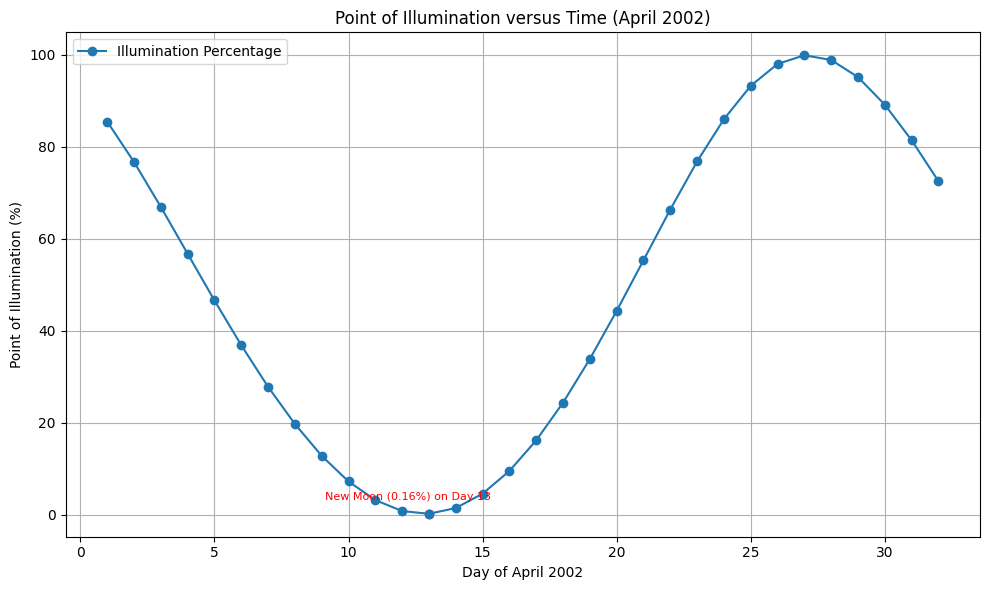

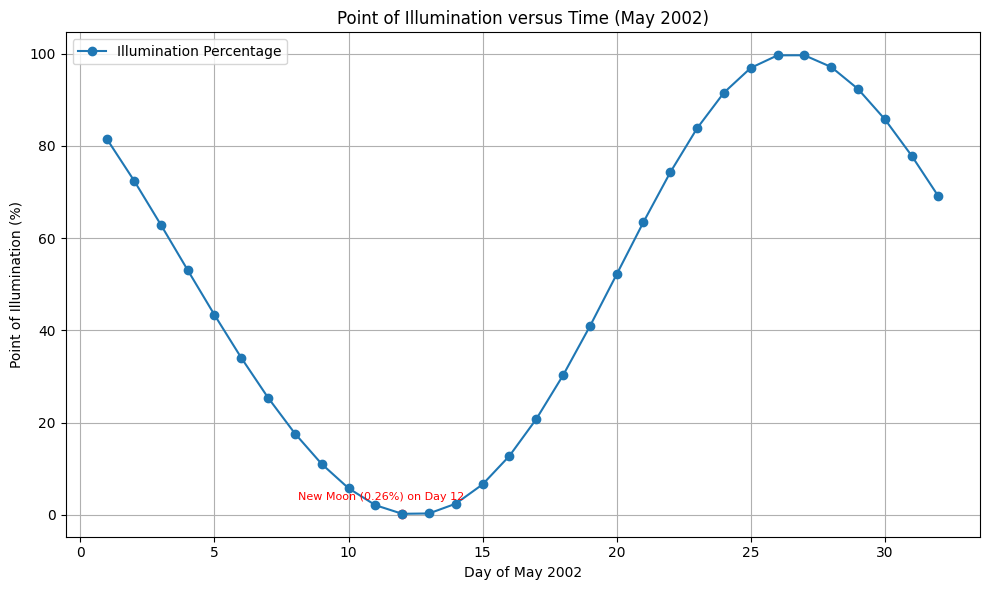

...

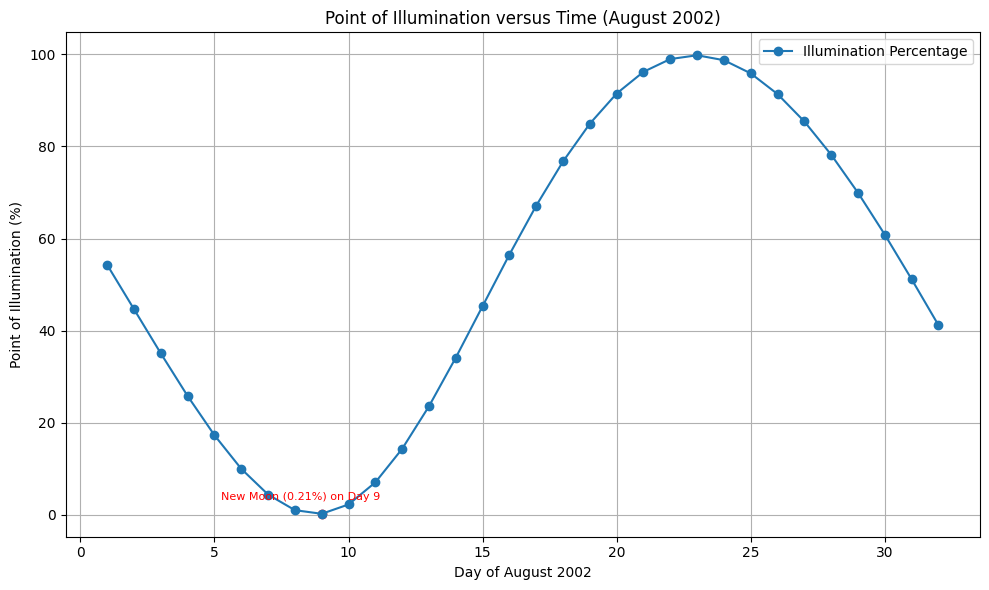

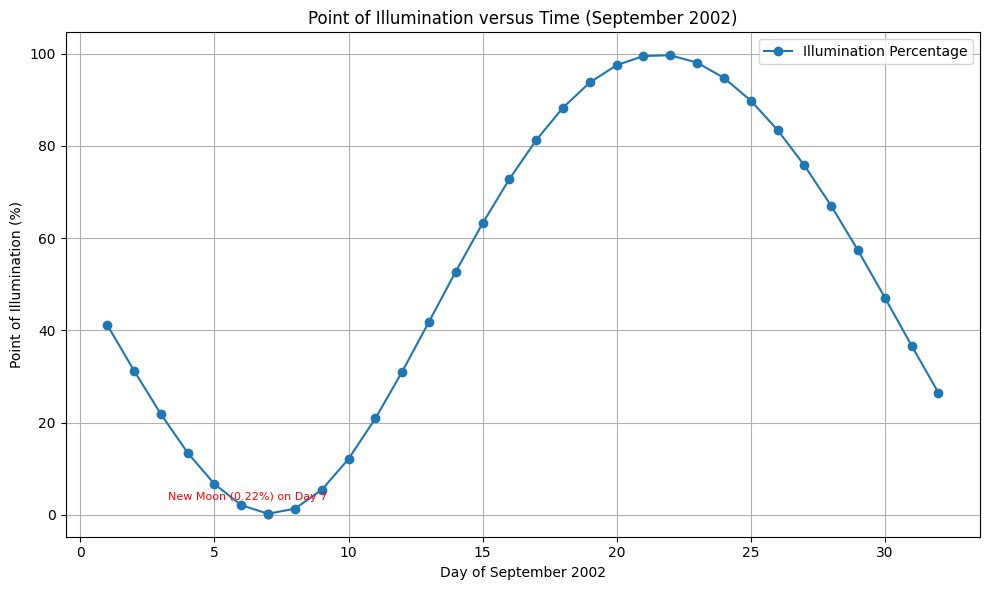

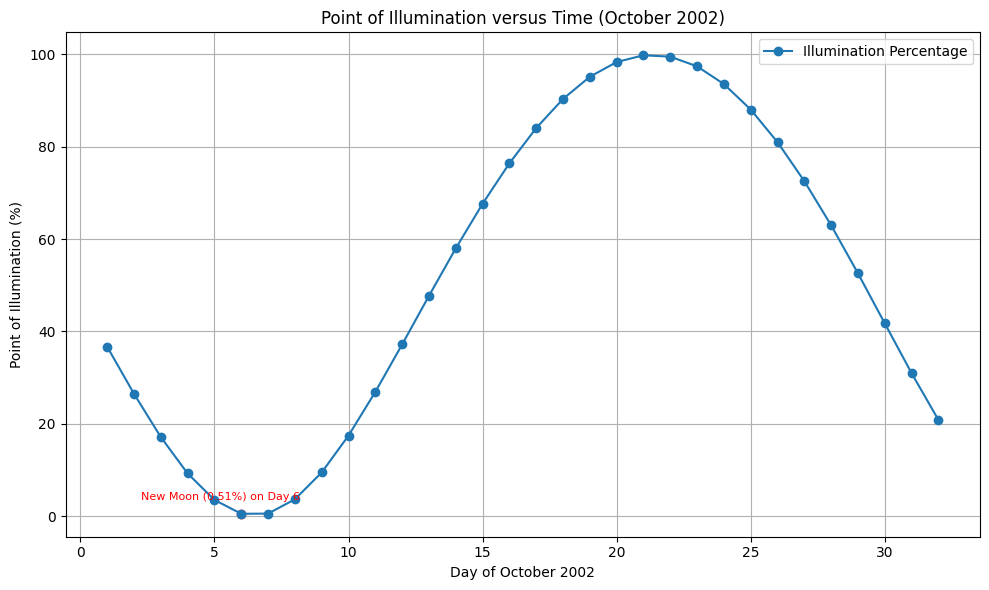

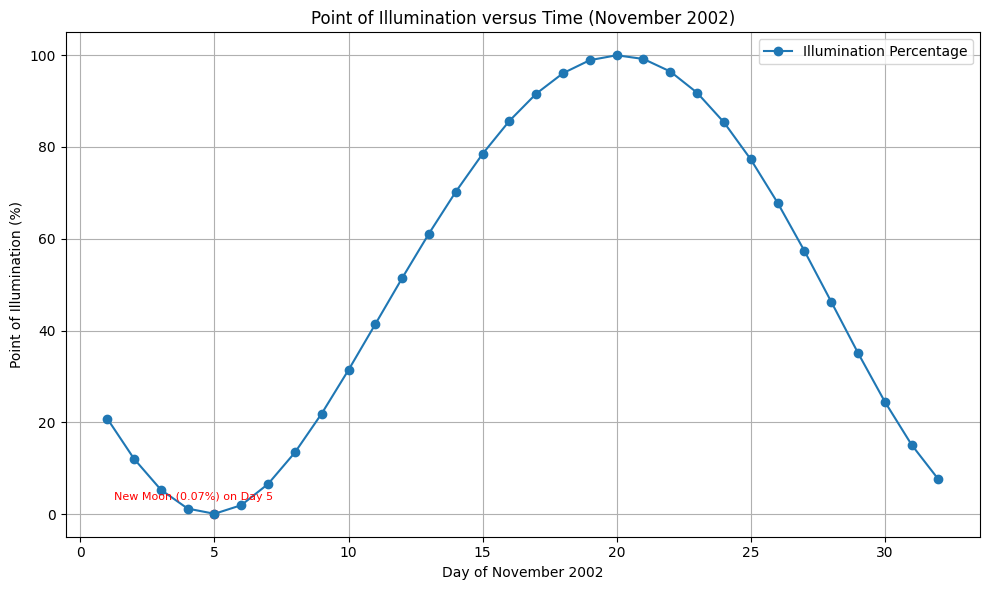

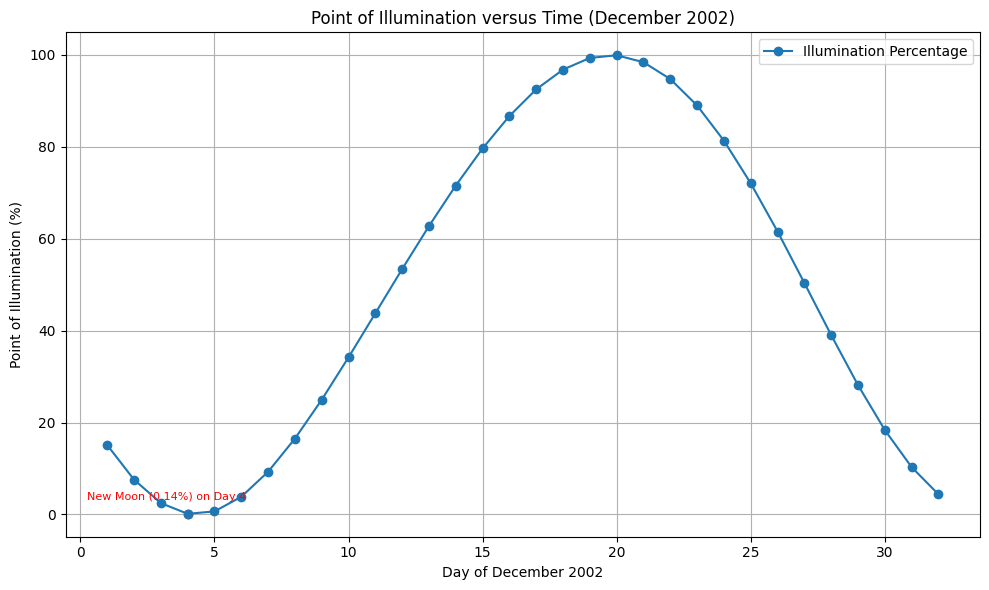

In [15]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric

# Define the start and end date for the entire year
start_date = datetime.datetime(2002, 1, 1)

# Loop over each month
for month in range(1, 13):
    try:
        # Define start and end dates for the current month
        start_month = datetime.datetime(2002, month, 1)
        end_month = datetime.datetime(2002, month, 1) + datetime.timedelta(days=31)

        # Create Horizons query object for the current month
        obj = Horizons(id=target_object_id, location=observer_location,
                       epochs={'start': start_month.strftime('%Y-%m-%d'),
                               'stop': end_month.strftime('%Y-%m-%d'),
                               'step': '1d'})

        # Retrieve ephemeris data for the current month
        eph_data = obj.ephemerides()

        # Extract time and point of illumination data
        jd_times = eph_data['datetime_jd']
        illumination_percentages = eph_data['illumination']

        # Convert Julian Date to days relative to the start of the month
        start_jd = int(jd_times[0])
        days = [(int(jd) - start_jd) + 1 for jd in jd_times]

        # Find the minimum illumination percentage and its corresponding day
        min_illumination = min(illumination_percentages.data)  # Access the data within the masked column
        min_illumination_index = illumination_percentages.data.tolist().index(min_illumination)  # Find the index
        min_illumination_day = days[min_illumination_index]

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(days, illumination_percentages, marker='o', linestyle='-', label='Illumination Percentage')

        # Highlight the new moon and label it
        plt.scatter(min_illumination_day, min_illumination, color='red')
        plt.annotate(f'New Moon ({min_illumination:.2f}%) on Day {min_illumination_day}', (min_illumination_day, min_illumination),
                     textcoords="offset points", xytext=(-15,10), ha='center', fontsize=8, color='red')

        plt.xlabel('Day of ' + start_month.strftime('%B %Y'))
        plt.ylabel('Point of Illumination (%)')
        plt.title('Point of Illumination versus Time (' + start_month.strftime('%B %Y') + ')')
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error fetching data for {start_month.strftime('%B %Y')}: {e}")


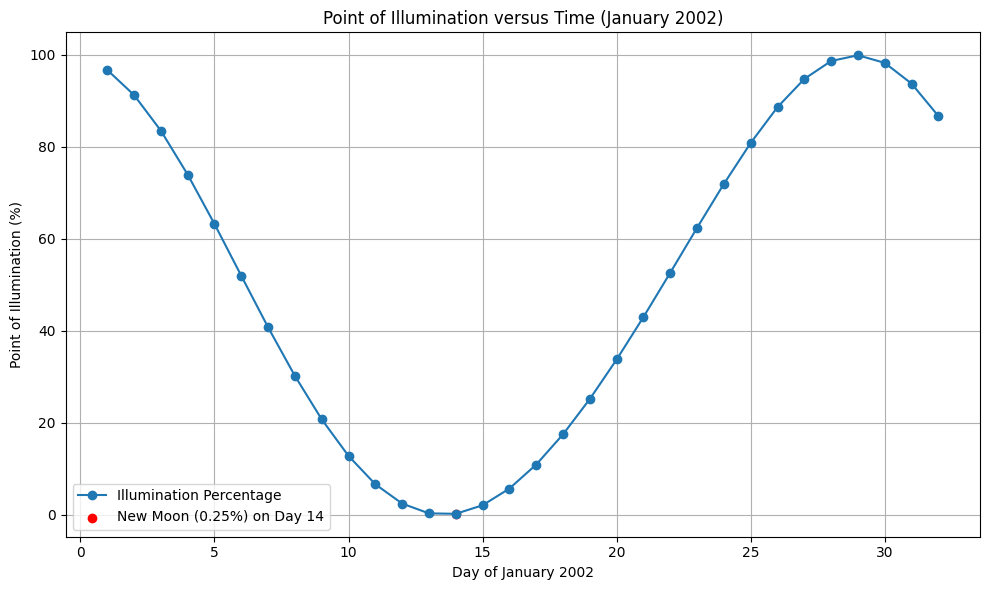

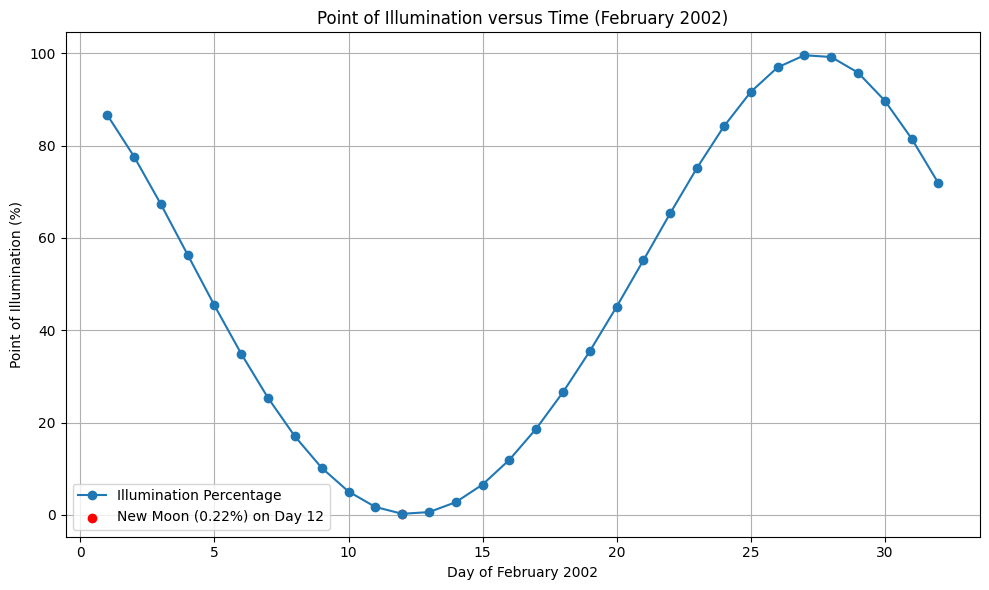

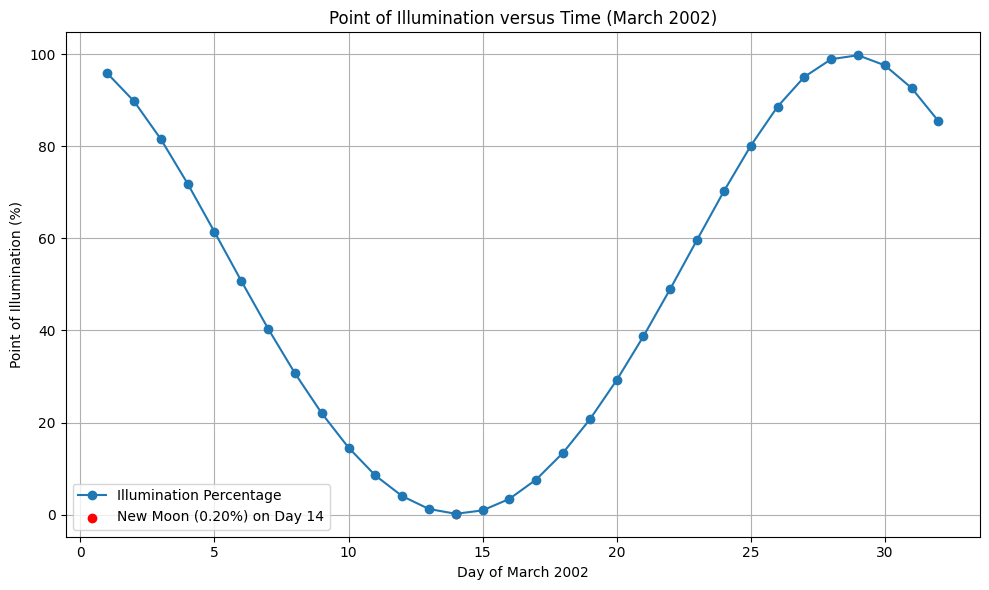

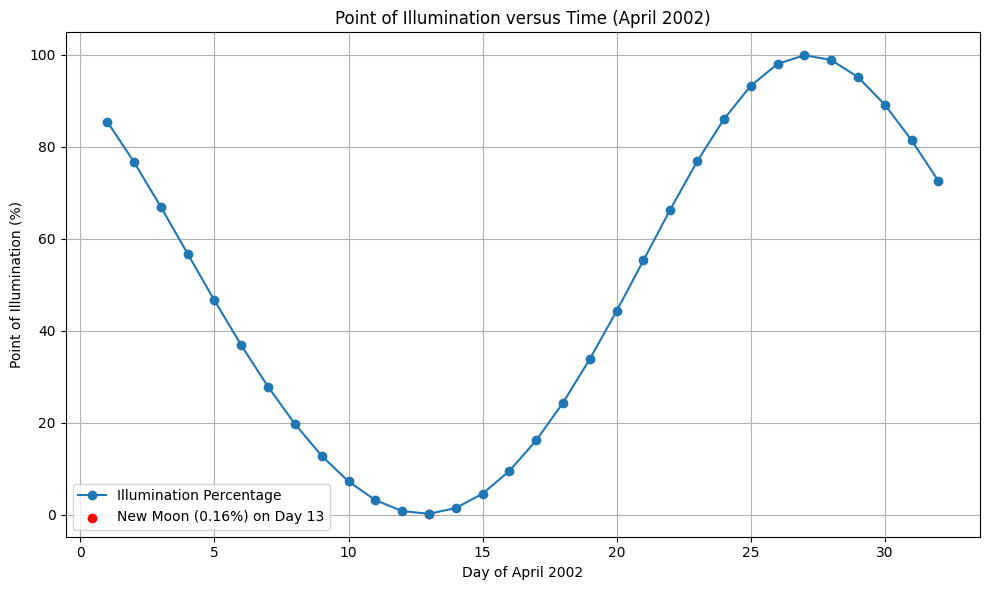

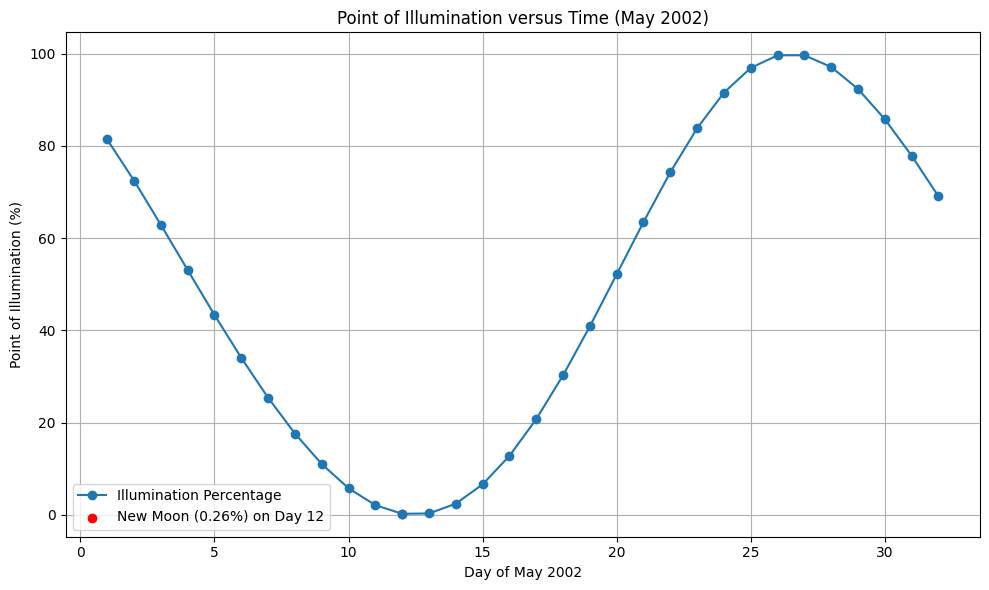

...

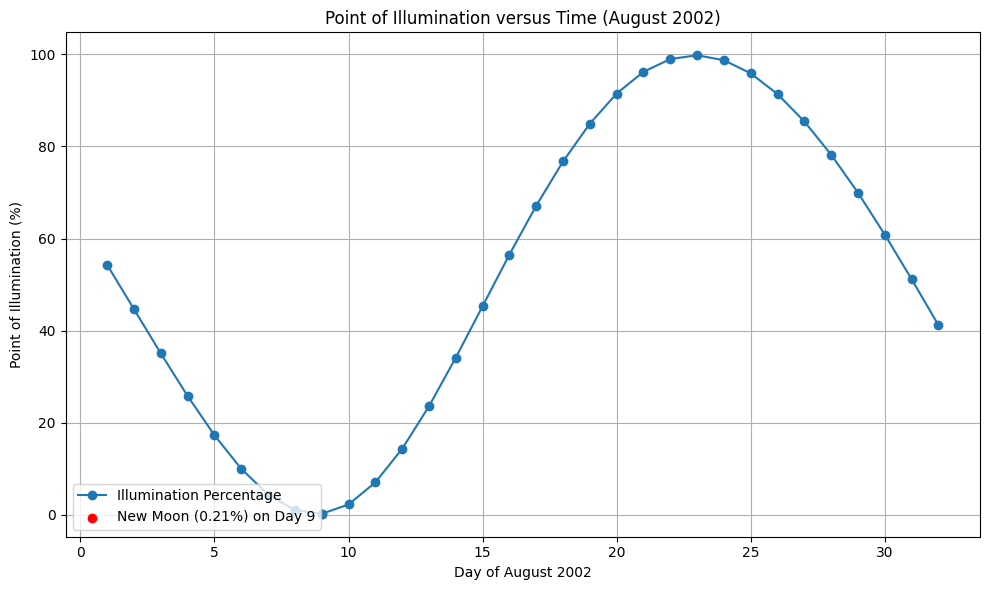

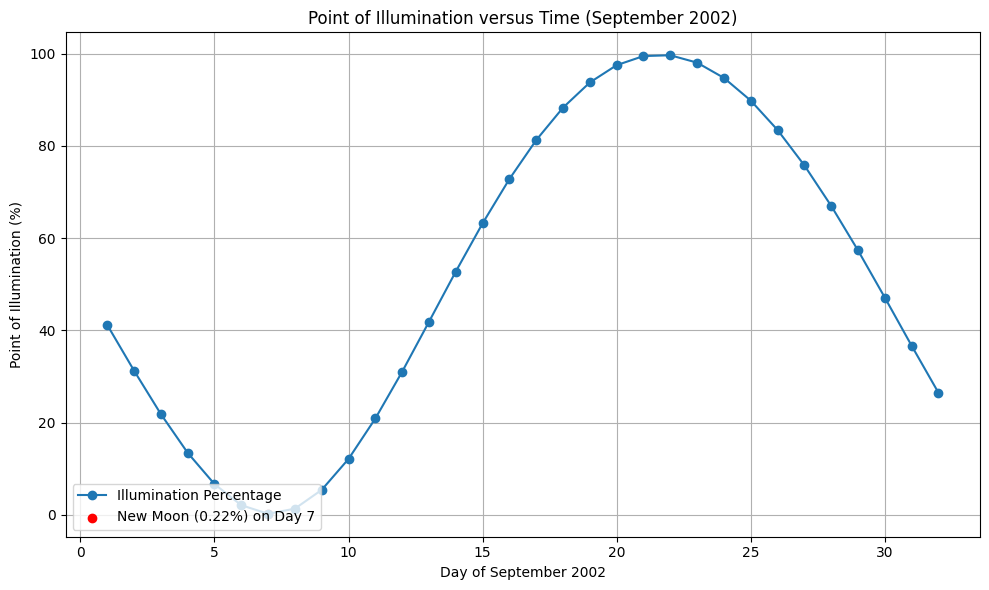

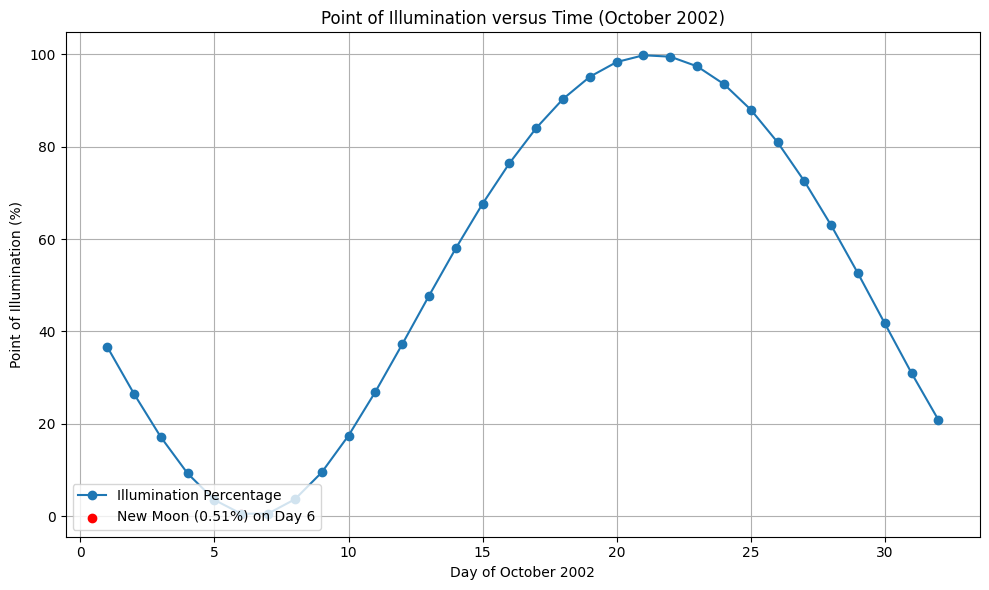

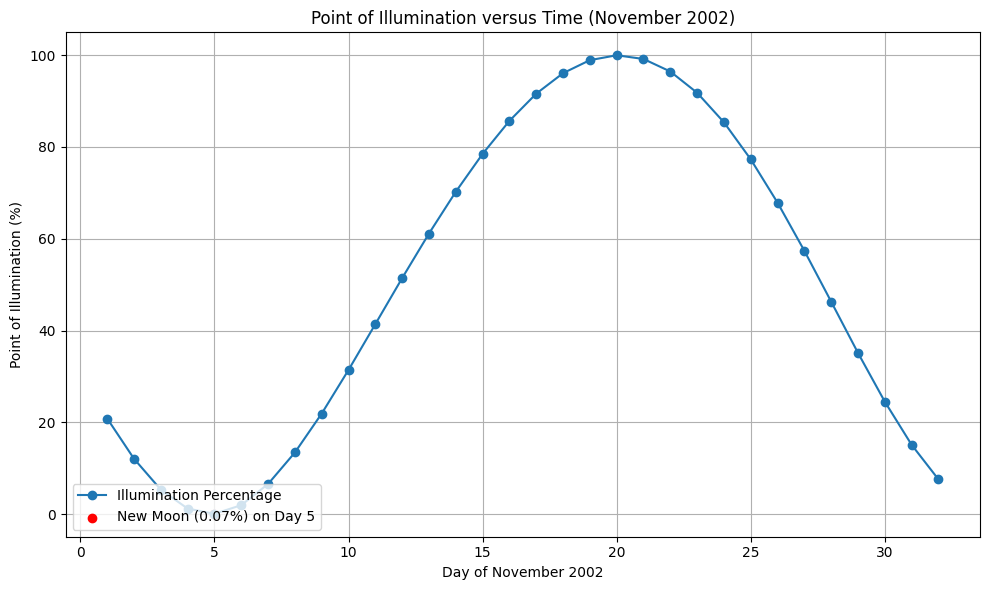

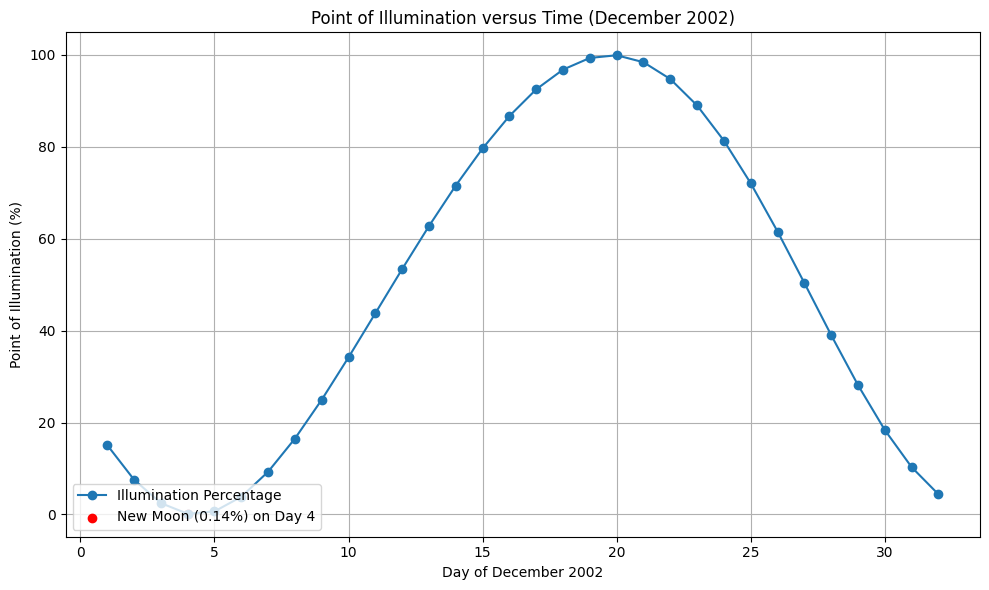

In [16]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric

# Define the start and end date for the entire year
start_date = datetime.datetime(2002, 1, 1)

# Loop over each month
for month in range(1, 13):
    try:
        # Define start and end dates for the current month
        start_month = datetime.datetime(2002, month, 1)
        end_month = datetime.datetime(2002, month, 1) + datetime.timedelta(days=31)

        # Create Horizons query object for the current month
        obj = Horizons(id=target_object_id, location=observer_location,
                       epochs={'start': start_month.strftime('%Y-%m-%d'),
                               'stop': end_month.strftime('%Y-%m-%d'),
                               'step': '1d'})

        # Retrieve ephemeris data for the current month
        eph_data = obj.ephemerides()

        # Extract time and point of illumination data
        jd_times = eph_data['datetime_jd']
        illumination_percentages = eph_data['illumination']

        # Convert Julian Date to days relative to the start of the month
        start_jd = int(jd_times[0])
        days = [(int(jd) - start_jd) + 1 for jd in jd_times]

        # Find the minimum illumination percentage and its corresponding day
        min_illumination = min(illumination_percentages.data)  # Access the data within the masked column
        min_illumination_index = illumination_percentages.data.tolist().index(min_illumination)  # Find the index
        min_illumination_day = days[min_illumination_index]

        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(days, illumination_percentages, marker='o', linestyle='-', label='Illumination Percentage')

        # Highlight the new moon
        plt.scatter(min_illumination_day, min_illumination, color='red')
        plt.legend(['Illumination Percentage', f'New Moon ({min_illumination:.2f}%) on Day {min_illumination_day}'], loc='lower left')

        plt.xlabel('Day of ' + start_month.strftime('%B %Y'))
        plt.ylabel('Point of Illumination (%)')
        plt.title('Point of Illumination versus Time (' + start_month.strftime('%B %Y') + ')')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error fetching data for {start_month.strftime('%B %Y')}: {e}")


# Lunar Cycle Analysis

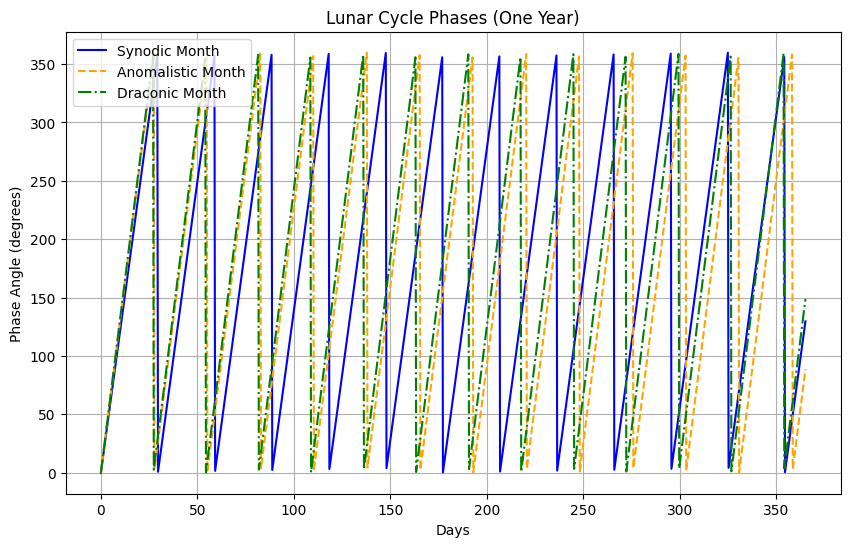

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Constants for lunar cycle calculations
synodic_month_days = 29.53059  # Average duration of a synodic month in days
anomalistic_month_days = 27.55455  # Average duration of an anomalistic month in days
draconic_month_days = 27.21222  # Average duration of a draconic month in days

# Generate time array spanning one year
time_days = np.linspace(0, 365, 1000)  # One year, 365 days

# Compute phase angles for each type of lunar cycle
synodic_phase = (360 * time_days) / synodic_month_days % 360
anomalistic_phase = (360 * time_days) / anomalistic_month_days % 360
draconic_phase = (360 * time_days) / draconic_month_days % 360

# Plotting the lunar cycle phases
plt.figure(figsize=(10, 6))
plt.plot(time_days, synodic_phase, label='Synodic Month', linestyle='-', color='blue')
plt.plot(time_days, anomalistic_phase, label='Anomalistic Month', linestyle='--', color='orange')
plt.plot(time_days, draconic_phase, label='Draconic Month', linestyle='-.', color='green')
plt.xlabel('Days')
plt.ylabel('Phase Angle (degrees)')
plt.title('Lunar Cycle Phases (One Year)')
plt.legend()
plt.grid(True)
plt.show()


# Seasonal Variation based on 2002 year

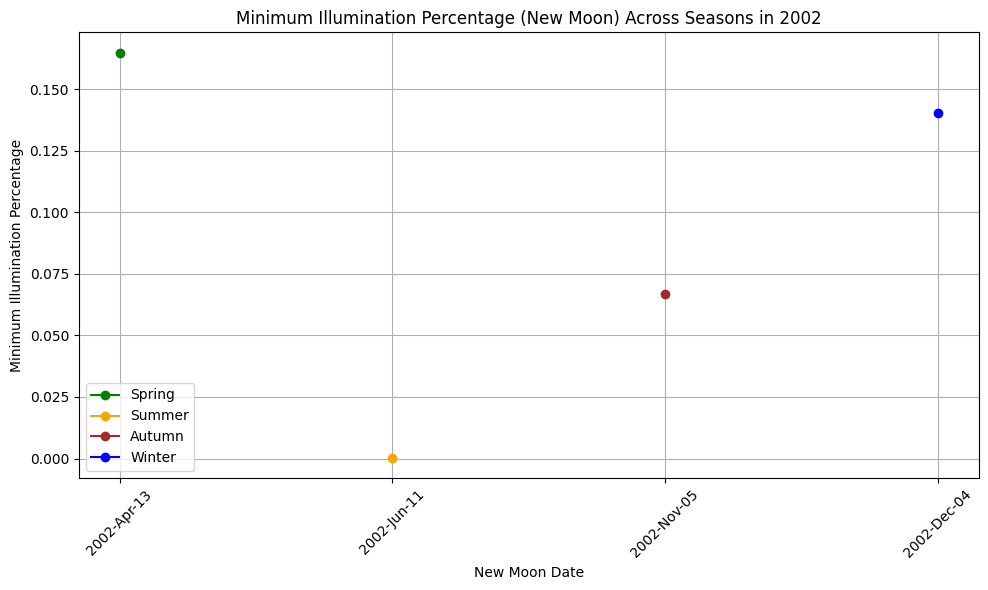

In [7]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Define start and end dates for each season in 2002
spring_start = datetime.datetime(2002, 3, 1)
spring_end = datetime.datetime(2002, 5, 31)
summer_start = datetime.datetime(2002, 6, 1)
summer_end = datetime.datetime(2002, 8, 31)
autumn_start = datetime.datetime(2002, 9, 1)
autumn_end = datetime.datetime(2002, 11, 30)
winter_start = datetime.datetime(2002, 12, 1)
winter_end = datetime.datetime(2002, 12, 31)

# Function to fetch ephemeris data for a given date
def fetch_ephemeris(start_date, end_date):
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_date.strftime('%Y-%m-%d'), 'stop': end_date.strftime('%Y-%m-%d'), 'step': '1d'})
    eph_data = obj.ephemerides()
    return eph_data

# Function to extract new moon date and minimum illumination percentage
def extract_new_moon_info(eph_data):
    min_illumination = np.min(eph_data['illumination'])
    min_illumination_index = np.where(eph_data['illumination'] == min_illumination)[0][0]
    new_moon_date = eph_data['datetime_str'][min_illumination_index]
    return new_moon_date, min_illumination

# Fetch and extract new moon info for each season
spring_data = fetch_ephemeris(spring_start, spring_end)
summer_data = fetch_ephemeris(summer_start, summer_end)
autumn_data = fetch_ephemeris(autumn_start, autumn_end)
winter_data = fetch_ephemeris(winter_start, winter_end)

spring_new_moon_date, spring_min_illumination = extract_new_moon_info(spring_data)
summer_new_moon_date, summer_min_illumination = extract_new_moon_info(summer_data)
autumn_new_moon_date, autumn_min_illumination = extract_new_moon_info(autumn_data)
winter_new_moon_date, winter_min_illumination = extract_new_moon_info(winter_data)

# Extract only the date part
spring_new_moon_date = spring_new_moon_date.split()[0]
summer_new_moon_date = summer_new_moon_date.split()[0]
autumn_new_moon_date = autumn_new_moon_date.split()[0]
winter_new_moon_date = winter_new_moon_date.split()[0]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(spring_new_moon_date, spring_min_illumination, marker='o', linestyle='-', color='green', label='Spring')
plt.plot(summer_new_moon_date, summer_min_illumination, marker='o', linestyle='-', color='orange', label='Summer')
plt.plot(autumn_new_moon_date, autumn_min_illumination, marker='o', linestyle='-', color='brown', label='Autumn')
plt.plot(winter_new_moon_date, winter_min_illumination, marker='o', linestyle='-', color='blue', label='Winter')

plt.xlabel('New Moon Date')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage (New Moon) Across Seasons in 2002')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.tight_layout()
plt.show()


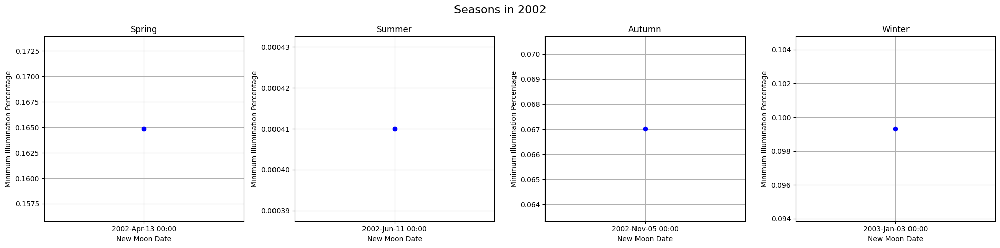

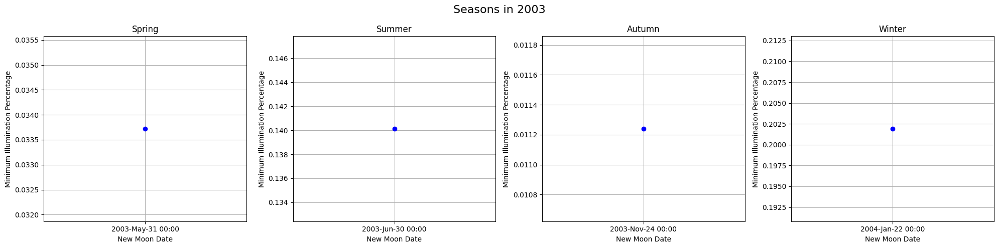

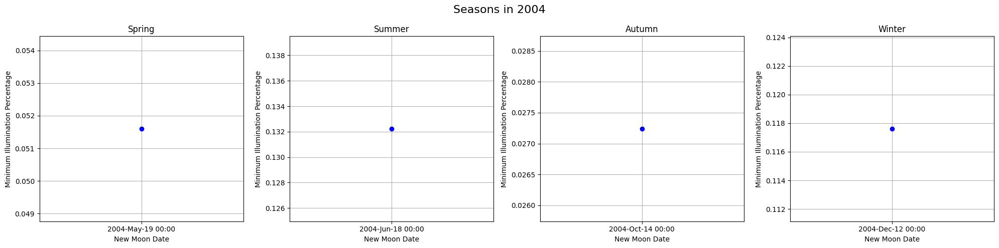

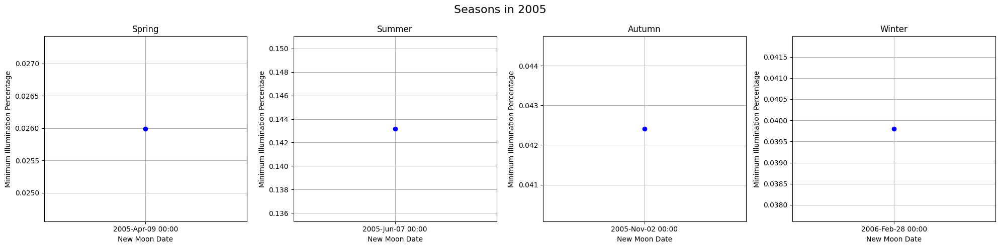

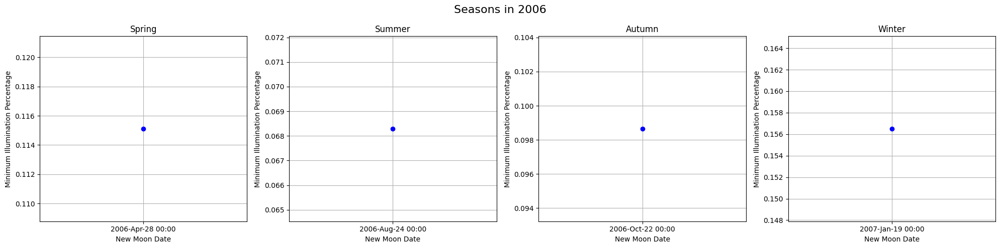

...

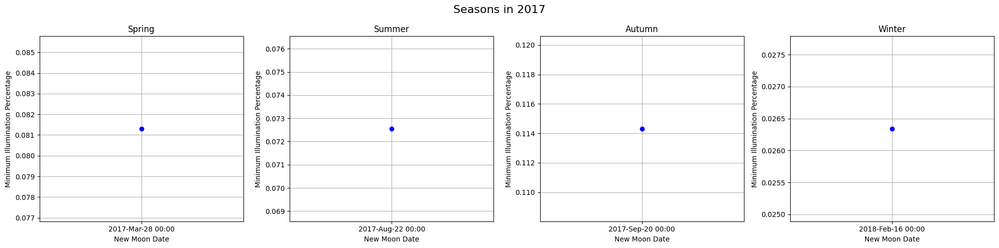

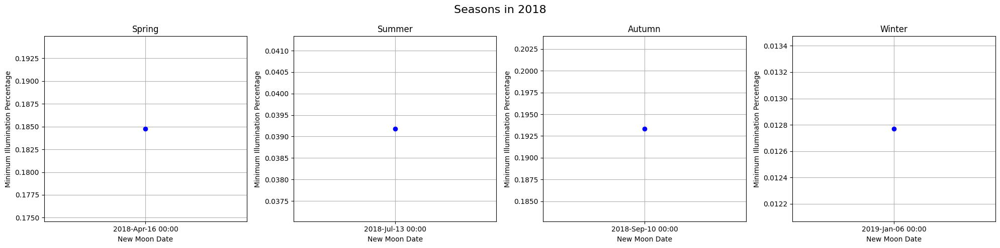

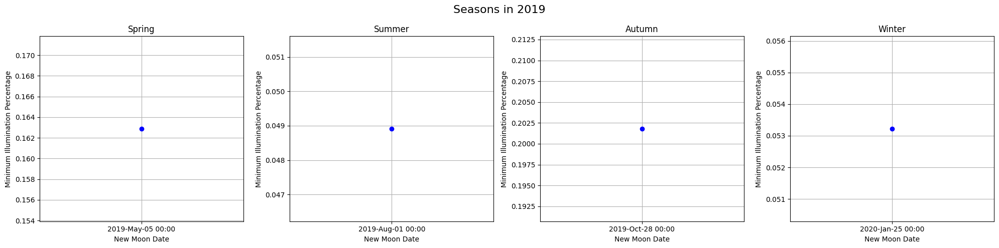

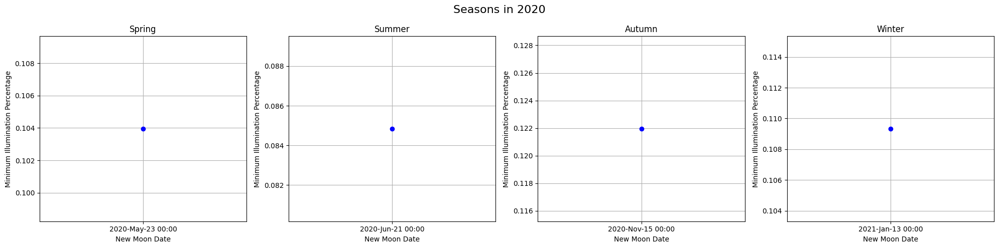

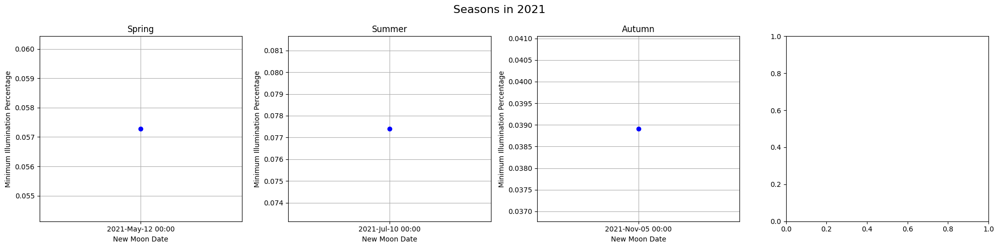

In [11]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Define start and end dates for each season in 2002 through 2021
seasons = {
    'Spring': [(year, datetime.datetime(year, 3, 1), datetime.datetime(year, 5, 31)) for year in range(2002, 2022)],
    'Summer': [(year, datetime.datetime(year, 6, 1), datetime.datetime(year, 8, 31)) for year in range(2002, 2022)],
    'Autumn': [(year, datetime.datetime(year, 9, 1), datetime.datetime(year, 11, 30)) for year in range(2002, 2022)],
    'Winter': [(year, datetime.datetime(year, 12, 1), datetime.datetime(year + 1, 2, 28)) for year in range(2002, 2021)]
}

# Function to fetch ephemeris data for a given date range
def fetch_ephemeris(start_date, end_date):
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_date.strftime('%Y-%m-%d'), 'stop': end_date.strftime('%Y-%m-%d'), 'step': '1d'})
    eph_data = obj.ephemerides()
    return eph_data

# Function to extract new moon date and minimum illumination percentage
def extract_new_moon_info(eph_data):
    min_illumination = np.min(eph_data['illumination'])
    min_illumination_index = np.where(eph_data['illumination'] == min_illumination)[0][0]
    new_moon_date = eph_data['datetime_str'][min_illumination_index]
    return new_moon_date, min_illumination

# Loop through each year and plot the seasons individually
for year in range(2002, 2022):
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
    fig.suptitle(f'Seasons in {year}', fontsize=16)
    for ax, (season, season_dates) in zip(axes, seasons.items()):
        for season_year, start_date, end_date in season_dates:
            if season_year == year:
                eph_data = fetch_ephemeris(start_date, end_date)
                new_moon_date, min_illumination = extract_new_moon_info(eph_data)
                ax.plot(new_moon_date, min_illumination, marker='o', linestyle='-', color='blue')
                ax.set_title(season)
                ax.set_xlabel('New Moon Date')
                ax.set_ylabel('Minimum Illumination Percentage')
                ax.grid(True)
    plt.tight_layout()
    plt.show()


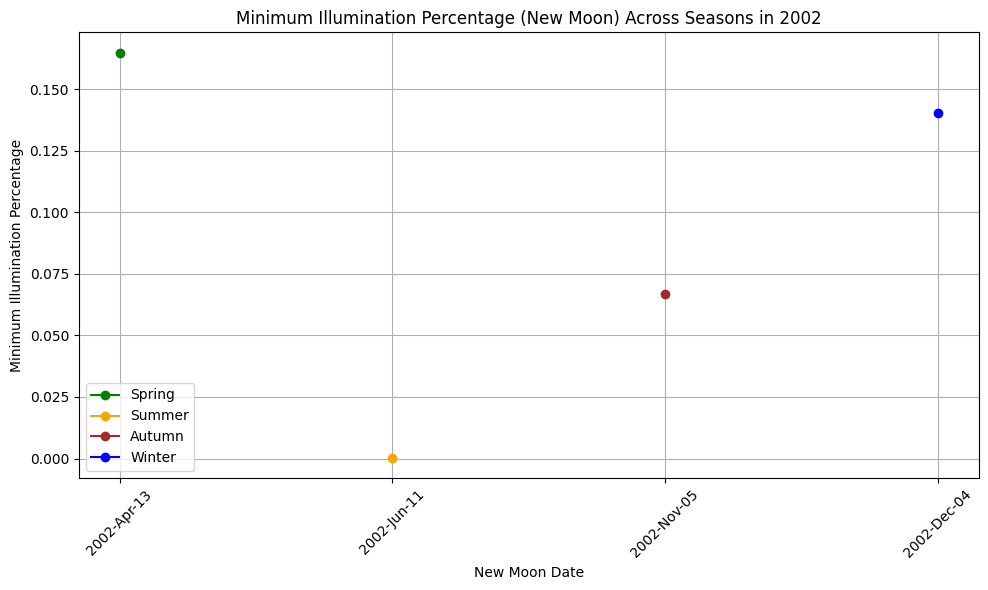

In [12]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Define start and end dates for each season in 2002
spring_start = datetime.datetime(2002, 3, 1)
spring_end = datetime.datetime(2002, 5, 31)
summer_start = datetime.datetime(2002, 6, 1)
summer_end = datetime.datetime(2002, 8, 31)
autumn_start = datetime.datetime(2002, 9, 1)
autumn_end = datetime.datetime(2002, 11, 30)
winter_start = datetime.datetime(2002, 12, 1)
winter_end = datetime.datetime(2002, 12, 31)

# Function to fetch ephemeris data for a given date
def fetch_ephemeris(start_date, end_date):
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_date.strftime('%Y-%m-%d'), 'stop': end_date.strftime('%Y-%m-%d'), 'step': '1d'})
    eph_data = obj.ephemerides()
    return eph_data

# Function to extract new moon date and minimum illumination percentage
def extract_new_moon_info(eph_data):
    min_illumination = np.min(eph_data['illumination'])
    min_illumination_index = np.where(eph_data['illumination'] == min_illumination)[0][0]
    new_moon_date = eph_data['datetime_str'][min_illumination_index]
    return new_moon_date, min_illumination

# Fetch and extract new moon info for each season
spring_data = fetch_ephemeris(spring_start, spring_end)
summer_data = fetch_ephemeris(summer_start, summer_end)
autumn_data = fetch_ephemeris(autumn_start, autumn_end)
winter_data = fetch_ephemeris(winter_start, winter_end)

spring_new_moon_date, spring_min_illumination = extract_new_moon_info(spring_data)
summer_new_moon_date, summer_min_illumination = extract_new_moon_info(summer_data)
autumn_new_moon_date, autumn_min_illumination = extract_new_moon_info(autumn_data)
winter_new_moon_date, winter_min_illumination = extract_new_moon_info(winter_data)

# Extract only the date part
spring_new_moon_date = spring_new_moon_date.split()[0]
summer_new_moon_date = summer_new_moon_date.split()[0]
autumn_new_moon_date = autumn_new_moon_date.split()[0]
winter_new_moon_date = winter_new_moon_date.split()[0]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(spring_new_moon_date, spring_min_illumination, marker='o', linestyle='-', color='green', label='Spring')
plt.plot(summer_new_moon_date, summer_min_illumination, marker='o', linestyle='-', color='orange', label='Summer')
plt.plot(autumn_new_moon_date, autumn_min_illumination, marker='o', linestyle='-', color='brown', label='Autumn')
plt.plot(winter_new_moon_date, winter_min_illumination, marker='o', linestyle='-', color='blue', label='Winter')

plt.xlabel('New Moon Date')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage (New Moon) Across Seasons in 2002')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.tight_layout()
plt.show()


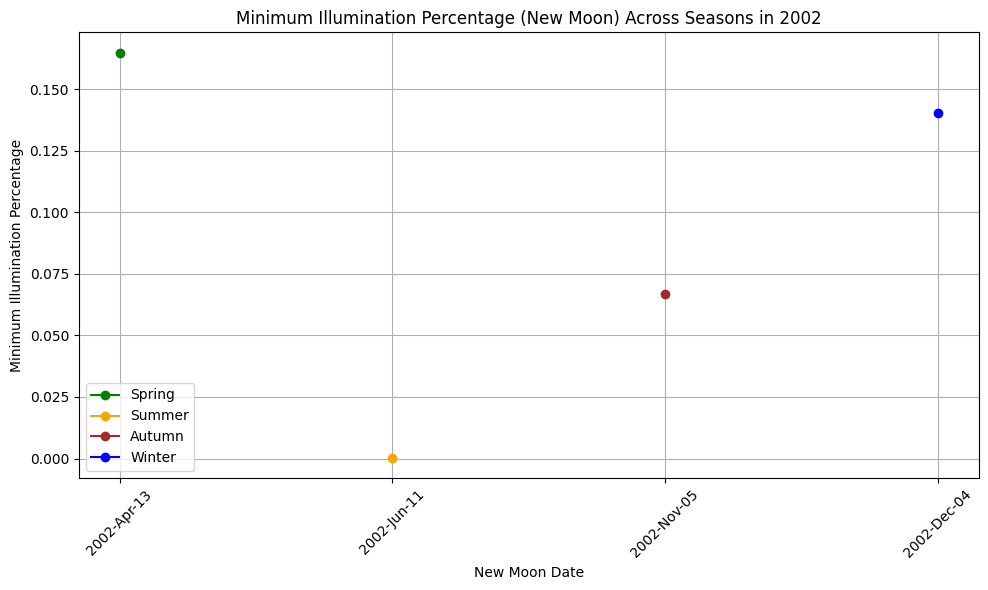

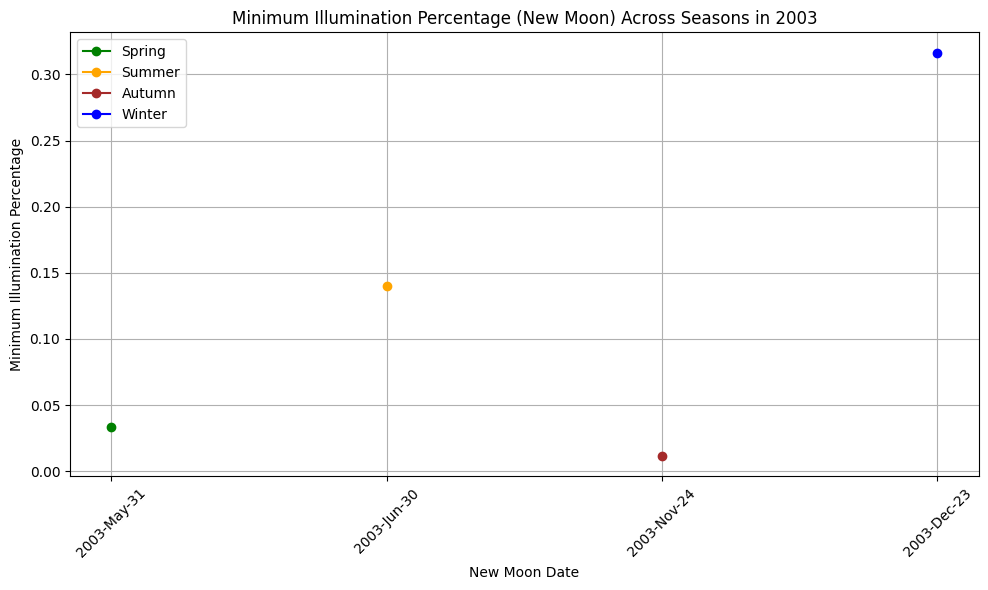

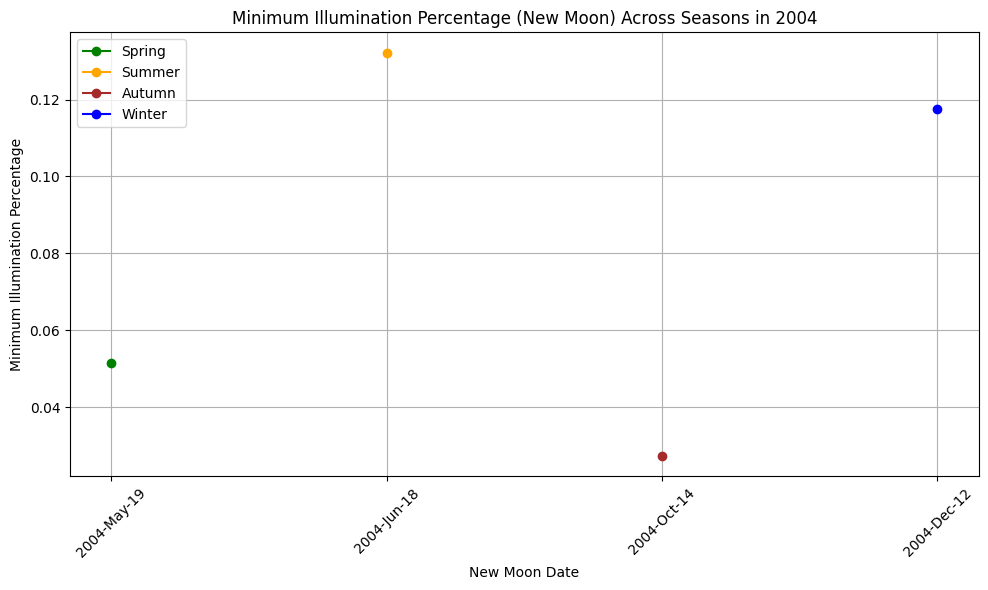

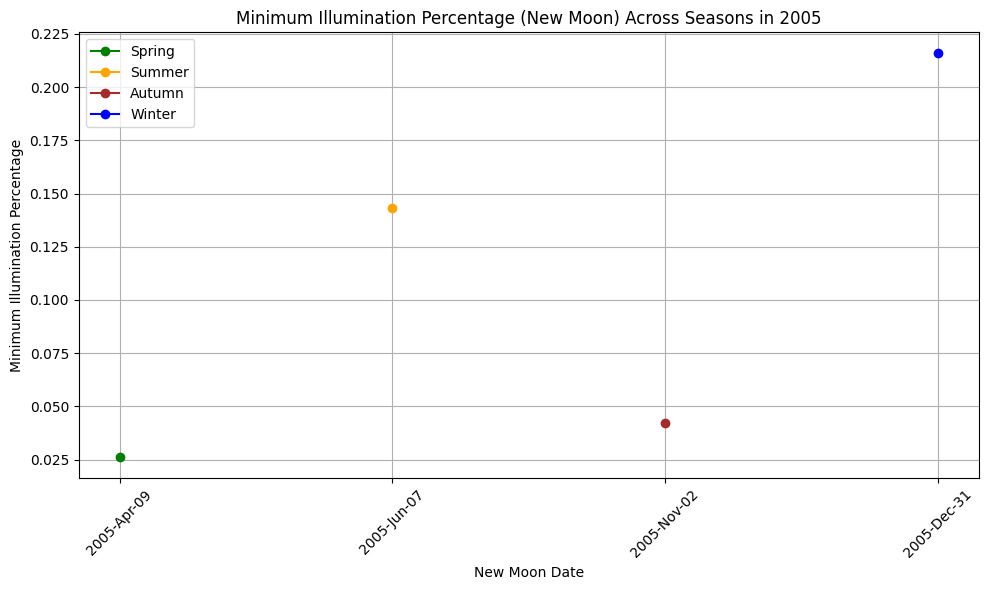

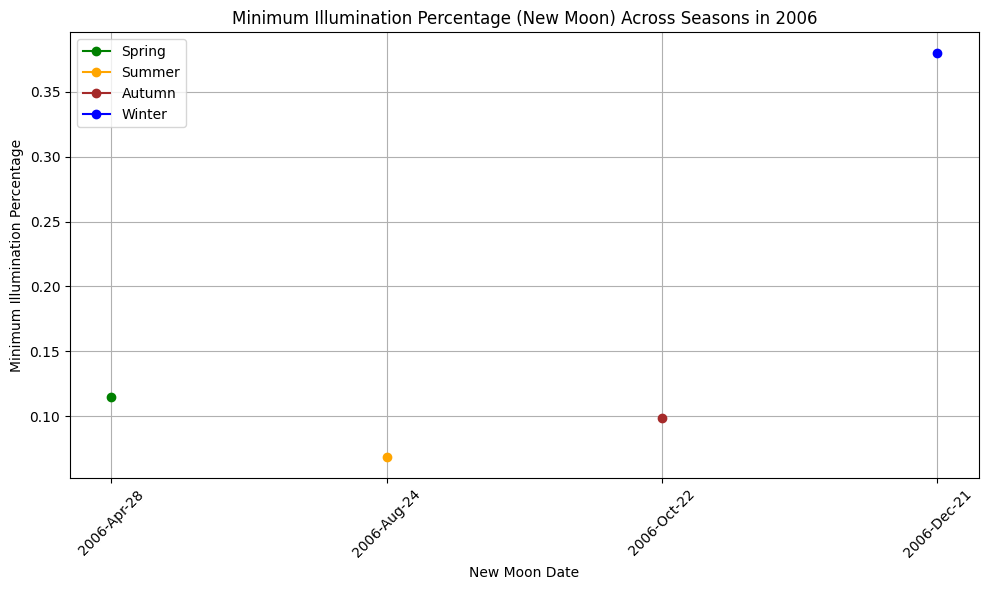

...

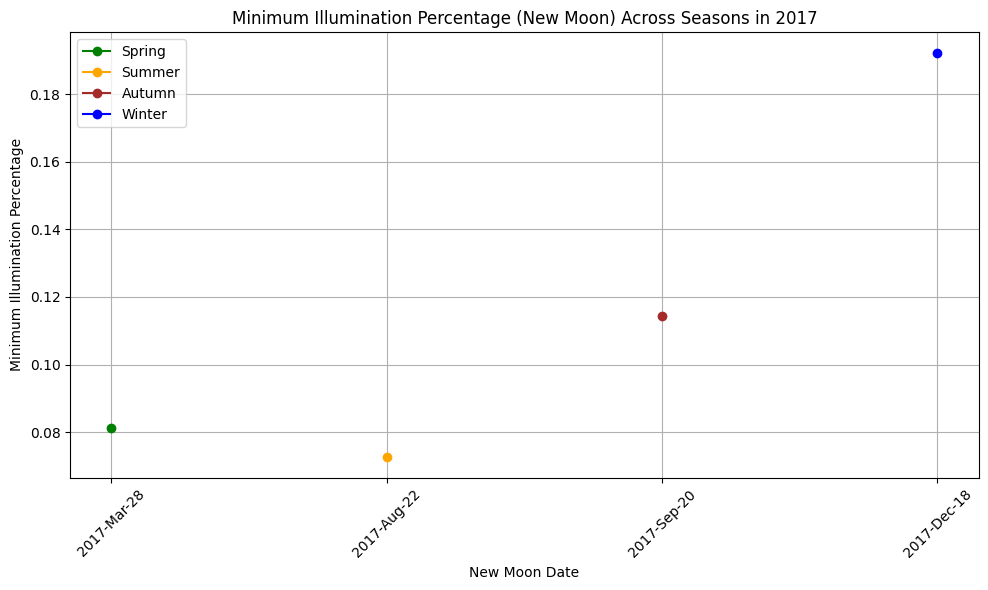

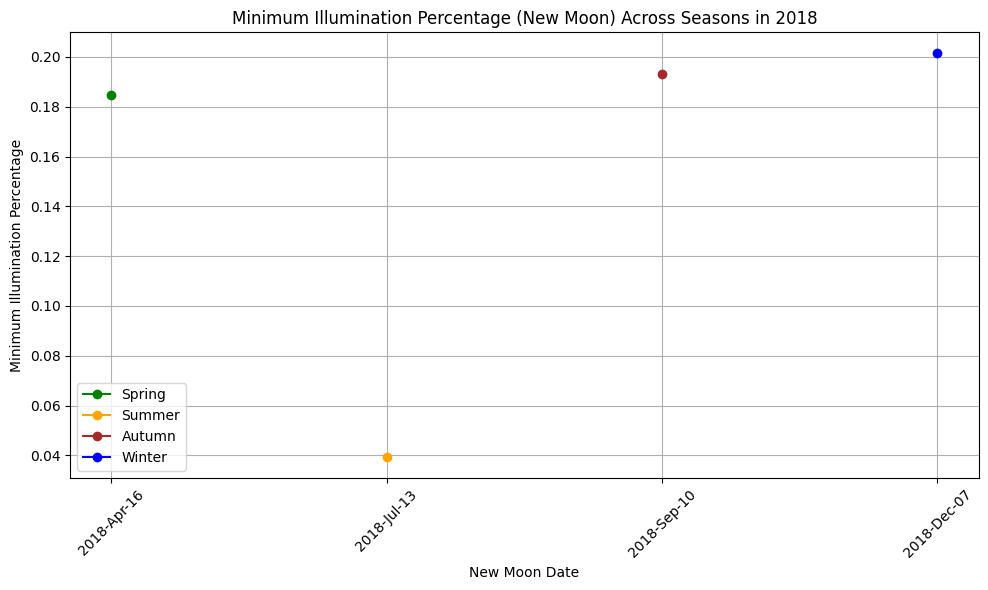

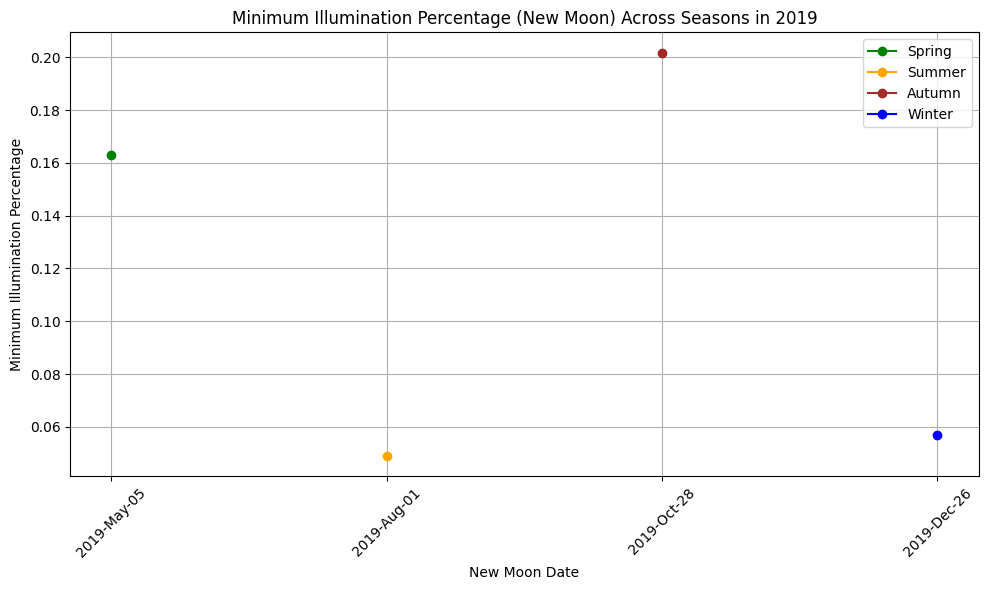

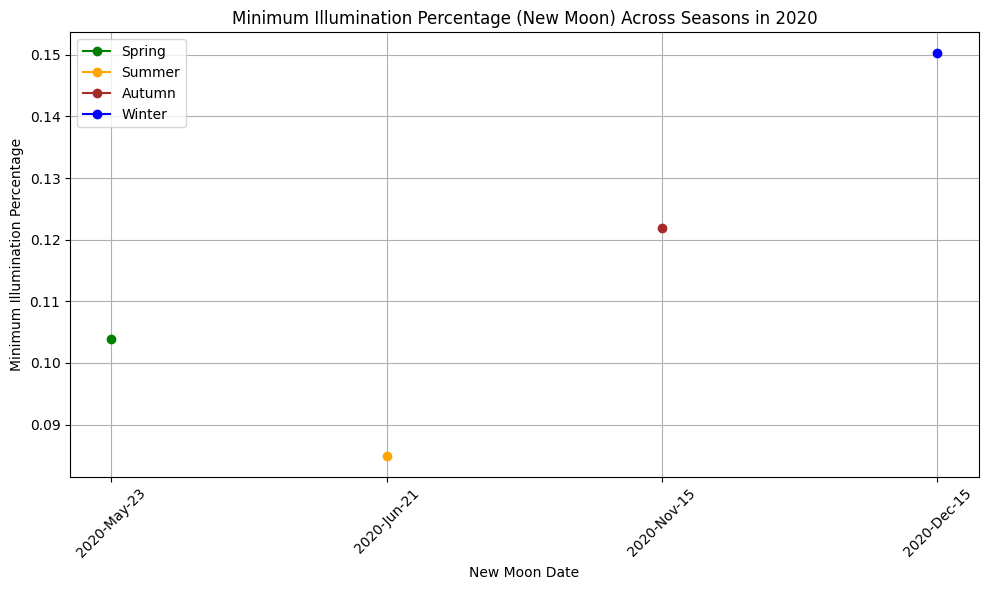

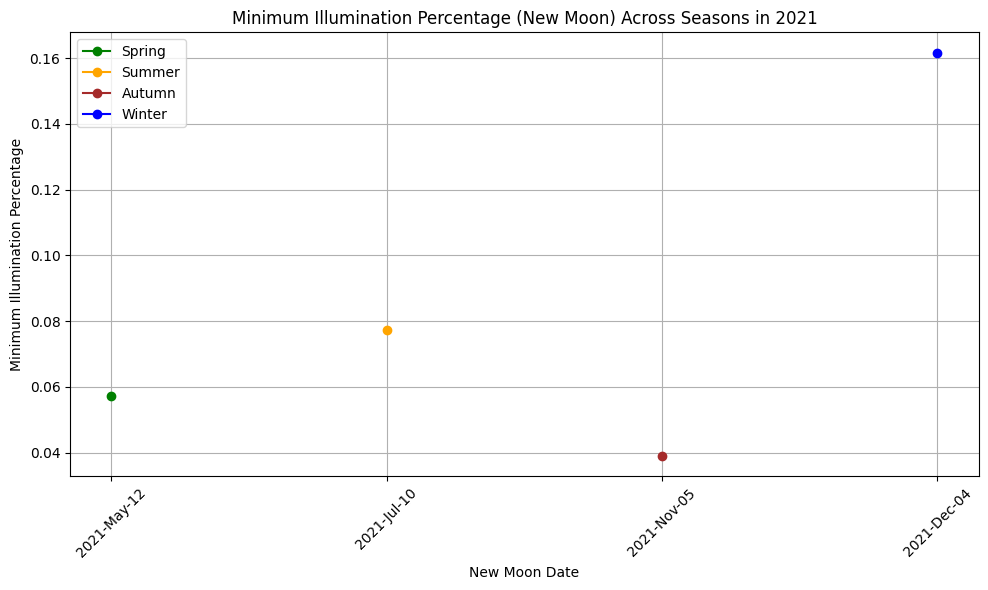

In [13]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Define start and end dates for each season in 2002
spring_start = datetime.datetime(2002, 3, 1)
spring_end = datetime.datetime(2002, 5, 31)
summer_start = datetime.datetime(2002, 6, 1)
summer_end = datetime.datetime(2002, 8, 31)
autumn_start = datetime.datetime(2002, 9, 1)
autumn_end = datetime.datetime(2002, 11, 30)
winter_start = datetime.datetime(2002, 12, 1)
winter_end = datetime.datetime(2002, 12, 31)

# Function to fetch ephemeris data for a given date
def fetch_ephemeris(start_date, end_date):
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_date.strftime('%Y-%m-%d'), 'stop': end_date.strftime('%Y-%m-%d'), 'step': '1d'})
    eph_data = obj.ephemerides()
    return eph_data

# Function to extract new moon date and minimum illumination percentage
def extract_new_moon_info(eph_data):
    min_illumination = np.min(eph_data['illumination'])
    min_illumination_index = np.where(eph_data['illumination'] == min_illumination)[0][0]
    new_moon_date = eph_data['datetime_str'][min_illumination_index]
    return new_moon_date, min_illumination

# Loop through each year from 2002 to 2021
for year in range(2002, 2022):
    # Define start and end dates for each season in the current year
    spring_start = datetime.datetime(year, 3, 1)
    spring_end = datetime.datetime(year, 5, 31)
    summer_start = datetime.datetime(year, 6, 1)
    summer_end = datetime.datetime(year, 8, 31)
    autumn_start = datetime.datetime(year, 9, 1)
    autumn_end = datetime.datetime(year, 11, 30)
    winter_start = datetime.datetime(year, 12, 1)
    winter_end = datetime.datetime(year, 12, 31)

    # Fetch and extract new moon info for each season
    spring_data = fetch_ephemeris(spring_start, spring_end)
    summer_data = fetch_ephemeris(summer_start, summer_end)
    autumn_data = fetch_ephemeris(autumn_start, autumn_end)
    winter_data = fetch_ephemeris(winter_start, winter_end)

    spring_new_moon_date, spring_min_illumination = extract_new_moon_info(spring_data)
    summer_new_moon_date, summer_min_illumination = extract_new_moon_info(summer_data)
    autumn_new_moon_date, autumn_min_illumination = extract_new_moon_info(autumn_data)
    winter_new_moon_date, winter_min_illumination = extract_new_moon_info(winter_data)

    # Extract only the date part
    spring_new_moon_date = spring_new_moon_date.split()[0]
    summer_new_moon_date = summer_new_moon_date.split()[0]
    autumn_new_moon_date = autumn_new_moon_date.split()[0]
    winter_new_moon_date = winter_new_moon_date.split()[0]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(spring_new_moon_date, spring_min_illumination, marker='o', linestyle='-', color='green', label='Spring')
    plt.plot(summer_new_moon_date, summer_min_illumination, marker='o', linestyle='-', color='orange', label='Summer')
    plt.plot(autumn_new_moon_date, autumn_min_illumination, marker='o', linestyle='-', color='brown', label='Autumn')
    plt.plot(winter_new_moon_date, winter_min_illumination, marker='o', linestyle='-', color='blue', label='Winter')

    plt.xlabel('New Moon Date')
    plt.ylabel('Minimum Illumination Percentage')
    plt.title(f'Minimum Illumination Percentage (New Moon) Across Seasons in {year}')
    plt.grid(True)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.legend()
    plt.tight_layout()
    plt.show()


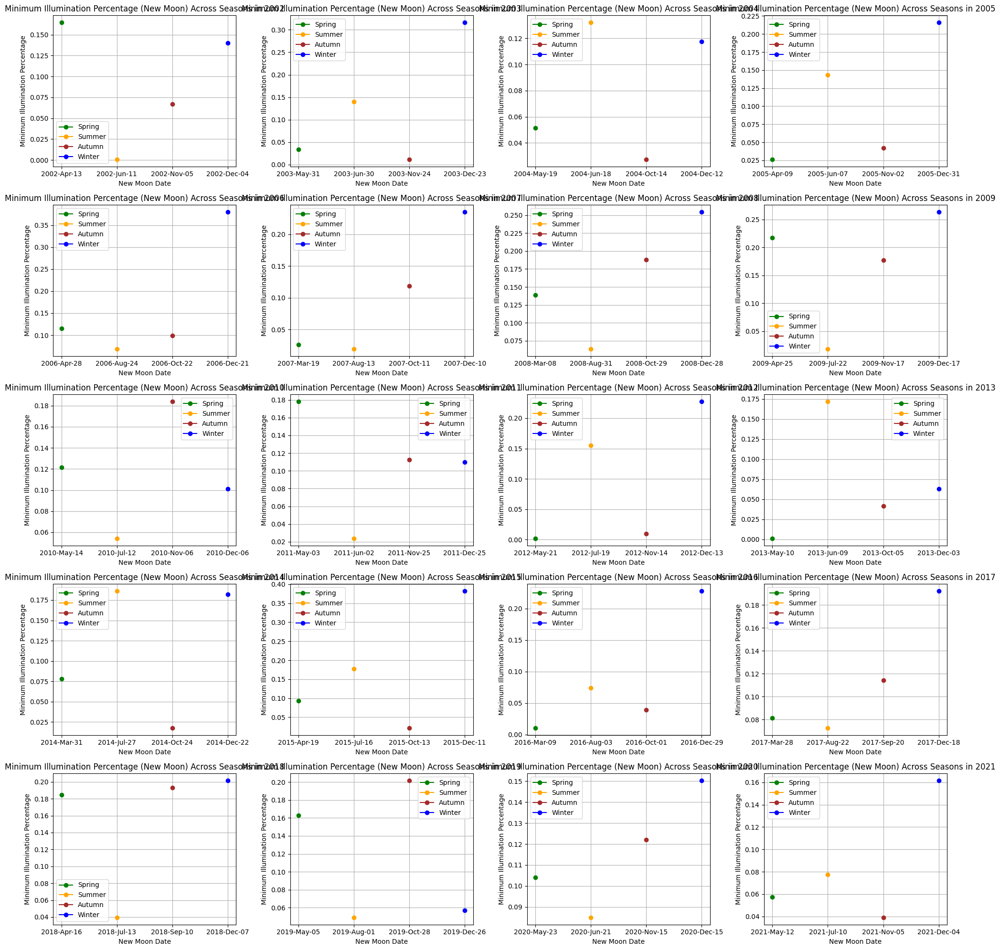

In [14]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Function to fetch ephemeris data for a given date
def fetch_ephemeris(start_date, end_date):
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_date.strftime('%Y-%m-%d'), 'stop': end_date.strftime('%Y-%m-%d'), 'step': '1d'})
    eph_data = obj.ephemerides()
    return eph_data

# Function to extract new moon date and minimum illumination percentage
def extract_new_moon_info(eph_data):
    min_illumination = np.min(eph_data['illumination'])
    min_illumination_index = np.where(eph_data['illumination'] == min_illumination)[0][0]
    new_moon_date = eph_data['datetime_str'][min_illumination_index]
    return new_moon_date, min_illumination

# Create a figure and axis objects for subplots
fig, axs = plt.subplots(5, 4, figsize=(20, 20))

# Loop through each year from 2002 to 2021
for year in range(2002, 2022):
    # Define start and end dates for each season in the current year
    spring_start = datetime.datetime(year, 3, 1)
    spring_end = datetime.datetime(year, 5, 31)
    summer_start = datetime.datetime(year, 6, 1)
    summer_end = datetime.datetime(year, 8, 31)
    autumn_start = datetime.datetime(year, 9, 1)
    autumn_end = datetime.datetime(year, 11, 30)
    winter_start = datetime.datetime(year, 12, 1)
    winter_end = datetime.datetime(year, 12, 31)

    # Fetch and extract new moon info for each season
    spring_data = fetch_ephemeris(spring_start, spring_end)
    summer_data = fetch_ephemeris(summer_start, summer_end)
    autumn_data = fetch_ephemeris(autumn_start, autumn_end)
    winter_data = fetch_ephemeris(winter_start, winter_end)

    spring_new_moon_date, spring_min_illumination = extract_new_moon_info(spring_data)
    summer_new_moon_date, summer_min_illumination = extract_new_moon_info(summer_data)
    autumn_new_moon_date, autumn_min_illumination = extract_new_moon_info(autumn_data)
    winter_new_moon_date, winter_min_illumination = extract_new_moon_info(winter_data)

    # Extract only the date part
    spring_new_moon_date = spring_new_moon_date.split()[0]
    summer_new_moon_date = summer_new_moon_date.split()[0]
    autumn_new_moon_date = autumn_new_moon_date.split()[0]
    winter_new_moon_date = winter_new_moon_date.split()[0]

    # Calculate the row and column index for the current year's plot
    row_index = (year - 2002) // 4
    col_index = (year - 2002) % 4

    # Plot the current year's data on the corresponding subplot
    axs[row_index, col_index].plot(spring_new_moon_date, spring_min_illumination, marker='o', linestyle='-', color='green', label='Spring')
    axs[row_index, col_index].plot(summer_new_moon_date, summer_min_illumination, marker='o', linestyle='-', color='orange', label='Summer')
    axs[row_index, col_index].plot(autumn_new_moon_date, autumn_min_illumination, marker='o', linestyle='-', color='brown', label='Autumn')
    axs[row_index, col_index].plot(winter_new_moon_date, winter_min_illumination, marker='o', linestyle='-', color='blue', label='Winter')

    axs[row_index, col_index].set_xlabel('New Moon Date')
    axs[row_index, col_index].set_ylabel('Minimum Illumination Percentage')
    axs[row_index, col_index].set_title(f'Minimum Illumination Percentage (New Moon) Across Seasons in {year}')
    axs[row_index, col_index].grid(True)
    axs[row_index, col_index].legend()

# Adjust layout to prevent overlap of subplots
plt.tight_layout()

# Show the plots
plt.show()


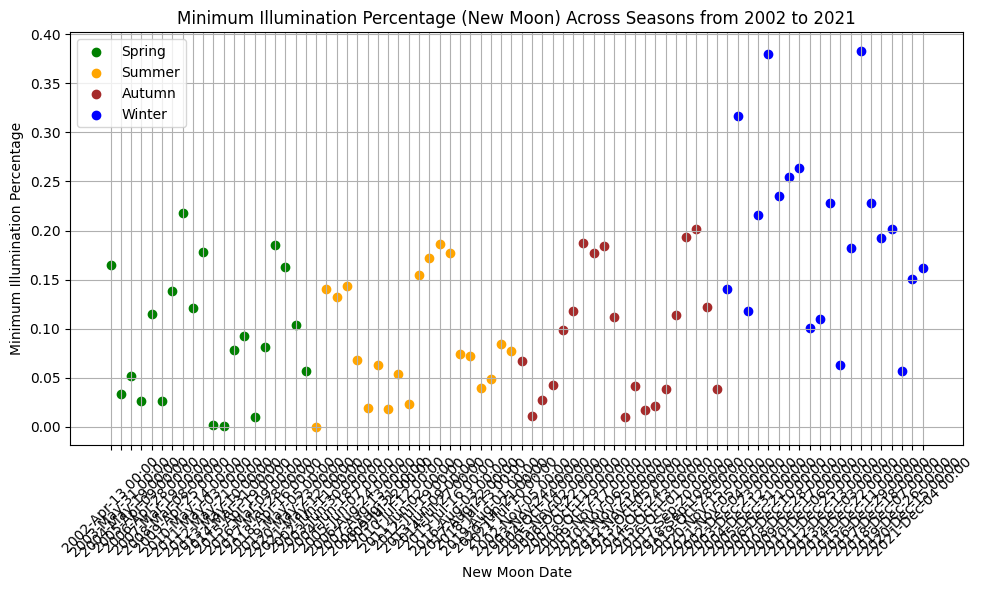

In [3]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime
import numpy as np

# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Function to fetch ephemeris data for a given date
def fetch_ephemeris(start_date, end_date):
    obj = Horizons(id=target_object_id, location=observer_location, epochs={'start': start_date.strftime('%Y-%m-%d'), 'stop': end_date.strftime('%Y-%m-%d'), 'step': '1d'})
    eph_data = obj.ephemerides()
    return eph_data

# Function to extract new moon date and minimum illumination percentage
def extract_new_moon_info(eph_data):
    min_illumination = np.min(eph_data['illumination'])
    min_illumination_index = np.where(eph_data['illumination'] == min_illumination)[0][0]
    new_moon_date = eph_data['datetime_str'][min_illumination_index]
    return new_moon_date, min_illumination

# Create lists to store data for each year
spring_dates = []
spring_illumination = []
summer_dates = []
summer_illumination = []
autumn_dates = []
autumn_illumination = []
winter_dates = []
winter_illumination = []

# Loop through each year from 2002 to 2021
for year in range(2002, 2022):
    # Define start and end dates for each season in the current year
    spring_start = datetime.datetime(year, 3, 1)
    spring_end = datetime.datetime(year, 5, 31)
    summer_start = datetime.datetime(year, 6, 1)
    summer_end = datetime.datetime(year, 8, 31)
    autumn_start = datetime.datetime(year, 9, 1)
    autumn_end = datetime.datetime(year, 11, 30)
    winter_start = datetime.datetime(year, 12, 1)
    winter_end = datetime.datetime(year, 12, 31)

    # Fetch and extract new moon info for each season
    spring_data = fetch_ephemeris(spring_start, spring_end)
    summer_data = fetch_ephemeris(summer_start, summer_end)
    autumn_data = fetch_ephemeris(autumn_start, autumn_end)
    winter_data = fetch_ephemeris(winter_start, winter_end)

    spring_new_moon_date, spring_min_illumination = extract_new_moon_info(spring_data)
    summer_new_moon_date, summer_min_illumination = extract_new_moon_info(summer_data)
    autumn_new_moon_date, autumn_min_illumination = extract_new_moon_info(autumn_data)
    winter_new_moon_date, winter_min_illumination = extract_new_moon_info(winter_data)

    # Store the new moon dates and minimum illumination percentages for each season
    spring_dates.append(spring_new_moon_date)
    spring_illumination.append(spring_min_illumination)
    summer_dates.append(summer_new_moon_date)
    summer_illumination.append(summer_min_illumination)
    autumn_dates.append(autumn_new_moon_date)
    autumn_illumination.append(autumn_min_illumination)
    winter_dates.append(winter_new_moon_date)
    winter_illumination.append(winter_min_illumination)

# Plot all data on a single plot
plt.figure(figsize=(10, 6))

# Plot spring data
plt.scatter(spring_dates, spring_illumination, color='green', label='Spring')
# Plot summer data
plt.scatter(summer_dates, summer_illumination, color='orange', label='Summer')
# Plot autumn data
plt.scatter(autumn_dates, autumn_illumination, color='brown', label='Autumn')
# Plot winter data
plt.scatter(winter_dates, winter_illumination, color='blue', label='Winter')

plt.xlabel('New Moon Date')
plt.ylabel('Minimum Illumination Percentage')
plt.title('Minimum Illumination Percentage (New Moon) Across Seasons from 2002 to 2021')
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()

# Show the plot
plt.show()


<ipython-input-6-ac38a1daa671>:47: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(new_moon_date, min_illumination, label=str(year), marker='o', alpha=0.7, cmap='viridis')


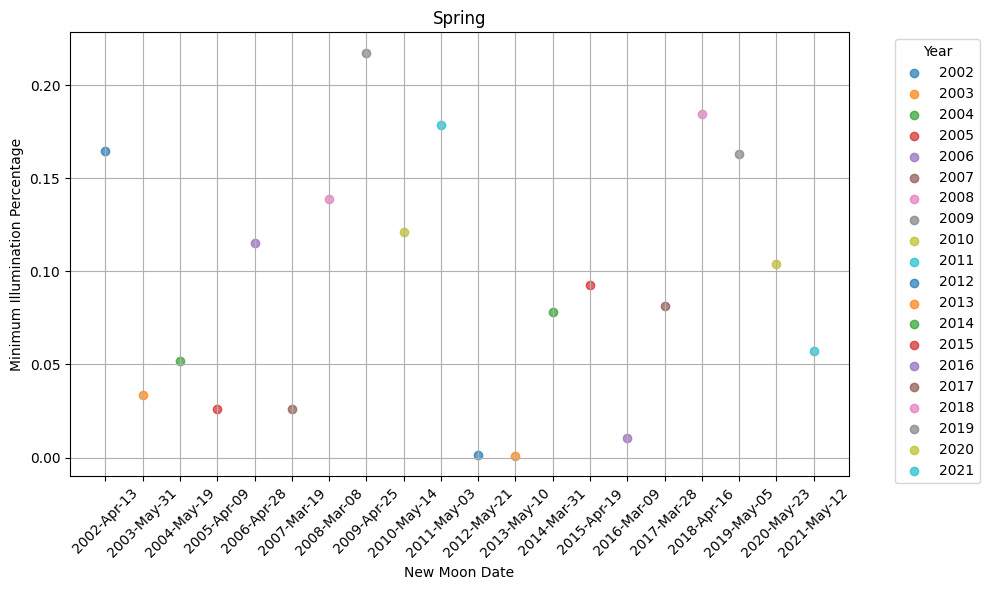

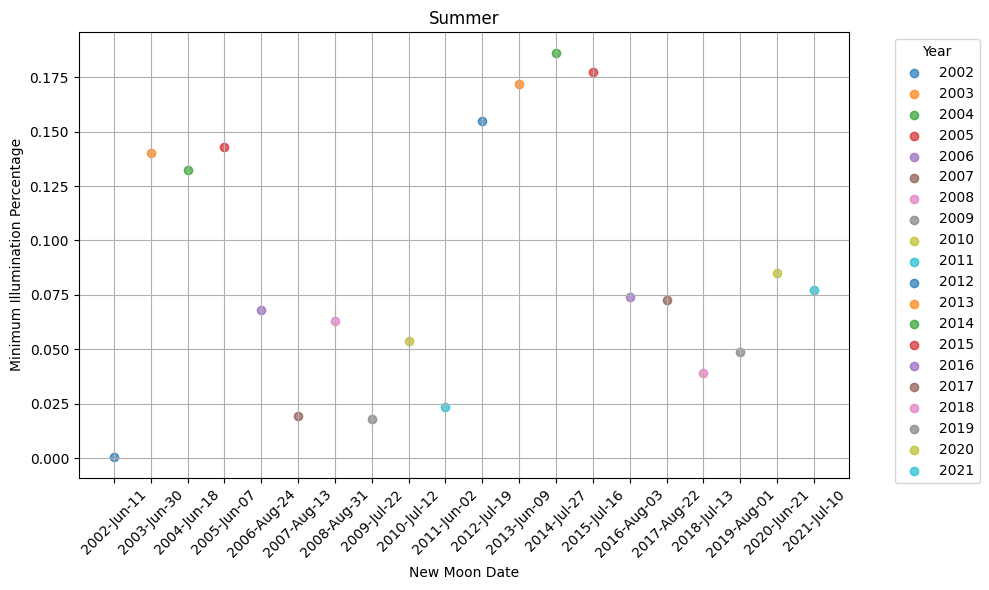

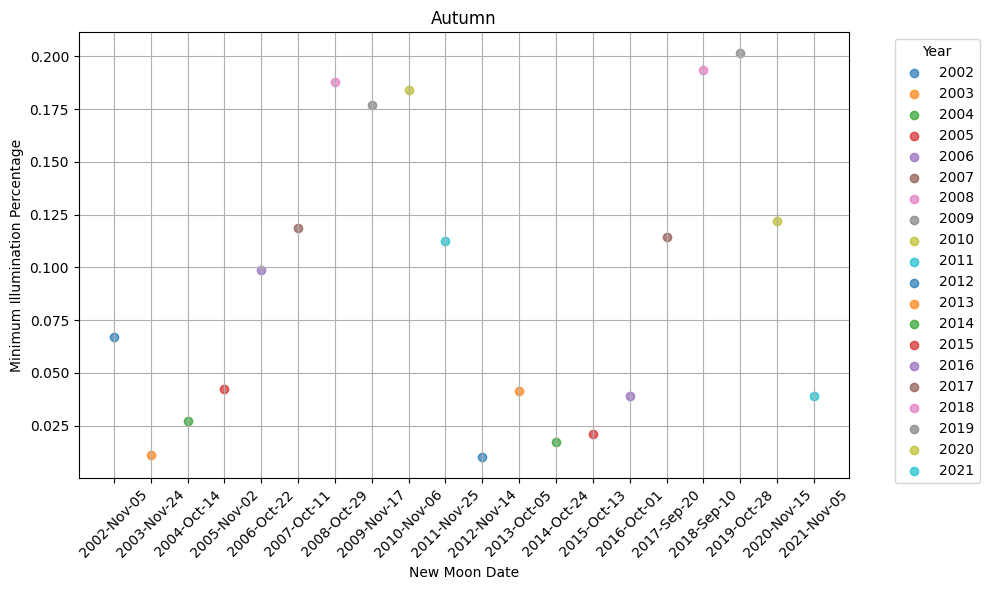

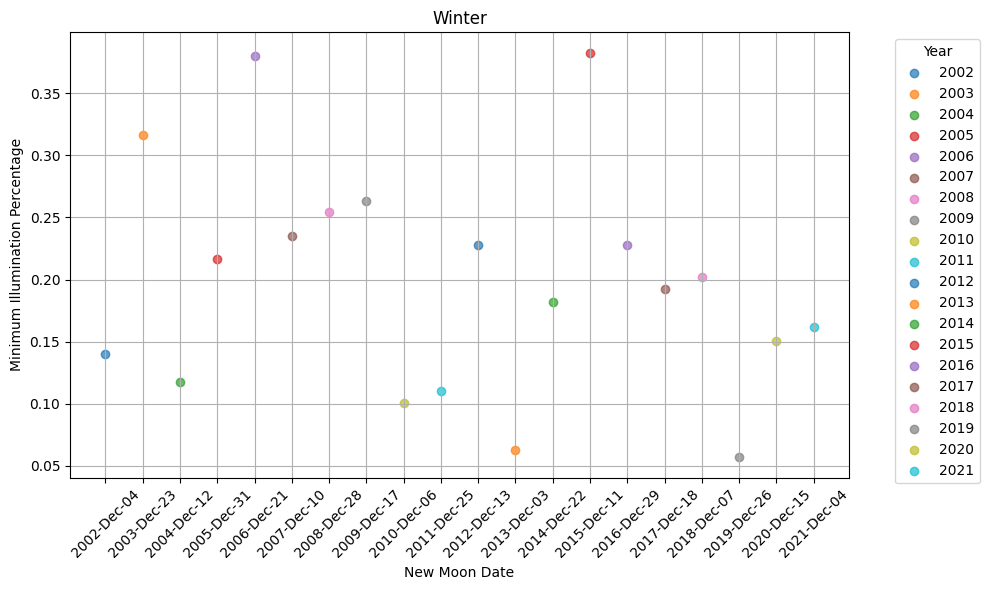

In [6]:
# Define parameters
target_object_id = '301'  # Moon
observer_location = '500@399'  # Geocentric

# Define start and end dates for each season
spring_start = datetime.datetime(2002, 3, 1)
spring_end = datetime.datetime(2002, 5, 31)
summer_start = datetime.datetime(2002, 6, 1)
summer_end = datetime.datetime(2002, 8, 31)
autumn_start = datetime.datetime(2002, 9, 1)
autumn_end = datetime.datetime(2002, 11, 30)
winter_start = datetime.datetime(2002, 12, 1)
winter_end = datetime.datetime(2002, 12, 31)

# Define years
years = range(2002, 2022)

# Initialize lists to store data for each season
spring_data = []
summer_data = []
autumn_data = []
winter_data = []

# Fetch ephemeris data for each season and year
for year in years:
    spring_data.append(fetch_ephemeris(datetime.datetime(year, 3, 1), datetime.datetime(year, 5, 31)))
    summer_data.append(fetch_ephemeris(datetime.datetime(year, 6, 1), datetime.datetime(year, 8, 31)))
    autumn_data.append(fetch_ephemeris(datetime.datetime(year, 9, 1), datetime.datetime(year, 11, 30)))
    winter_data.append(fetch_ephemeris(datetime.datetime(year, 12, 1), datetime.datetime(year, 12, 31)))

# Plot each season in a separate plot
seasons = ['Spring', 'Summer', 'Autumn', 'Winter']
season_data = [spring_data, summer_data, autumn_data, winter_data]

for i, season in enumerate(seasons):
    plt.figure(figsize=(10, 6))
    plt.title(season)
    plt.xlabel('New Moon Date')
    plt.ylabel('Minimum Illumination Percentage')

    for j, year in enumerate(years):
        # Extract new moon date and minimum illumination percentage for each year and season
        new_moon_date, min_illumination = extract_new_moon_info(season_data[i][j])
        new_moon_date = new_moon_date.split()[0]

        # Plot data with a different color for each year
        plt.scatter(new_moon_date, min_illumination, label=str(year), marker='o', alpha=0.7, cmap='viridis')

    plt.grid(True)
    plt.xticks(rotation=45)
    plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


In [7]:
from tabulate import tabulate

# Initialize an empty list to store data for each season
season_table_data = []

# Iterate over each season
for i, season in enumerate(seasons):
    season_data_rows = []

    # Iterate over each year
    for j, year in enumerate(years):
        # Extract new moon date and minimum illumination percentage for each year and season
        new_moon_date, min_illumination = extract_new_moon_info(season_data[i][j])
        new_moon_date = new_moon_date.split()[0]

        # Append data to the current season's data rows
        season_data_rows.append([year, new_moon_date, min_illumination])

    # Append the season's data to the table data list
    season_table_data.append((season, season_data_rows))

# Generate and print the table for each season
for season, data_rows in season_table_data:
    print(f"Season: {season}")
    print(tabulate(data_rows, headers=['Year', 'New Moon Date', 'Minimum Illumination Percentage']))
    print()


Season: Spring
  Year  New Moon Date      Minimum Illumination Percentage
------  ---------------  ---------------------------------
  2002  2002-Apr-13                                0.16486
  2003  2003-May-31                                0.03372
  2004  2004-May-19                                0.0516
  2005  2005-Apr-09                                0.02599
  2006  2006-Apr-28                                0.11511
  2007  2007-Mar-19                                0.02611
  2008  2008-Mar-08                                0.1387
  2009  2009-Apr-25                                0.21755
  2010  2010-May-14                                0.12132
  2011  2011-May-03                                0.17838
  2012  2012-May-21                                0.00147
  2013  2013-May-10                                0.00073
  2014  2014-Mar-31                                0.078
  2015  2015-Apr-19                                0.09293
  2016  2016-Mar-09                          

Seasonal Variation: The minimum illumination percentage (corresponding to the new moon) varies across different seasons within each year. For example, in the spring season, the minimum illumination percentage ranges from 0.00073 to 0.21755, indicating variation in lunar visibility during this season.
Yearly Trends: Comparing the data across different years reveals yearly trends in lunar behavior. For instance, in the spring season, the minimum illumination percentage shows fluctuations from year to year, suggesting that factors such as atmospheric conditions or lunar cycles may influence lunar visibility.
Consistency and Change: While some years exhibit consistent patterns in minimum illumination percentage across seasons, others show significant changes. Analyzing such patterns can help identify long-term trends or anomalies in lunar behavior.
Impact of Seasonal Changes: The data allows for the observation of how lunar behavior correlates with seasonal changes. For instance, comparing the minimum illumination percentages across different seasons within the same year provides insights into how seasonal factors such as daylight duration and weather conditions may affect lunar visibility.
Interpretation of Results: Interpretation of the results should consider factors such as geographical location, atmospheric conditions, and lunar cycles, which can influence the observed minimum illumination percentages.

how is this related to the 19 calendar system. how are variations reflect the times where leaping months should be inhabited

# All Months Aggregated into one graph

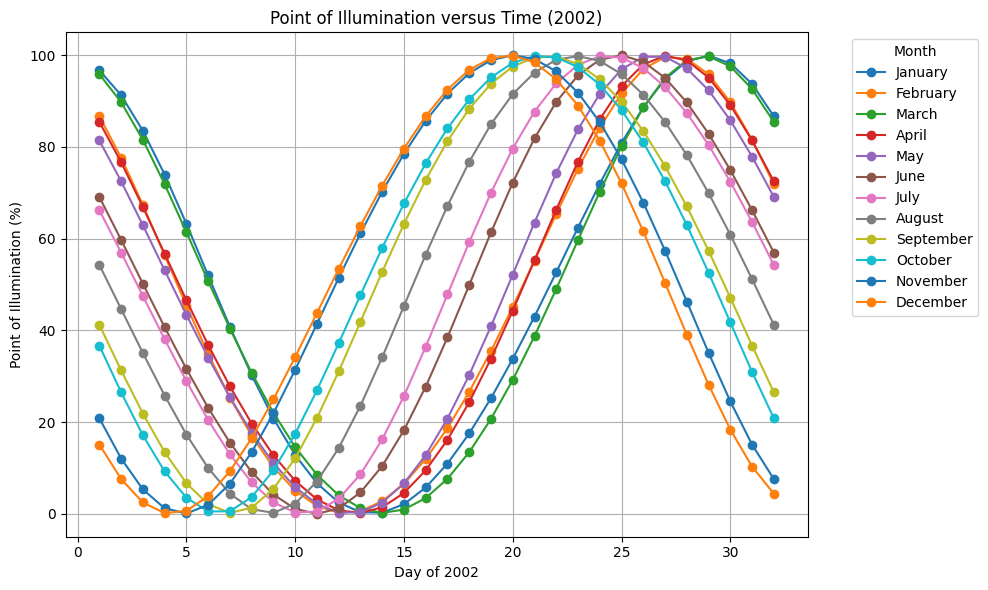

In [10]:
from astroquery.jplhorizons import Horizons
import matplotlib.pyplot as plt
import datetime

# Define parameters
target_object_id = '301'  # For example, '301' corresponds to the Moon
observer_location = '500@399'  # Observer location code, e.g., geocentric

# Create empty lists to store data for each month
all_days = []
all_illumination_percentages = []

# Loop over each month
for month in range(1, 13):
    # Define start and end dates for the current month
    start_month = datetime.datetime(2002, month, 1)
    end_month = datetime.datetime(2002, month, 1) + datetime.timedelta(days=31)

    # Create Horizons query object for the current month
    obj = Horizons(id=target_object_id, location=observer_location,
                   epochs={'start': start_month.strftime('%Y-%m-%d'),
                           'stop': end_month.strftime('%Y-%m-%d'),
                           'step': '1d'})

    try:
        # Retrieve ephemeris data for the current month
        eph_data = obj.ephemerides()

        # Extract time and point of illumination data
        jd_times = eph_data['datetime_jd']
        illumination_percentages = eph_data['illumination']

        # Convert Julian Date to days relative to the start of the month
        start_jd = int(jd_times[0])
        days = [(int(jd) - start_jd) + 1 for jd in jd_times]

        # Store data for the current month
        all_days.append(days)
        all_illumination_percentages.append(illumination_percentages)

    except Exception as e:
        print(f"Error fetching data for {start_month.strftime('%B %Y')}: {e}")

# Plotting
plt.figure(figsize=(10, 6))

# Loop over each month's data and plot it with a different color
for month in range(12):
    plt.plot(all_days[month], all_illumination_percentages[month], marker='o', linestyle='-',
             label=datetime.datetime(2002, month + 1, 1).strftime('%B'))

plt.xlabel('Day of 2002')
plt.ylabel('Point of Illumination (%)')
plt.title('Point of Illumination versus Time (2002)')
plt.grid(True)
plt.legend(title='Month', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# Astrophysical Phenomena

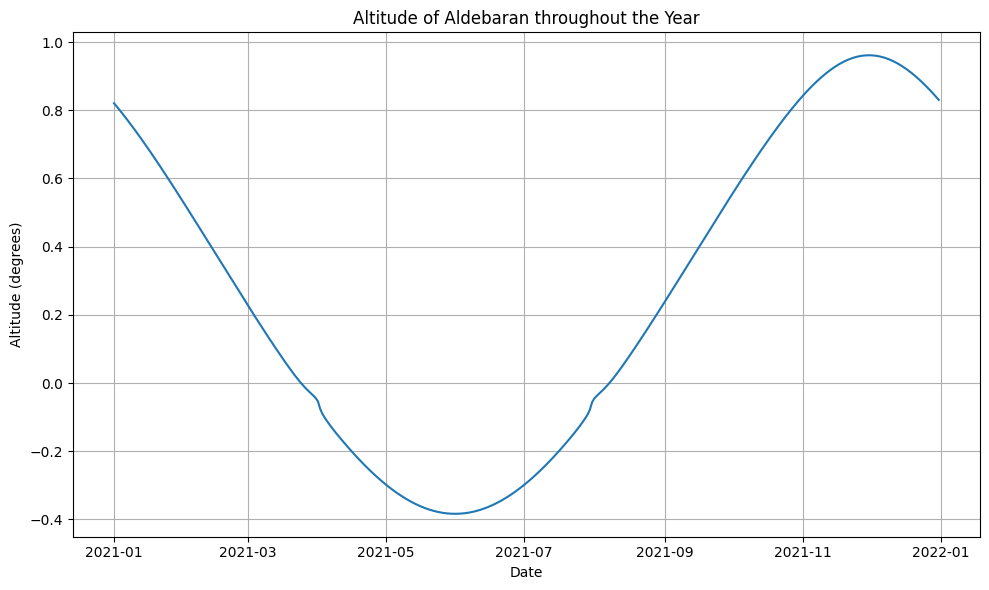

In [14]:
import ephem
import matplotlib.pyplot as plt
import datetime

# Define observer location (latitude, longitude, and elevation)
observer = ephem.Observer()
observer.lat = '51.48'  # Example latitude (e.g., for London)
observer.lon = '0.0'    # Example longitude
observer.elevation = 0  # Example elevation (in meters)

# Define the name of the star from the zodiac line (e.g., "Aldebaran")
star_name = "Aldebaran"

# Get the coordinates of Aldebaran for each day in the year
star_positions = []
for day in range(1, 366):
    date = datetime.datetime(year, 1, 1) + datetime.timedelta(days=day - 1)
    observer.date = date
    star = ephem.star(star_name)
    star.compute(observer)
    star_positions.append((date, star.alt))

# Plot the altitude of Aldebaran throughout the year
dates, altitudes = zip(*star_positions)
plt.figure(figsize=(10, 6))
plt.plot(dates, altitudes)
plt.xlabel('Date')
plt.ylabel('Altitude (degrees)')
plt.title(f'Altitude of {star_name} throughout the Year')
plt.grid(True)
plt.tight_layout()
plt.show()


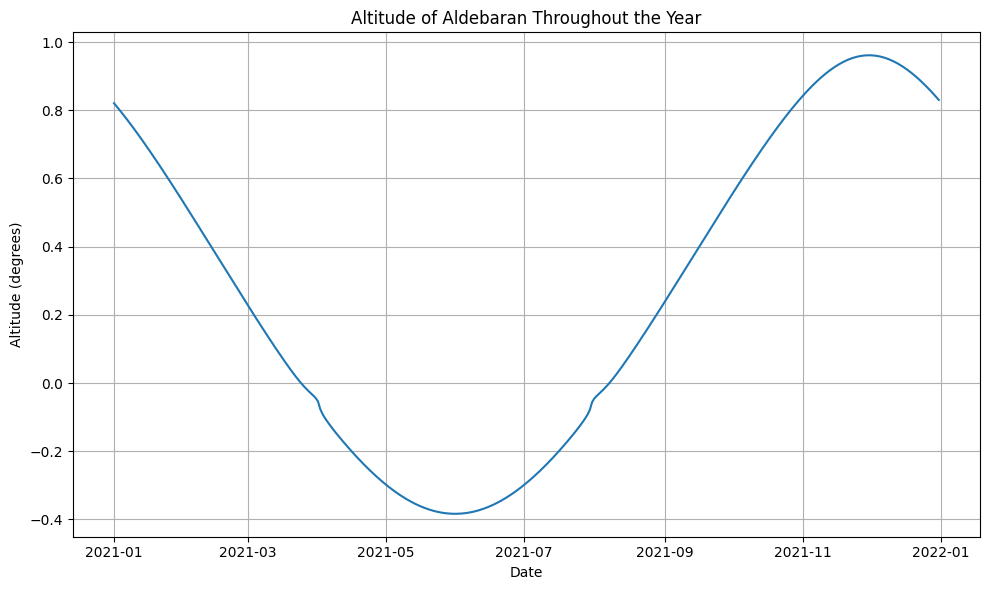

In [17]:
import ephem
import matplotlib.pyplot as plt
import datetime

# Define observer location (latitude, longitude, and elevation)
observer = ephem.Observer()
observer.lat = '51.48'  # Example latitude (e.g., for London)
observer.lon = '0.0'    # Example longitude
observer.elevation = 0  # Example elevation (in meters)

# Define celestial coordinates for Aldebaran (approximate values for demonstration)
aldebaran = ephem.FixedBody()
aldebaran._ra = ephem.hours('04:35:55')  # Right Ascension (in hours)
aldebaran._dec = ephem.degrees('16:30:35')  # Declination (in degrees)

# Get the altitude of Aldebaran for each day in the year
altitudes = []
for day in range(1, 366):
    date = datetime.datetime(year, 1, 1) + datetime.timedelta(days=day - 1)
    observer.date = date
    aldebaran.compute(observer)
    altitudes.append((date, aldebaran.alt))

# Plot the altitude of Aldebaran throughout the year
dates, altitudes = zip(*altitudes)
plt.figure(figsize=(10, 6))
plt.plot(dates, altitudes)

plt.xlabel('Date')
plt.ylabel('Altitude (degrees)')
plt.title('Altitude of Aldebaran Throughout the Year')
plt.grid(True)
plt.tight_layout()
plt.show()


# Initial Work

In [4]:
from astroquery.jplhorizons import Horizons
import pandas as pd

# Create a Horizons query object for Ceres
# Adjust epochs to cover the year 2002
obj = Horizons(id='301', location='500@3', epochs={'start': '2002-01-01', 'stop': '2002-12-31', 'step': '1d'})

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Print the retrieved ephemeris data
print(eph_data)
print(eph_data.columns)

print(eph_data['RA'])


targetname    datetime_str   datetime_jd ... alpha_true  PABLon  PABLat
   ---            ---             d      ...    deg       deg     deg  
---------- ----------------- ----------- ... ---------- -------- ------
Moon (301) 2002-Jan-01 00:00   2452275.5 ...    20.8769 110.7426  1.501
Moon (301) 2002-Jan-02 00:00   2452276.5 ...    34.3828   118.53 2.0704
Moon (301) 2002-Jan-03 00:00   2452277.5 ...    47.9041 126.3257 2.5739
Moon (301) 2002-Jan-04 00:00   2452278.5 ...    61.3455 134.0835 2.9929
Moon (301) 2002-Jan-05 00:00   2452279.5 ...    74.6379 141.7684 3.3102
Moon (301) 2002-Jan-06 00:00   2452280.5 ...    87.7394  149.358 3.5087
Moon (301) 2002-Jan-07 00:00   2452281.5 ...   100.6307 156.8413 3.5677
Moon (301) 2002-Jan-08 00:00   2452282.5 ...   113.3084 164.2146 3.4571
Moon (301) 2002-Jan-09 00:00   2452283.5 ...    125.776  171.478 3.1223
Moon (301) 2002-Jan-10 00:00   2452284.5 ...   138.0372  178.631 2.4482
       ...               ...         ... ...        ...      ...

In [7]:
eph_data.info()


<Table masked=True length=365>
      name        dtype       unit     n_bad
---------------- ------- ------------- -----
      targetname   str10           ---     0
    datetime_str   str17           ---     0
     datetime_jd float64             d     0
  solar_presence    str1           ---     0
  lunar_presence    str1           ---     0
              RA float64           deg     0
             DEC float64           deg     0
          RA_app float64           deg     0
         DEC_app float64           deg     0
         RA_rate float64    arcsec / h     0
        DEC_rate float64    arcsec / h     0
              AZ   int64           deg   365
              EL   int64           deg   365
         AZ_rate   int64  arcsec / min   365
         EL_rate   int64  arcsec / min   365
           sat_X float64        arcsec     0
           sat_Y float64        arcsec     0
        sat_PANG float64           deg     0
    siderealtime   int64             h   365
         airmass   int64

In [ ]:
from astroquery.jplhorizons import Horizons

# Create a Horizons query object for Mars
obj = Horizons(id='499', location='568', epochs={'start':'2024-04-15', 'stop':'2024-04-16', 'step':'1h'})

# Perform the query to retrieve ephemeris data
eph = obj.ephemerides()

# Print the retrieved ephemeris data
print(eph)

targetname    datetime_str      datetime_jd    ... alpha_true  PABLon   PABLat
   ---            ---                d         ...    deg       deg      deg  
---------- ----------------- ----------------- ... ---------- -------- -------
Mars (499) 2024-Apr-15 00:00         2460415.5 ...    26.2513 334.4354 -1.5935
Mars (499) 2024-Apr-15 01:00 2460415.541666667 ...    26.2573 334.4646 -1.5935
Mars (499) 2024-Apr-15 02:00 2460415.583333333 ...    26.2633 334.4939 -1.5935
Mars (499) 2024-Apr-15 03:00       2460415.625 ...    26.2693 334.5233 -1.5936
Mars (499) 2024-Apr-15 04:00 2460415.666666667 ...    26.2754 334.5527 -1.5936
Mars (499) 2024-Apr-15 05:00 2460415.708333333 ...    26.2816 334.5821 -1.5937
Mars (499) 2024-Apr-15 06:00        2460415.75 ...    26.2878 334.6115 -1.5937
Mars (499) 2024-Apr-15 07:00 2460415.791666667 ...    26.2941 334.6409 -1.5938
Mars (499) 2024-Apr-15 08:00 2460415.833333333 ...    26.3004 334.6704 -1.5939
Mars (499) 2024-Apr-15 09:00       2460415.875 ...  

represents ephemeris information for the specified celestial object (in this case, Mars) for the given time period and location.

Ephemeris data includes various parameters that describe the position and motion of a celestial body at specific times. Some common parameters included in ephemeris data are:

Date and time of the observation
Apparent coordinates (e.g., right ascension and declination)
Angular separation from the Sun
Distance from Earth
Apparent magnitude (brightness)
Phase angle (for objects like the Moon or planets)



id='499' specifies the target object's identifier. In this case, '499' corresponds to Mars in the JPL Horizons database.

location='568' specifies the observer's location. The value '568' corresponds to the location code for the Geocentric observer (Earth-based observer).

epochs={'start':'2024-04-15', 'stop':'2024-04-16', 'step':'1h'} defines the time range for the query.

'start' specifies the start date of the query, which is April 15, 2024.
'stop' specifies the end date of the query, which is April 16, 2024.
'step' specifies the time step for the query results. In this case, it's set to '1h', indicating that the ephemeris data will be retrieved at hourly intervals between the start and stop dates.
Overall, this configuration sets up a query to retrieve ephemeris data for Mars from April 15, 2024, to April 16, 2024, with results provided at hourly intervals.

In [ ]:
from astroquery.jplhorizons import Horizons

# Create a Horizons query object for Ceres
obj = Horizons(id='301', location='500@3', epochs=2458133.33546)

# Retrieve ephemeris data
eph_data = obj.ephemerides()

# Print the retrieved ephemeris data

print(eph_data)





targetname       datetime_str        datetime_jd  ... alpha_true  PABLon  PABLat
   ---               ---                  d       ...    deg       deg     deg  
---------- ------------------------ ------------- ... ---------- -------- ------
Moon (301) 2018-Jan-14 20:03:03.744 2458133.33546 ...   155.2411 191.8981  8.699


obj = Horizons(id='Ceres', location='568', epochs=2458133.33546): This line creates a Horizons query object named obj for the celestial object "Ceres".

id='Ceres': Specifies the target object's identifier as "Ceres". "Ceres" is a dwarf planet located in the asteroid belt between Mars and Jupiter.
location='568': Specifies the observer's location. The value '568' corresponds to the location code for the Geocentric observer (Earth-based observer).
epochs=2458133.33546: Specifies the time for which the ephemeris data is requested. The value '2458133.33546' represents the Julian Date for the specific date and time.
print(obj): This line prints information about the Horizons query object obj, including the target object ("Ceres"), observer's location, epochs (time), and other relevant details.

# Sadeen


In [ ]:

# Function to perform cubic spline fit
def perform_cubic_spline_fit(eph):
    # Perform cubic spline fit on illumination versus time data
    times = np.array(eph['datetime_jd'], dtype=float)
    illuminations = eph['illumination']
    print("Times:", times)
    print("Illuminations:", illuminations)
    cubic_spline = CubicSpline(times, illuminations)
    return cubic_spline

# Function to plot average new moon timing
def plot_average_new_moon_timing():
    # Plot average timing of new moon for each month in a year
    months = np.arange(1, 13)
    new_moon_dates = []

    for month in months:
        # Approximate new moon date for each month
        new_moon_date = approximate_new_moon()
        print("Month:", month, "New Moon Date:", new_moon_date)
        new_moon_dates.append(new_moon_date)

    plt.plot(months, new_moon_dates, marker='o')
    plt.xlabel('Month')
    plt.ylabel('New Moon Date')
    plt.title('Average Timing of New Moon for Each Month')
    plt.grid(True)
    plt.show()

# Main function
def main():
    # Approximate new moon date
    new_moon_date = approximate_new_moon()
    print("Approximate New Moon Date:", new_moon_date)

    # Retrieve moon data around new moon date
    eph = get_moon_data(new_moon_date)
    print("Moon Data:", eph)

    # Perform cubic spline fit
    cubic_spline = perform_cubic_spline_fit(eph)
    print("Cubic Spline:", cubic_spline)

    # Plot illumination versus time
    times = np.array(eph['datetime_jd'], dtype=float)
    plt.plot(times, eph['illumination'], label='Actual Illumination')
    plt.plot(times, cubic_spline(times), label='Cubic Spline Fit')
    plt.xlabel('Time (Julian Date)')
    plt.ylabel('Illumination')
    plt.title('Illumination of Moon versus Time')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot average new moon timing
    plot_average_new_moon_timing()

# Illumination Point Vs. Time

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import ephem

# Initialize observer
observer = ephem.Observer()

# Define the time range
start_date = ephem.Date("2024/01/01")
end_date = ephem.Date("2024/12/31")
num_days = int(end_date - start_date)  # Convert to integer

# Initialize arrays to store data
jd_array = np.zeros(num_days)
illumination_array = np.zeros(num_days)
illumination_point_array = np.zeros(num_days)

# Loop over each day and compute moon illumination
for i in range(num_days):
    current_date = start_date + i
    observer.date = current_date
    moon = ephem.Moon(observer)
    jd_array[i] = current_date
    illumination_array[i] = moon.phase / 100.0  # Phase ranges from 0 to 100

    # Calculate the phase angle manually
    sun = ephem.Sun(observer)
    ephem.moon.compute(observer)
    illumination_point_array[i] = ephem.separation(sun, moon)  # Phase angle

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(jd_array, illumination_array, label='Illumination Percentage')
plt.plot(jd_array, illumination_point_array, label='Illumination Point')
plt.xlabel('Julian Date')
plt.ylabel('Value')
plt.title('Moon Illumination vs Time')
plt.legend()
plt.grid(True)
plt.show()


AttributeError: module 'ephem' has no attribute 'moon'

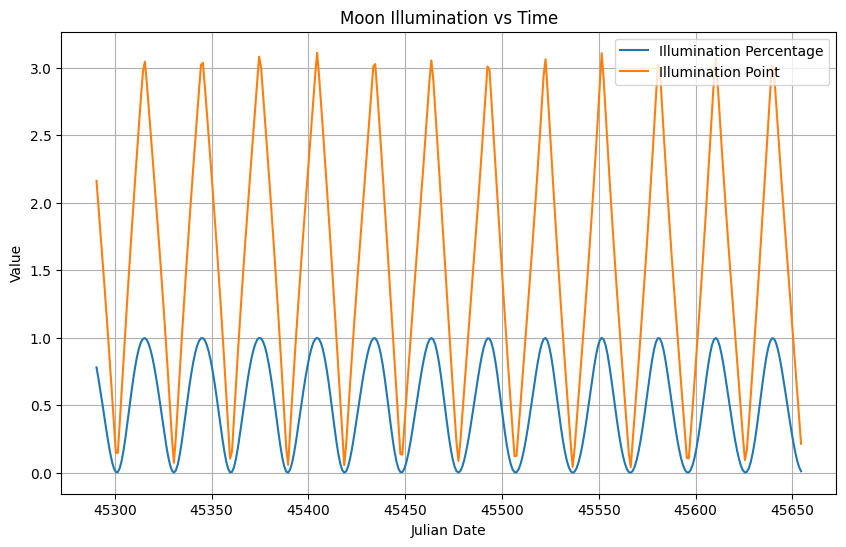

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import ephem

# Define the time range
start_date = ephem.Date("2024/01/01")
end_date = ephem.Date("2024/12/31")
num_days = int(end_date - start_date)  # Convert to integer

# Initialize arrays to store data
jd_array = np.zeros(num_days)
illumination_array = np.zeros(num_days)
illumination_point_array = np.zeros(num_days)

# Loop over each day and compute moon illumination
for i in range(num_days):
    current_date = start_date + i
    moon = ephem.Moon(current_date)
    jd_array[i] = current_date
    illumination_array[i] = moon.phase / 100.0  # Phase ranges from 0 to 100

    # Calculate the phase angle manually
    sun = ephem.Sun(current_date)
    moon.compute(current_date)
    illumination_point_array[i] = ephem.separation(sun, moon)  # Phase angle

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(jd_array, illumination_array, label='Illumination Percentage')
plt.plot(jd_array, illumination_point_array, label='Illumination Point')
plt.xlabel('Julian Date')
plt.ylabel('Value')
plt.title('Moon Illumination vs Time')
plt.legend()
plt.grid(True)
plt.show()


Illumination Percentage: It computes the percentage of the moon that is illuminated by the sun at each point in time (expressed as a value between 0 and 1, where 0 means completely dark and 1 means fully illuminated).
Illumination Point: It calculates the angle between the sun and the moon (the phase angle) at each point in time. This angle indicates the portion of the moon's face that is visible from the Earth.
Here's a breakdown of the code:

It uses the ephem library, which provides functions to compute the positions of celestial objects such as the moon and the sun.
It defines a time range from January 1, 2024, to December 31, 2024.
It initializes arrays to store the Julian dates, the illumination percentages, and the illumination points.
It loops over each day in the defined time range:
For each day, it computes the position of the moon and the sun.
It calculates the phase of the moon as a percentage (illumination percentage).
It calculates the angle between the sun and the moon (illumination point).
Finally, it plots the illumination percentage and the illumination point against the Julian date.
